<a href="https://colab.research.google.com/github/mlaricobar/solution-datathon-interbank-2020/blob/desarrollo/original/%5B03%5D%20Feature%20Engineering%20-%20v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install category_encoders
!pip install featexp

     |████████████████████████████████| 81kB 5.4MB/s 


# Feature Engineering

In [2]:
from google.colab import drive, files

import gc

import numpy as np
import pandas as pd
from tqdm import tqdm

from datetime import datetime
from dateutil import relativedelta
from featexp import get_univariate_plots
from scipy.stats import hmean, gmean, kurtosis, skew, entropy

import category_encoders as ce

import seaborn as sns
import matplotlib.pyplot as plt

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
drive.mount('/gdrive', force_remount=True)

Mounted at /gdrive


In [4]:
%cd /gdrive/'My Drive'/Competencias/'[02] Interbank-2020'
!ls -lh '[00] Data'

/gdrive/My Drive/Competencias/[02] Interbank-2020
total 5.1G
-rw------- 1 root root 979M Jan 22 03:05 censo_test.csv
-rw------- 1 root root 748M Jan 22 03:05 censo_train.csv
-rw------- 1 root root  998 Jan 22 03:05 productos.csv
-rw------- 1 root root 1.7G Jan 22 03:05 rcc_test.csv
-rw------- 1 root root 1.4G Jan 22 03:06 rcc_train.csv
-rw------- 1 root root 3.3M Jan 22 03:06 sample_submission.csv
-rw------- 1 root root  30M Jan 22 03:06 se_test.csv
-rw------- 1 root root  28M Jan 22 03:06 se_train.csv
-rw------- 1 root root 122M Jan 22 03:06 sunat_test.csv
-rw------- 1 root root 106M Jan 22 03:06 sunat_train.csv
-rw------- 1 root root 5.2M Feb  2 02:25 y_test_v1.csv
-rw------- 1 root root 3.0M Jan 22 03:06 y_train.csv
-rw------- 1 root root 4.7M Feb  2 02:25 y_train_v1.csv


In [5]:
def optimizar_df(df):
  for col_ in df.select_dtypes(include=[int]).columns:
    df[col_] = pd.to_numeric(df[col_], downcast="unsigned")

  for col_ in df.select_dtypes(include=[float]).columns:
    df[col_] = pd.to_numeric(df[col_], downcast="float")
  
  return df

## Dataset Base

In [6]:
df_base_train = optimizar_df(pd.read_csv("[00] Data/y_train_v1.csv"))
df_base_test = optimizar_df(pd.read_csv("[00] Data/y_test_v1.csv"))

In [7]:
df_base_train.head()

,key_value,target,source_code
0,0,0,1111
1,1,0,1110
2,2,0,1111
3,3,0,1110
4,4,1,1100


## Dataset Socio-Demográfico

In [43]:
df_se_train = optimizar_df(pd.read_csv("[00] Data/se_train.csv"))
df_se_test = optimizar_df(pd.read_csv("[00] Data/se_test.csv"))

In [44]:
df_base_train = df_base_train.merge(df_se_train, how="left", on="key_value")
df_base_test = df_base_test.merge(df_se_test, how="left", on="key_value")

In [45]:
df_base_train.head()

,key_value,target,source_code,edad,sexo,est_cvl,sit_lab,cod_ocu,ctd_hijos,flg_sin_email,ctd_veh,cod_ubi,lgr_vot,prv,dto,rgn,tip_lvledu
0,0,0,1111,-0.983651,1.0,4.0,2.0,22.0,0.0,1.0,0.0,-0.070167,17.0,47.0,687.0,4.0,0.0
1,1,0,1110,0.000953,1.0,4.0,1.0,22.0,0.0,1.0,1.0,-0.738566,10.0,186.0,849.0,6.0,0.0
2,2,0,1111,0.531124,0.0,4.0,1.0,22.0,0.0,1.0,0.0,-0.297248,15.0,84.0,1405.0,1.0,7.0
3,3,0,1110,-1.135129,0.0,4.0,1.0,22.0,0.0,1.0,0.0,-1.203435,4.0,9.0,977.0,6.0,7.0
4,4,1,1100,-1.438084,0.0,4.0,1.0,22.0,0.0,1.0,0.0,0.043424,18.0,111.0,391.0,3.0,0.0


### Numerical Features


In [46]:
num_feat = ['edad', 'cod_ubi']

for col in num_feat:
  _, bins = pd.qcut(df_base_train[col], q=10, retbins=True)
  bins = np.concatenate(([-np.inf], bins[1:-1], [np.inf]))
  
  df_base_train["rango_{0}".format(col)] = pd.cut(df_base_train[col], bins).astype(str)
  df_base_test["rango_{0}".format(col)] = pd.cut(df_base_test[col], bins).astype(str)

df_base_train["ctd_veh"] = df_base_train["ctd_veh"].fillna(-1).astype(int)#.astype(str)
#df_base_train.loc[df_base_train["ctd_veh"].astype(int) >= 3, "ctd_veh"] = ">=3"
df_base_train.loc[df_base_train["ctd_veh"].astype(int) >= 3, "ctd_veh"] = 3
df_base_test["ctd_veh"] = df_base_test["ctd_veh"].fillna(-1).astype(int)#.astype(str)
#df_base_test.loc[df_base_test["ctd_veh"].astype(int) >= 3, "ctd_veh"] = ">=3"
df_base_test.loc[df_base_test["ctd_veh"].astype(int) >= 3, "ctd_veh"] = 3

df_base_train["ctd_hijos"] = df_base_train["ctd_hijos"].fillna(-1).astype(int)#.astype(str)
#df_base_train.loc[df_base_train["ctd_hijos"].astype(int) >= 3, "ctd_hijos"] = ">=3"
df_base_train.loc[df_base_train["ctd_hijos"].astype(int) >= 3, "ctd_hijos"] = 3
df_base_test["ctd_hijos"] = df_base_test["ctd_hijos"].fillna(-1).astype(int)#.astype(str)
#df_base_test.loc[df_base_test["ctd_hijos"].astype(int) >= 3, "ctd_hijos"] = ">=3"
df_base_test.loc[df_base_test["ctd_hijos"].astype(int) >= 3, "ctd_hijos"] = 3


In [47]:
df_base_test.head()

,key_value,target,source_code,edad,sexo,est_cvl,sit_lab,cod_ocu,ctd_hijos,flg_sin_email,ctd_veh,cod_ubi,lgr_vot,prv,dto,rgn,tip_lvledu,rango_edad,rango_cod_ubi
0,0,0,1111,1.137034,0.0,4.0,2.0,29.0,0,0.0,0,0.043777,18.0,111.0,772.0,3.0,0.0,"(0.91, 1.44]","(0.0437, 0.0438]"
1,1,0,1100,-1.513823,0.0,4.0,1.0,22.0,0,1.0,0,0.618486,25.0,127.0,949.0,5.0,7.0,"(-inf, -1.211]","(0.612, 0.734]"
2,2,0,1111,-1.135129,0.0,4.0,1.0,22.0,0,0.0,0,0.043777,18.0,111.0,1296.0,3.0,5.0,"(-1.211, -0.908]","(0.0437, 0.0438]"
3,3,0,1101,0.606863,0.0,4.0,1.0,22.0,0,1.0,0,1.179965,9.0,148.0,170.0,2.0,5.0,"(0.531, 0.91]","(0.734, inf]"
4,4,0,1110,-1.135129,0.0,4.0,1.0,21.0,0,1.0,0,0.952782,28.0,175.0,1487.0,6.0,0.0,"(-1.211, -0.908]","(0.734, inf]"


#### Edad

In [ ]:
100 * (df_base_train["edad"].isnull().sum() / df_base_train.shape[0])

1.066705347753196

In [ ]:
100 * (df_base_test["edad"].isnull().sum() / df_base_test.shape[0])

2.4431133497703357

In [13]:
_, bins = pd.qcut(df_base_train["edad"], q=10, retbins=True)
bins = np.concatenate(([-np.inf], bins[1:-1], [np.inf]))

In [14]:
df_base_train["rango_edad"] = pd.cut(df_base_train["edad"], bins)
df_base_test["rango_edad"] = pd.cut(df_base_test["edad"], bins)

#### Código de Ubigeo

In [15]:
df_base_train["ubi_manual"] = df_base_train.loc[pd.notnull(df_base_train['rgn']), :].apply(lambda row: "{0}_{1}_{2}".format(str(int(row["rgn"])).zfill(2), str(int(row["prv"])).zfill(2), str(int(row["dto"])).zfill(2)), axis=1)
df_base_test["ubi_manual"] = df_base_test.loc[pd.notnull(df_base_test['rgn']), :].apply(lambda row: "{0}_{1}_{2}".format(str(int(row["rgn"])).zfill(2), str(int(row["prv"])).zfill(2), str(int(row["dto"])).zfill(2)), axis=1)

In [17]:
df_base_train["cod_ubi"] = df_base_train["cod_ubi"].fillna("NULO")
df_base_test["cod_ubi"] = df_base_test["cod_ubi"].fillna("NULO")

In [18]:
cod_ubi_train_unique = df_base_train["cod_ubi"].unique()
cod_ubi_test_unique = df_base_test["cod_ubi"].unique()

In [19]:
ubi_train_others_list = [c for c in cod_ubi_train_unique if c not in  cod_ubi_test_unique]
ubi_test_others_list = [c for c in cod_ubi_test_unique if c not in  cod_ubi_train_unique]

In [20]:
df_base_train.loc[df_base_train["cod_ubi"].isin(ubi_train_others_list), "cod_ubi"] = "OTRO" 
df_base_test.loc[df_base_test["cod_ubi"].isin(ubi_test_others_list), "cod_ubi"] = "OTRO" 

In [ ]:
df_base_train["ubi_manual"].nunique(), df_base_train["cod_ubi"].nunique()

(1809, 2070)

In [ ]:
df_base_train.groupby(["cod_ubi"], as_index=False).agg({"ubi_manual": "nunique"}).sort_values(by=["ubi_manual"], ascending=False)

,cod_ubi,ubi_manual
1272,0.043777,267
1261,0.043652,210
1238,0.043390,184
0,-1.549017,161
1271,0.043765,160
...,...,...
1745,0.845851,1
601,-0.860171,1
1928,8.929311,1
1929,8.929345,1


In [ ]:
len([c for c in df_base_train["cod_ubi"].unique() if c not in  df_base_test["cod_ubi"].unique()])

In [ ]:
len([c for c in df_base_test["cod_ubi"].unique() if c not in  df_base_train["cod_ubi"].unique()])

In [ ]:
bins = np.concatenate(([-np.inf], bins[1:-1], [np.inf]))

### Categorical Features

In [48]:
cat_feat = ["sexo", "est_cvl", "sit_lab", "cod_ocu", "flg_sin_email", "lgr_vot", "prv", "dto", "rgn", "tip_lvledu", "ctd_veh", "ctd_hijos", "rango_edad", "rango_cod_ubi"]

In [49]:
def get_new_cat_features(cat_name, df_se_train_4_tree, df_se_test_4_tree):
  
  df_base_train['{0}_filled'.format(cat_name)] = df_base_train[cat_name].fillna(-99999)
  df_base_test['{0}_filled'.format(cat_name)] = df_base_test[cat_name].fillna(-99999)

  encoder_types = {"woe": ce.WOEEncoder(cols=['{0}_filled'.format(cat_name)]),
                   "te": ce.TargetEncoder(cols=['{0}_filled'.format(cat_name)])
                  }
  
  for enc_name, enc_obj in encoder_types.items():
    enc = enc_obj.fit(df_base_train[['{0}_filled'.format(cat_name)]], df_base_train["target"])

    df_base_train["{0}_filled_{1}".format(cat_name, enc_name)] = enc.transform(df_base_train["{0}_filled".format(cat_name)])
    df_base_test["{0}_filled_{1}".format(cat_name, enc_name)] = enc.transform(df_base_test["{0}_filled".format(cat_name)])

  df_agg_feat_tmp = df_base_train.groupby("{0}_filled".format(cat_name), as_index=False).agg({"target": ["sum", "count", "std"]})
  df_agg_feat_tmp.columns = ["_".join(c) if c[-1] != "" else c[0] for c in df_agg_feat_tmp.columns]
  df_agg_feat_tmp["target_count_0"] = df_agg_feat_tmp.apply(lambda row: row["target_count"] - row["target_sum"], axis=1)
  df_agg_feat_tmp["target_diff_standar"] = df_agg_feat_tmp.apply(lambda row: (row["target_count_0"] - row["target_sum"]) / (row["target_count"]), axis=1)
  df_agg_feat_tmp = df_agg_feat_tmp[["{0}_filled".format(cat_name), "target_std", "target_diff_standar"]]
  
  std_dict = {d["{0}_filled".format(cat_name)]: d["target_std"] for d in df_agg_feat_tmp[["{0}_filled".format(cat_name), "target_std"]].to_dict(orient="records")}
  diff_dict = {d["{0}_filled".format(cat_name)]: d["target_diff_standar"] for d in df_agg_feat_tmp[["{0}_filled".format(cat_name), "target_diff_standar"]].to_dict(orient="records")}

  df_base_train["{0}_filled_std".format(cat_name)] = df_base_train["{0}_filled".format(cat_name)].map(std_dict)
  df_base_test["{0}_filled_std".format(cat_name)] = df_base_test["{0}_filled".format(cat_name)].map(std_dict)
  
  df_base_train["{0}_filled_diff_standar".format(cat_name)] = df_base_train["{0}_filled".format(cat_name)].map(diff_dict)
  df_base_test["{0}_filled_diff_standar".format(cat_name)] = df_base_test["{0}_filled".format(cat_name)].map(diff_dict)

  return df_base_train, df_base_test

In [50]:
for cat_col in cat_feat:
  print(cat_col)
  df_base_train, df_base_test = get_new_cat_features(cat_col, df_base_train, df_base_test)

sexo


/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):
/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


est_cvl


/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):
/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


sit_lab


/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):
/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


cod_ocu


/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):
/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


flg_sin_email


/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):
/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


lgr_vot


/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):
/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


prv


/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):
/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


dto


/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):
/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


rgn


/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):
/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


tip_lvledu


/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):
/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


ctd_veh


/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):
/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


ctd_hijos


/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):
/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


rango_edad


/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):
/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


rango_cod_ubi


/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):
/usr/local/lib/python3.6/dist-packages/category_encoders/utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):


In [51]:
rango_edad_dict_map = {'(-inf, -1.211]': 1,
                        '(-1.211, -0.908]': 2,
                        '(-0.908, -0.681]': 3,
                        '(-0.681, -0.378]': 4,
                        '(-0.378, -0.151]': 5,
                        '(-0.151, 0.152]': 6,
                        '(0.152, 0.531]': 7,
                        '(0.531, 0.91]': 8,
                        '(0.91, 1.44]': 9,
                        '(1.44, inf]': 10
                       }
rango_cod_ubi_dict_map = {'(-inf, -1.093]': 1,
                        '(-1.093, -0.638]': 2,
                        '(-0.638, -0.184]': 3,
                        '(-0.184, -0.068]': 4,
                        '(-0.068, 0.0435]': 5,
                        '(0.0435, 0.0437]': 6,
                        '(0.0437, 0.0438]': 7,
                        '(0.0438, 0.612]': 8,
                        '(0.612, 0.734]': 9,
                        '(0.734, inf]': 10
                        }

In [52]:
df_base_train["rango_edad_filled"] = df_base_train["rango_edad_filled"].map(rango_edad_dict_map)
df_base_test["rango_edad_filled"] = df_base_test["rango_edad_filled"].map(rango_edad_dict_map)

df_base_train["rango_cod_ubi_filled"] = df_base_train["rango_cod_ubi_filled"].map(rango_cod_ubi_dict_map)
df_base_test["rango_cod_ubi_filled"] = df_base_test["rango_cod_ubi_filled"].map(rango_cod_ubi_dict_map)

In [53]:
df_base_train = df_base_train.drop(columns=['rango_edad', 'rango_cod_ubi', "target", "source_code"])
df_base_test = df_base_test.drop(columns=['rango_edad', 'rango_cod_ubi', "target", "source_code"])

In [54]:
df_base_train.columns = ["se_" + c if c not in ["key_value"] else c for c in df_base_train.columns]
df_base_test.columns = ["se_" + c if c not in ["key_value"] else c for c in df_base_test.columns]

In [56]:
df_base_test.head()

,key_value,se_edad,se_sexo,se_est_cvl,se_sit_lab,se_cod_ocu,se_ctd_hijos,se_flg_sin_email,se_ctd_veh,se_cod_ubi,se_lgr_vot,se_prv,se_dto,se_rgn,se_tip_lvledu,se_sexo_filled,se_sexo_filled_woe,se_sexo_filled_te,se_sexo_filled_std,se_sexo_filled_diff_standar,se_est_cvl_filled,se_est_cvl_filled_woe,se_est_cvl_filled_te,se_est_cvl_filled_std,se_est_cvl_filled_diff_standar,se_sit_lab_filled,se_sit_lab_filled_woe,se_sit_lab_filled_te,se_sit_lab_filled_std,se_sit_lab_filled_diff_standar,se_cod_ocu_filled,se_cod_ocu_filled_woe,se_cod_ocu_filled_te,se_cod_ocu_filled_std,se_cod_ocu_filled_diff_standar,se_flg_sin_email_filled,se_flg_sin_email_filled_woe,se_flg_sin_email_filled_te,se_flg_sin_email_filled_std,se_flg_sin_email_filled_diff_standar,...,se_prv_filled,se_prv_filled_woe,se_prv_filled_te,se_prv_filled_std,se_prv_filled_diff_standar,se_dto_filled,se_dto_filled_woe,se_dto_filled_te,se_dto_filled_std,se_dto_filled_diff_standar,se_rgn_filled,se_rgn_filled_woe,se_rgn_filled_te,se_rgn_filled_std,se_rgn_filled_diff_standar,se_tip_lvledu_filled,se_tip_lvledu_filled_woe,se_tip_lvledu_filled_te,se_tip_lvledu_filled_std,se_tip_lvledu_filled_diff_standar,se_ctd_veh_filled,se_ctd_veh_filled_woe,se_ctd_veh_filled_te,se_ctd_veh_filled_std,se_ctd_veh_filled_diff_standar,se_ctd_hijos_filled,se_ctd_hijos_filled_woe,se_ctd_hijos_filled_te,se_ctd_hijos_filled_std,se_ctd_hijos_filled_diff_standar,se_rango_edad_filled,se_rango_edad_filled_woe,se_rango_edad_filled_te,se_rango_edad_filled_std,se_rango_edad_filled_diff_standar,se_rango_cod_ubi_filled,se_rango_cod_ubi_filled_woe,se_rango_cod_ubi_filled_te,se_rango_cod_ubi_filled_std,se_rango_cod_ubi_filled_diff_standar
0,0,1.137034,0.0,4.0,2.0,29.0,0,0.0,0,0.043777,18.0,111.0,772.0,3.0,0.0,0.0,0.076819,0.168694,0.374482,0.662613,4.0,0.039983,0.163592,0.369905,0.672816,2.0,-0.502948,0.102033,0.302695,0.795933,29.0,-0.417497,0.110098,0.313023,0.779803,0.0,-0.233937,0.129465,0.335715,0.741070,...,111.0,-0.016426,0.156016,0.362872,0.687969,772.0,-0.100845,0.144664,0.351901,0.710672,3.0,-0.016191,0.156047,0.362901,0.687906,0.0,0.040988,0.163728,0.370030,0.672544,0,0.071054,0.167888,0.373767,0.664224,0,0.016172,0.16036,0.36694,0.67928,9.0,-0.299073,0.122283,0.327617,0.755434,7.0,0.057293,0.165958,0.372048,0.668083
1,1,-1.513823,0.0,4.0,1.0,22.0,0,1.0,0,0.618486,25.0,127.0,949.0,5.0,7.0,0.0,0.076819,0.168694,0.374482,0.662613,4.0,0.039983,0.163592,0.369905,0.672816,1.0,-0.159007,0.138150,0.345058,0.723700,22.0,0.046043,0.164422,0.370659,0.671155,1.0,0.122722,0.175230,0.380164,0.649541,...,127.0,0.312165,0.204276,0.403185,0.591448,949.0,0.312165,0.204276,0.403185,0.591448,5.0,0.311376,0.204149,0.403091,0.591702,7.0,0.311146,0.204138,0.403074,0.591723,0,0.071054,0.167888,0.373767,0.664224,0,0.016172,0.16036,0.36694,0.67928,1.0,0.319923,0.205564,0.404118,0.588871,9.0,0.147834,0.178873,0.383251,0.642254
2,2,-1.135129,0.0,4.0,1.0,22.0,0,0.0,0,0.043777,18.0,111.0,1296.0,3.0,5.0,0.0,0.076819,0.168694,0.374482,0.662613,4.0,0.039983,0.163592,0.369905,0.672816,1.0,-0.159007,0.138150,0.345058,0.723700,22.0,0.046043,0.164422,0.370659,0.671155,0.0,-0.233937,0.129465,0.335715,0.741070,...,111.0,-0.016426,0.156016,0.362872,0.687969,1296.0,0.113690,0.173877,0.379019,0.652246,3.0,-0.016191,0.156047,0.362901,0.687906,5.0,-0.366299,0.115260,0.319337,0.769480,0,0.071054,0.167888,0.373767,0.664224,0,0.016172,0.16036,0.36694,0.67928,2.0,0.151229,0.179374,0.383670,0.641251,7.0,0.057293,0.165958,0.372048,0.668083
3,3,0.606863,0.0,4.0,1.0,22.0,0,1.0,0,1.179965,9.0,148.0,170.0,2.0,5.0,0.0,0.076819,0.168694,0.374482,0.662613,4.0,0.039983,0.163592,0.369905,0.672816,1.0,-0.159007,0.138150,0.345058,0.723700,22.0,0.046043,0.164422,0.370659,0.671155,1.0,0.122722,0.175230,0.380164,0.649541,...,148.0,0.322969,0.206023,0.404466,0.587953,170.0,0.334715,0.207887,0.405836,0.584226,2.0,0.322969,0.206023,0.404466,0.587953,5.0,-0.366299,0.115260,0.319337,0.769480,0,0.071054,0.167888,0.373767,0.664224,0,0.016172,0.16036,0.36694,0.67928,8.0,-0.180770,0.1

In [57]:
df_base_train.to_csv("[01] Intermediate/ds_se.csv", index=False)
df_base_test.to_csv("[01] Intermediate/ds_se_test.csv", index=False)

In [59]:
!ls -lh '[01] Intermediate'

total 1.5G
-rw------- 1 root root  30M Feb  6 11:40 ds_rcc.csv
-rw------- 1 root root  34M Feb  6 11:40 ds_rcc_test.csv
-rw------- 1 root root 421M Feb  6 11:43 ds_se.csv
-rw------- 1 root root 465M Feb  6 11:43 ds_se_test.csv
-rw------- 1 root root 237M Feb  3 20:17 ds_sunat.csv
-rw------- 1 root root 257M Feb  3 20:18 ds_sunat_test.csv


In [60]:
del df_se_train
del df_se_test

del df_base_train
del df_base_test

In [41]:
gc.collect()

85

## Dataset RCC

In [8]:
df_rcc_train = optimizar_df(pd.read_csv("[00] Data/rcc_train.csv"))
df_rcc_test = optimizar_df(pd.read_csv("[00] Data/rcc_test.csv"))

In [9]:
df_productos = optimizar_df(pd.read_csv("[00] Data/productos.csv")).rename(columns={"Productos": "PRODUCTO", "Unnamed: 0": "DES_PRODUCTO"})

In [10]:
df_rcc_train.rename(columns={"tipo_credito": "tcred", "cod_instit_financiera": "insfin", "PRODUCTO": "prod", "RIESGO_DIRECTO": "riesgo", "COD_CLASIFICACION_DEUDOR": "deudor"}, inplace=True)
df_rcc_test.rename(columns={"tipo_credito": "tcred", "cod_instit_financiera": "insfin", "PRODUCTO": "prod", "RIESGO_DIRECTO": "riesgo", "COD_CLASIFICACION_DEUDOR": "deudor"}, inplace=True)

### Limpieza

In [11]:
df_rcc_test["prod"] = df_rcc_test["prod"].fillna(255)
df_rcc_test["prod"] = df_rcc_test["prod"].astype(int)
df_rcc_test["insfin"] = df_rcc_test["insfin"].fillna(999)
df_rcc_test["insfin"] = df_rcc_test["insfin"].astype(int)

In [12]:
df_rcc_test.head()

,codmes,key_value,condicion,tcred,insfin,saldo,prod,riesgo,deudor
0,201811,1103,0,10,28,-0.072825,1,-1,0
1,201811,1103,0,10,28,-0.072881,5,-1,0
2,201811,1103,0,10,28,-0.065838,4,1,0
3,201811,1103,0,10,28,-0.072881,255,-1,0
4,201811,1104,0,13,3,0.583493,19,1,0


### Nuevas Variables granular

In [13]:
min_max_list = [{"i": 1, "min": 1, "max": 2},
                {"i": 2, "min": 0.9, "max": 1},
                {"i": 3, "min": 0.8, "max": 0.9},
                {"i": 4, "min": 0.7, "max": 0.8},
                {"i": 5, "min": 0.6, "max": 0.7},
                {"i": 6, "min": 0.5, "max": 0.6},
                {"i": 7, "min": 0.4, "max": 0.5},
                {"i": 8, "min": 0.3, "max": 0.4},
                {"i": 9, "min": 0.2, "max": 0.3},
                {"i": 10, "min": 0.1, "max": 0.2},
                {"i": 11, "min": 0.05, "max": 0.1},
                {"i": 12, "min": 0, "max": 0.05}
                ]

In [18]:
def get_top_cat_2(var_1, var_2, df_rcc_train, df_rcc_test):
  """
  Método que agrupa combinaciones de 2 variables categóricas con una propensión similar.
  """
  
  df_rcc_train_1 = df_rcc_train[["key_value", var_1, var_2]].drop_duplicates().merge(df_base_train[["key_value", "target"]], how="left", on="key_value")
  df_rcc_train_1_agg = df_rcc_train_1.groupby([var_1, var_2], as_index=False).agg({"target": "mean"})
  df_rcc_train_1_agg["new_col"] = ""
  
  for d in min_max_list:
    df_rcc_train_1_agg.loc[(df_rcc_train_1_agg["target"] >= d["min"]) & (df_rcc_train_1_agg["target"] < d["max"]), "new_col"] = "top_prob_{0}".format(d["i"])
  
  df_rcc_train_1["new_{0}_{1}".format(var_1, var_2)] = ""
  for d in tqdm(df_rcc_train_1_agg.to_dict(orient="records")):
    df_rcc_train.loc[(df_rcc_train[var_1] == d[var_1]) & (df_rcc_train[var_2] == d[var_2]), "new_{0}_{1}".format(var_1, var_2)] = d["new_col"]
    
    if df_rcc_test.loc[(df_rcc_test[var_1] == d[var_1]) & (df_rcc_test[var_2] == d[var_2]), :].shape[0] > 0:
      df_rcc_test.loc[(df_rcc_test[var_1] == d[var_1]) & (df_rcc_test[var_2] == d[var_2]), "new_{0}_{1}".format(var_1, var_2)] = d["new_col"]
  
  return df_rcc_train, df_rcc_test

In [19]:
df_rcc_train, df_rcc_test = get_top_cat_2("insfin", "prod", df_rcc_train, df_rcc_test)

100%|██████████| 995/995 [27:47<00:00,  1.68s/it]


In [ ]:
## Institucion
df_rcc_train, df_rcc_test = get_top_cat_2("insfin", "deudor", df_rcc_train, df_rcc_test)
df_rcc_train, df_rcc_test = get_top_cat_2("insfin", "riesgo", df_rcc_train, df_rcc_test)
df_rcc_train, df_rcc_test = get_top_cat_2("insfin", "tcred", df_rcc_train, df_rcc_test)

## Prod
df_rcc_train, df_rcc_test = get_top_cat_2("prod", "deudor", df_rcc_train, df_rcc_test)
df_rcc_train, df_rcc_test = get_top_cat_2("prod", "riesgo", df_rcc_train, df_rcc_test)
df_rcc_train, df_rcc_test = get_top_cat_2("prod", "tcred", df_rcc_train, df_rcc_test)

## Deudor
df_rcc_train, df_rcc_test = get_top_cat_2("deudor", "riesgo", df_rcc_train, df_rcc_test)
df_rcc_train, df_rcc_test = get_top_cat_2("deudor", "tcred", df_rcc_train, df_rcc_test)

## Riesgo
df_rcc_train, df_rcc_test = get_top_cat_2("riesgo", "tcred", df_rcc_train, df_rcc_test)

  1%|          | 1/140 [00:04<09:22,  4.05s/it]

### Variables numéricas

In [12]:
df_rcc_train.head()

,codmes,key_value,condicion,tipo_credito,cod_instit_financiera,saldo,PRODUCTO,RIESGO_DIRECTO,COD_CLASIFICACION_DEUDOR
0,201711,4,0,12,33,-0.072601,6,-1,0
1,201711,4,0,12,33,-0.070608,7,-1,0
2,201711,4,0,12,61,-0.052054,5,-1,0
3,201711,4,0,11,32,-0.072456,8,1,0
4,201711,4,0,12,61,-0.057877,0,1,0


In [23]:
df_rcc_train_1 = df_rcc_train[["key_value", "RIESGO_DIRECTO", "COD_CLASIFICACION_DEUDOR", "PRODUCTO"]].drop_duplicates().merge(df_base_train[["key_value", "target"]], how="left", on="key_value")

In [13]:
#df_rcc_train_1.groupby(["RIESGO_DIRECTO", "COD_CLASIFICACION_DEUDOR", "PRODUCTO"], as_index=False).agg({"target": "mean", "key_value": "nunique"}).sort_values(by="target", ascending=False).head(50)
#df_rcc_train.groupby("prod_if", as_index=False).agg({"key_value": "nunique"}).sort_values(by="key_value", ascending=False).head(30)

#### Básicas

In [36]:
df_rcc_train_agg_nunique = df_rcc_train.groupby(["key_value"], as_index=False).agg({"codmes": ["nunique", "min", "max"],
                                                                                    "tipo_credito": ["nunique"],
                                                                                    "cod_instit_financiera": ["nunique"],
                                                                                    "PRODUCTO": ["count", "nunique"],
                                                                                    "RIESGO_DIRECTO": ["nunique"],
                                                                                    "COD_CLASIFICACION_DEUDOR": ["nunique"],
                                                                                    "condicion": ["mean", "min", "max", "median", gmean, kurtosis, skew, entropy],
                                                                                    "saldo": ["mean", "min", "max", "median", gmean, kurtosis, skew, entropy]
                                                                                    })

df_rcc_test_agg_nunique = df_rcc_test.groupby(["key_value"], as_index=False).agg({"codmes": ["nunique", "min", "max"],
                                                                                    "tipo_credito": ["nunique"],
                                                                                    "cod_instit_financiera": ["nunique"],
                                                                                    "PRODUCTO": ["count", "nunique"],
                                                                                    "RIESGO_DIRECTO": ["nunique"],
                                                                                    "COD_CLASIFICACION_DEUDOR": ["nunique"],
                                                                                    "condicion": ["mean", "min", "max", "median", gmean, kurtosis, skew, entropy],
                                                                                    "saldo": ["mean", "min", "max", "median", gmean, kurtosis, skew, entropy]
                                                                                    })

df_rcc_train_agg_nunique.columns = ["_".join(c) if c[-1] != "" else c[0] for c in df_rcc_train_agg_nunique.columns]
df_rcc_test_agg_nunique.columns = ["_".join(c) if c[-1] != "" else c[0] for c in df_rcc_test_agg_nunique.columns]

df_rcc_train_agg_nunique.loc[df_rcc_train_agg_nunique[col_] == -np.inf, "saldo_entropy"] = -9999
df_rcc_test_agg_nunique.loc[df_rcc_test_agg_nunique[col_] == -np.inf, "saldo_entropy"] = -9999

df_rcc_train_agg_nunique.loc[~pd.notnull(df_rcc_train_agg_nunique["condicion_entropy"]), "condicion_entropy"] = 0
df_rcc_test_agg_nunique.loc[~pd.notnull(df_rcc_test_agg_nunique["condicion_entropy"]), "condicion_entropy"] = 0



/usr/local/lib/python3.6/dist-packages/scipy/stats/stats.py:330: RuntimeWarning: divide by zero encountered in log
  log_a = np.log(np.array(a, dtype=dtype))
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:2664: RuntimeWarning: invalid value encountered in true_divide
  pk = 1.0*pk / np.sum(pk, axis=axis, keepdims=True)
/usr/local/lib/python3.6/dist-packages/scipy/stats/stats.py:330: RuntimeWarning: invalid value encountered in log
  log_a = np.log(np.array(a, dtype=dtype))


#### Target Encoding

In [14]:
df_rcc_train.head()

,codmes,key_value,condicion,tcred,insfin,saldo,prod,riesgo,deudor
0,201711,4,0,12,33,-0.072601,6,-1,0
1,201711,4,0,12,33,-0.070608,7,-1,0
2,201711,4,0,12,61,-0.052054,5,-1,0
3,201711,4,0,11,32,-0.072456,8,1,0
4,201711,4,0,12,61,-0.057877,0,1,0


In [30]:
var = "prod"
def get_mean_te(var, df_rcc_train, df_rcc_test, df_base_tr, df_base_te):
  df_te_agg = (df_rcc_train[["key_value", var]].drop_duplicates()
                          .merge(df_base_train[["key_value", "target"]], how="left", on="key_value")
                          .groupby(var, as_index=False)
                          .agg({"target": "mean"})
              )
  te_dict = {d[var]: d["target"] for d in df_te_agg.to_dict(orient="records")}
  
  df_rcc_train["{0}_te".format(var)] = df_rcc_train[var].map(te_dict)
  df_rcc_test["{0}_te".format(var)] = df_rcc_test[var].map(te_dict)

  df_te_agg = df_rcc_train.groupby("key_value", as_index=False).agg({"{0}_te".format(var): "mean"})
  df_te_agg_test = df_rcc_train.groupby("key_value", as_index=False).agg({"{0}_te".format(var): "mean"})

  df_base_tr = df_base_tr.merge(df_te_agg, how="left", on="key_value")
  df_base_te = df_base_te.merge(df_te_agg_test, how="left", on="key_value")

  return df_base_tr, df_base_te

In [48]:
#df_base_tr, df_base_te = get_mean_te("prod", df_rcc_train, df_rcc_test, df_base_train[["key_value"]], df_base_test[["key_value"]])
#df_base_tr, df_base_te = get_mean_te("riesgo", df_rcc_train, df_rcc_test, df_base_tr, df_base_te)
#df_base_tr, df_base_te = get_mean_te("deudor", df_rcc_train, df_rcc_test, df_base_tr, df_base_te)
#df_base_tr, df_base_te = get_mean_te("tcred", df_rcc_train, df_rcc_test, df_base_tr, df_base_te)
df_base_tr, df_base_te = get_mean_te("insfin", df_rcc_train, df_rcc_test, df_base_tr, df_base_te)

In [50]:
#df_base_tr.sort_values(by="insfin_te", ascending=False).merge(df_base_train[["key_value", "target"]], how="left", on="key_value").head(50)

In [51]:
df_base_tr.to_csv("[01] Intermediate/ds_rcc_te.csv", index=False)
df_base_te.to_csv("[01] Intermediate/ds_rcc_te_test.csv", index=False)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f9404cac400>,
      dtype=object)

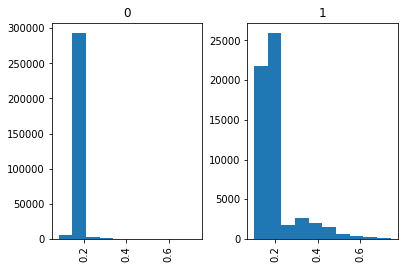

In [36]:
df_base_tr.merge(df_base_train[["key_value", "target"]], how="left", on="key_value").hist(column="prod_te", by="target")

,key_value,prod_te,target
0,631,0.080165,0
1,258619,0.081491,0
2,116256,0.081491,0
3,279979,0.082306,0
4,135675,0.083743,0
5,12440,0.084537,0
6,121964,0.084537,0
7,207170,0.084682,0
8,297696,0.084682,0
9,107427,0.084844,0


#### Pivoteando

In [11]:
def diff_months(codmes_ini, codmes_fin):
  r = relativedelta.relativedelta(datetime.strptime(str(int(codmes_fin)), '%Y%m'), datetime.strptime(str(int(codmes_ini)), '%Y%m'))
  return r.years*12 + r.months

In [17]:
df_rcc_train = df_rcc_train.merge(df_base_train[["key_value", "target"]], how="left", on="key_value")

In [ ]:
top_input_dict_inst = {0: 'top_prob_10', 1: 'top_prob_10', 2: 'top_prob_11', 3: 'top_prob_11', 4: 'top_prob_10', 5: 'top_prob_8', 6: 'top_prob_4', 7: 'top_prob_10', 8: 'top_prob_11', 9: 'top_prob_1', 10: 'top_prob_10', 11: 'top_prob_10', 12: 'top_prob_12', 13: 'top_prob_10', 14: 'top_prob_12', 15: 'top_prob_10', 16: 'top_prob_10', 17: 'top_prob_10', 18: 'top_prob_10', 19: 'top_prob_10', 20: 'top_prob_10', 21: 'top_prob_10', 22: 'top_prob_10', 23: 'top_prob_10', 24: 'top_prob_10', 25: 'top_prob_10', 26: 'top_prob_1', 27: 'top_prob_10', 28: 'top_prob_10', 29: 'top_prob_10', 30: 'top_prob_10', 31: 'top_prob_12', 32: 'top_prob_9', 33: 'top_prob_8', 34: 'top_prob_10', 35: 'top_prob_9', 36: 'top_prob_9', 37: 'top_prob_10', 38: 'top_prob_10', 39: 'top_prob_2', 40: 'top_prob_10', 41: 'top_prob_10', 42: 'top_prob_10', 43: 'top_prob_9', 44: 'top_prob_10', 45: 'top_prob_9', 46: 'top_prob_7', 47: 'top_prob_12', 48: 'top_prob_10', 49: 'top_prob_2', 50: 'top_prob_9', 51: 'top_prob_10', 52: 'top_prob_7', 53: 'top_prob_10', 54: 'top_prob_10', 55: 'top_prob_8', 56: 'top_prob_10', 57: 'top_prob_10', 58: 'top_prob_10', 59: 'top_prob_10', 60: 'top_prob_8', 61: 'top_prob_9', 62: 'top_prob_10', 63: 'top_prob_8', 64: 'top_prob_11', 65: 'top_prob_8', 66: 'top_prob_12', 67: 'top_prob_12', 68: 'top_prob_6', 69: 'top_prob_4', 70: 'top_prob_6', 71: 'top_prob_6', 72: 'top_prob_12', 73: 'top_prob_6', 74: 'top_prob_1', 75: 'top_prob_6', 76: 'top_prob_8', 77: 'top_prob_3', 78: 'top_prob_12', 79: 'top_prob_7', 80: 'top_prob_6', 81: 'top_prob_12', 82: 'top_prob_10', 83: 'top_prob_11', 84: 'top_prob_12', 85: 'top_prob_4', 86: 'top_prob_12', 87: 'top_prob_12', 88: 'top_prob_5', 89: 'top_prob_1', 90: 'top_prob_2', 91: 'top_prob_3', 92: 'top_prob_7', 93: 'top_prob_5', 94: 'top_prob_2', 95: 'top_prob_2', 96: 'top_prob_3', 97: 'top_prob_3', 98: 'top_prob_12', 99: 'top_prob_1', 100: 'top_prob_3', 101: 'top_prob_7', 102: 'top_prob_11', 103: 'top_prob_10', 104: 'top_prob_3', 105: 'top_prob_1', 106: 'top_prob_2', 107: 'top_prob_3', 108: 'top_prob_2'}
top_input_dict_prod = {0: 'top_prob_10', 1: 'top_prob_10', 2: 'top_prob_10', 3: 'top_prob_10', 4: 'top_prob_10', 5: 'top_prob_10', 6: 'top_prob_9', 7: 'top_prob_10', 8: 'top_prob_10', 9: 'top_prob_10', 10: 'top_prob_10', 11: 'top_prob_10', 12: 'top_prob_4', 13: 'top_prob_10', 14: 'top_prob_10', 15: 'top_prob_9', 16: 'top_prob_11', 17: 'top_prob_4', 18: 'top_prob_7', 19: 'top_prob_11', 20: 'top_prob_7', 21: 'top_prob_10', 22: 'top_prob_11', 23: 'top_prob_8', 24: 'top_prob_11', 25: 'top_prob_7', 27: 'top_prob_11', 28: 'top_prob_11', 29: 'top_prob_8', 30: 'top_prob_10', 31: 'top_prob_11', 32: 'top_prob_12', 33: 'top_prob_12', 34: 'top_prob_10', 35: 'top_prob_12', 36: 'top_prob_12', 37: 'top_prob_12', 38: 'top_prob_12', 39: 'top_prob_10', 40: 'top_prob_12', 41: 'top_prob_12', 255: 'top_prob_10'}

In [19]:
df_rcc_train.loc[df_rcc_train["cod_instit_financiera"].isin([5, 31, 58, 66, 67, 72, 74, 81, 83, 87, 98, 102, 103]), "cod_instit_financiera"] = -99
df_rcc_test["cod_instit_financiera"] = df_rcc_test["cod_instit_financiera"].fillna(-99).astype(int)

In [21]:
df_tmp_train = pd.pivot_table(df_rcc_train, index="codmes", columns="cod_instit_financiera", values="key_value", aggfunc="nunique", dropna=False).T
df_tmp_train["q_mean"] = df_tmp_train.mean(axis=1)
df_tmp_train = df_tmp_train.merge(df_rcc_train.groupby("cod_instit_financiera", as_index=False).agg({"target": "mean"}), how="left", on="cod_instit_financiera")
df_tmp_train.to_csv("[01] Intermediate/instit_finan_train_over.csv")

In [22]:
df_tmp_train.head()

,cod_instit_financiera,201703,201704,201705,201706,201707,201708,201709,201710,201711,201712,201801,201802,q_mean,target
0,-99,1336.0,1355.0,1379.0,148.0,120.0,117.0,98.0,10.0,10.0,9.0,10.0,10.0,383.500000,0.138721
1,0,37931.0,37816.0,37432.0,37208.0,37084.0,37291.0,37044.0,37291.0,37620.0,37993.0,39588.0,42487.0,38065.416667,0.111038
2,1,54063.0,54381.0,54992.0,55592.0,56231.0,55725.0,56426.0,56560.0,57193.0,58012.0,59443.0,61666.0,56690.333333,0.132197
3,2,28621.0,28835.0,29156.0,29419.0,29730.0,29717.0,29845.0,29602.0,29860.0,30112.0,30783.0,33559.0,29936.583333,0.105804
4,3,21976.0,21966.0,21951.0,22163.0,22286.0,22327.0,22594.0,22791.0,23042.0,23406.0,24251.0,27762.0,23042.916667,0.102431


In [23]:
df_tmp_test = pd.pivot_table(df_rcc_test, index="codmes", columns="cod_instit_financiera", values="key_value", aggfunc="nunique", dropna=False).T
df_tmp_test["q_mean"] = df_tmp_test.mean(axis=1)
df_tmp_test.to_csv("[01] Intermediate/instit_finan_test_over.csv")

In [ ]:
### Producto
top_freq_products = [1, 2, 3, 8, 255, 4, 0, 6]
top_propensity_products = [12, 17, 18, 25, 20]
low_propensity_products = [32, 33, 35, 36, 37, 38, 40, 41]
list_product = top_freq_products + top_propensity_products + low_propensity_products
print(list_product)


df_rcc_test["PRODUCTO"] = df_rcc_test["PRODUCTO"].fillna(255)
df_rcc_test["PRODUCTO"] = df_rcc_test["PRODUCTO"].astype(int)


cat_col = "PRODUCTO"
df_rcc_train.loc[~df_rcc_train[cat_col].isin(list_product), "new_" + cat_col] = "OTROS"
df_rcc_train.loc[df_rcc_train[cat_col].isin(top_propensity_products), "new_" + cat_col] = "TOP_PROPENSITY"
df_rcc_train.loc[df_rcc_train[cat_col].isin(low_propensity_products), "new_" + cat_col] = "LOW_PROPENSITY"

df_rcc_test.loc[~df_rcc_test[cat_col].isin(list_product), cat_col] = "OTROS"
df_rcc_test.loc[df_rcc_test[cat_col].isin(top_propensity_products), cat_col] = "TOP_PROPENSITY"
df_rcc_test.loc[df_rcc_test[cat_col].isin(low_propensity_products), cat_col] = "LOW_PROPENSITY"

### Institucion Financiera
top_freq_instits = [34, 1, 10, 28, 11, 37, 0, 2]
top_propensity_instits = [9, 26, 89, 105, 99, 39, 97, 90, 108, 106, 107, 95, 49, 94, 100, 77, 91, 96, 6, 69, 104, 85, 70, 88, 93, 101, 75, 80, 73, 76, 52, 46, 68, 71, 92, 63, 60, 55, 65] # [74, 5]
low_propensity_instits = [12, 86, 47, 14, 78, 84] #[67, 66, 87, 98, 72, 31, 81]
list_instit = top_freq_instits + top_propensity_instits + low_propensity_instits
print(list_instit)


df_rcc_test["cod_instit_financiera"] = df_rcc_test["cod_instit_financiera"].fillna(255)
df_rcc_test["cod_instit_financiera"] = df_rcc_test["cod_instit_financiera"].astype(int)

df_rcc_train["cod_instit_financiera"] = df_rcc_train["cod_instit_financiera"]
df_rcc_train.loc[df_rcc_train["cod_instit_financiera"].isin(top_propensity_instits), "cod_instit_financiera"] = "TOP_PROPENSITY"
df_rcc_train.loc[df_rcc_train["cod_instit_financiera"].isin(low_propensity_instits), "cod_instit_financiera"] = "LOW_PROPENSITY"
df_rcc_train.loc[~df_rcc_train["cod_instit_financiera"].isin(list_instit), "cod_instit_financiera"] = "OTROS"


df_rcc_test["cod_instit_financiera"] = df_rcc_test["cod_instit_financiera"]
df_rcc_test.loc[df_rcc_test["cod_instit_financiera"].isin(top_propensity_instits), "cod_instit_financiera"] = "TOP_PROPENSITY"
df_rcc_test.loc[df_rcc_test["cod_instit_financiera"].isin(low_propensity_instits), "cod_instit_financiera"] = "LOW_PROPENSITY"
df_rcc_test.loc[~df_rcc_test["cod_instit_financiera"].isin(list_instit), "cod_instit_financiera"] = "OTROS"


df_rcc_train["condicion_cat"] = df_rcc_train["condicion"].apply(lambda c: 0 if c == 0 else "00_03" if c < 90 else  "03_06" if c < 180 else "06_12" if c < 365 else "12-32" if c < 960 else ">32")
df_rcc_test["condicion_cat"] = df_rcc_test["condicion"].apply(lambda c: 0 if c == 0 else "00_03" if c < 90 else  "03_06" if c < 180 else "06_12" if c < 365 else "12-32" if c < 960 else ">32")

In [ ]:
def hist_feat_generator_per_cat(cat_col, numeric_value, agg_func, df_base, df_base_test):

  df_rcc_crosstab = (pd.crosstab(index=[df_rcc_train.key_value, df_rcc_train.codmes], 
                                columns=df_rcc_train[cat_col], 
                                values=df_rcc_train[numeric_value],
                                aggfunc=agg_func)
                      .reset_index(drop=False)
                      .reset_index(drop=True))
  df_rcc_crosstab.columns = ["{0}_{1}_FOR_{2}_{3}".format(numeric_value.upper(), agg_func.upper(), cat_col, c) if c not in ["key_value", "codmes"] else c for c in df_rcc_crosstab.columns]

  feat_cols = [c for c in df_rcc_crosstab.columns if "{0}_".format(cat_col) in c]
  df_rcc_crosstab["MEAN_OF_{0}_{1}_FOR_ALL_{2}".format(numeric_value.upper(), agg_func.upper(), cat_col)] = df_rcc_crosstab[feat_cols].mean(axis=1)
  df_rcc_crosstab["SUM_OF_{0}_{1}_FOR_ALL_{2}".format(numeric_value.upper(), agg_func.upper(), cat_col)] = df_rcc_crosstab[feat_cols].sum(axis=1)
  df_rcc_crosstab["COUNT_OF_{0}_{1}_FOR_ALL_{2}".format(numeric_value.upper(), agg_func.upper(), cat_col)] = df_rcc_crosstab[feat_cols].count(axis=1)

  df_rcc_test_crosstab = (pd.crosstab(index=[df_rcc_test.key_value, df_rcc_test.codmes], 
                                columns=df_rcc_test[cat_col], 
                                values=df_rcc_test[numeric_value],
                                aggfunc=agg_func)
                      .reset_index(drop=False)
                      .reset_index(drop=True))
  df_rcc_test_crosstab.columns = ["{0}_{1}_FOR_{2}_{3}".format(numeric_value.upper(), agg_func.upper(), cat_col, c) if c not in ["key_value", "codmes"] else c for c in df_rcc_test_crosstab.columns]

  feat_cols = [c for c in df_rcc_test_crosstab.columns if "{0}_".format(cat_col) in c]
  df_rcc_test_crosstab["MEAN_OF_{0}_{1}_FOR_ALL_{2}".format(numeric_value.upper(), agg_func.upper(), cat_col)] = df_rcc_test_crosstab[feat_cols].mean(axis=1)
  df_rcc_test_crosstab["SUM_OF_{0}_{1}_FOR_ALL_{2}".format(numeric_value.upper(), agg_func.upper(), cat_col)] = df_rcc_test_crosstab[feat_cols].sum(axis=1)
  df_rcc_test_crosstab["COUNT_OF_{0}_{1}_FOR_ALL_{2}".format(numeric_value.upper(), agg_func.upper(), cat_col)] = df_rcc_test_crosstab[feat_cols].count(axis=1)

  agg_col_dict = {"codmes": ["last", "first"]}
  agg_col_dict.update({c: ["mean", "sum", "count"] for c in df_rcc_crosstab.columns if c not in ["key_value", "codmes"]})

  for month_level in ["U03M", "U06M", "U12M"]:
    print("\t\t\tFeatures at month level: {0}".format(month_level))
    df_rcc_agg = (df_rcc_crosstab.loc[df_rcc_crosstab["codmes"].isin(month_dict[month_level])]
                                .groupby(["key_value"], as_index=False)
                                .agg(agg_col_dict)
                    )
    df_rcc_agg.columns = [month_level + "_" + "_".join(c).upper() if c[-1] != "" else c[0] for c in df_rcc_agg.columns]

    df_rcc_agg["{0}_RECENCY_FOR_{1}".format(month_level, cat_col)] = df_rcc_agg.apply(lambda row: diff_months(row["{0}_CODMES_LAST".format(month_level)], 201803), axis=1)
    df_rcc_agg["{0}_LONG_RECENCY_FOR_{1}".format(month_level, cat_col)] = df_rcc_agg.apply(lambda row: diff_months(row["{0}_CODMES_FIRST".format(month_level)], 201803), axis=1)
    df_rcc_agg["{0}_DIFF_MONTHS_FIRST_LAST_FOR_{1}".format(month_level, cat_col)] = df_rcc_agg.apply(lambda row: diff_months(row["{0}_CODMES_FIRST".format(month_level)], row["{0}_CODMES_LAST".format(month_level)]), axis=1)
    del df_rcc_agg["{0}_CODMES_FIRST".format(month_level, cat_col)]
    del df_rcc_agg["{0}_CODMES_LAST".format(month_level, cat_col)]

    df_rcc_test_agg = (df_rcc_test_crosstab.loc[df_rcc_test_crosstab["codmes"].isin(month_dict_test[month_level])]
                                .groupby(["key_value"], as_index=False)
                                .agg(agg_col_dict)
                       )
    df_rcc_test_agg.columns = [month_level + "_" + "_".join(c).upper() if c[-1] != "" else c[0] for c in df_rcc_test_agg.columns]
    
    df_rcc_test_agg["{0}_RECENCY_FOR_{1}".format(month_level, cat_col)] = df_rcc_test_agg.apply(lambda row: diff_months(row["{0}_CODMES_LAST".format(month_level)], 201903), axis=1)
    df_rcc_test_agg["{0}_LONG_RECENCY_FOR_{1}".format(month_level, cat_col)] = df_rcc_test_agg.apply(lambda row: diff_months(row["{0}_CODMES_FIRST".format(month_level)], 201903), axis=1)
    df_rcc_test_agg["{0}_DIFF_MONTHS_FIRST_LAST_FOR_{1}".format(month_level, cat_col)] = df_rcc_test_agg.apply(lambda row: diff_months(row["{0}_CODMES_FIRST".format(month_level)], row["{0}_CODMES_LAST".format(month_level)]), axis=1)
    del df_rcc_test_agg["{0}_CODMES_FIRST".format(month_level, cat_col)]
    del df_rcc_test_agg["{0}_CODMES_LAST".format(month_level, cat_col)]

    df_base = df_base.merge(df_rcc_agg, how="left", on="key_value")
    df_base_test = df_base_test.merge(df_rcc_test_agg, how="left", on="key_value")

  return df_base, df_base_test

In [12]:
df_rcc_train_agg_nunique.columns = ["rcc_" + c if c not in ["key_value"] else c for c in df_rcc_train_agg_nunique.columns]
df_rcc_test_agg_nunique.columns = ["rcc_" + c if c not in ["key_value"] else c for c in df_rcc_test_agg_nunique.columns]

In [42]:
del df_rcc_train_agg_nunique
del df_rcc_test_agg_nunique

In [9]:
df_rcc_train_agg_nunique = df_rcc_train_agg_nunique.merge(df_base_train, how="left", on="key_value")
df_rcc_test_agg_nunique = df_rcc_test_agg_nunique.merge(df_base_test, how="left", on="key_value")

In [15]:
from itertools import product

In [16]:
map_dict_train = {201802: "U01M", 201801: "U02M", 201712: "U03M",
                  201711: "U04M", 201710: "U05M", 201709: "U06M",
                  201708: "U07M", 201707: "U08M", 201706: "U09M",
                  201705: "U10M", 201704: "U11M", 201703: "U12M"
                  }

map_dict_test = {201902: "U01M", 201901: "U02M", 201812: "U03M",
                  201811: "U04M", 201810: "U05M", 201809: "U06M",
                  201808: "U07M", 201807: "U08M", 201806: "U09M",
                  201805: "U10M", 201804: "U11M", 201803: "U12M"
                  }

In [17]:
combination_list = [{"RIESGO_DIRECTO": d[0], "COD_CLASIFICACION_DEUDOR": d[1]} for d in product([-1, 1, 2, 3], [0, 1, 2, 3, 4, 5])]

df_rcc_train_agg_month = df_rcc_train.loc[(df_rcc_train["RIESGO_DIRECTO"] == -1) &
                                            (df_rcc_train["COD_CLASIFICACION_DEUDOR"] == 0)]\
                                      .groupby(["key_value", "codmes"], as_index=False)\
                                      .agg({"PRODUCTO": "count"})

filter_col = "RIESGO_DIRECTO_COD_CLASIFICACION_DEUDOR"
filter_value = "{0}_{1}".format(str(-1), str(0))

df_rcc_train_agg_month["codmes"] = df_rcc_train_agg_month["codmes"].map(map_dict_train)

df_rcc_train_agg_month = pd.crosstab(index=[df_rcc_train_agg_month.key_value],
                                    columns=df_rcc_train_agg_month.codmes,
                                    values=df_rcc_train_agg_month["PRODUCTO"],
                                    aggfunc="sum")\
                            .reset_index(drop=False)

month_col_list = [c for c in df_rcc_train_agg_month.columns if c not in ["key_value", "codmes"]]

df_rcc_train_agg_month["NULL_COUNT_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_train_agg_month[month_col_list].isnull().sum(axis=1)
df_rcc_train_agg_month["PRODUCT_COUNT_MEAN_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_train_agg_month[month_col_list].mean(axis=1)
df_rcc_train_agg_month["PRODUCT_COUNT_SUM_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_train_agg_month[month_col_list].sum(axis=1)
df_rcc_train_agg_month["PRODUCT_COUNT_MIN_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_train_agg_month[month_col_list].min(axis=1)
df_rcc_train_agg_month["PRODUCT_COUNT_MAX_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_train_agg_month[month_col_list].max(axis=1)
df_rcc_train_agg_month["PRODUCT_COUNT_STD_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_train_agg_month[month_col_list].std(axis=1)

df_rcc_train_agg_month = df_rcc_train_agg_month.fillna(0)

df_rcc_train_agg_month["REAL_PRODUCT_COUNT_MEAN_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_train_agg_month[month_col_list].mean(axis=1)
df_rcc_train_agg_month["REAL_PRODUCT_COUNT_MIN_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_train_agg_month[month_col_list].min(axis=1)
df_rcc_train_agg_month["REAL_PRODUCT_COUNT_STD_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_train_agg_month[month_col_list].std(axis=1)

df_rcc_train_agg_month = df_rcc_train_agg_month.rename(columns={c:"{0}_FOR_{1}_EQ_{2}".format(c, filter_col, filter_value) for c in month_col_list})

In [ ]:
#df_rcc_train["RIESGO_DIRECTO_COD_CLAS_DEUDOR"] = df_rcc_train.apply(lambda row: "{0}_{1}".format(row["RIESGO_DIRECTO"], row["COD_CLASIFICACION_DEUDOR"]), axis=1)
#df_rcc_test["RIESGO_DIRECTO_COD_CLAS_DEUDOR"] = df_rcc_test.apply(lambda row: "{0}_{1}".format(row["RIESGO_DIRECTO"], row["COD_CLASIFICACION_DEUDOR"]), axis=1)

#df_rcc_train.loc[~pd.notnull(df_rcc_test["RIESGO_DIRECTO"])]
#[(i, j) for i, j in zip(df_rcc_train["RIESGO_DIRECTO"].unique(), df_rcc_train["COD_CLASIFICACION_DEUDOR"].unique())]
#sorted(df_rcc_train["tipo_credito"].unique())
#sorted(df_rcc_train["RIESGO_DIRECTO"].unique())
#sorted(df_rcc_test["RIESGO_DIRECTO"].unique())
#sorted(df_rcc_train["COD_CLASIFICACION_DEUDOR"].unique())
#sorted(df_rcc_test["COD_CLASIFICACION_DEUDOR"].unique())

[6, 8, 9, 10, 11, 12, 13, 99]

In [18]:
#df_riesgo_tmp.groupby(201802, as_index=False).agg({"target": ["mean", "count"]}).head(30)
#pd.pivot_table(df_rcc_train_agg_month, index="key_value", columns="codmes", values="PRODUCTO", aggfunc="sum", fill_value=0)

In [20]:
filter_col = "RIESGO_DIRECTO"
filter_value = -1

def get_features(d):
  df_rcc_train_agg_month = df_rcc_train.loc[(df_rcc_train["RIESGO_DIRECTO"] == d["RIESGO_DIRECTO"]) &
                                            (df_rcc_train["COD_CLASIFICACION_DEUDOR"] == d["COD_CLASIFICACION_DEUDOR"])]\
                                      .groupby(["key_value", "codmes"], as_index=False)\
                                      .agg({"PRODUCTO": "count"})
  
  df_rcc_test_agg_month = df_rcc_test.loc[(df_rcc_test["RIESGO_DIRECTO"] == d["RIESGO_DIRECTO"]) &
                                            (df_rcc_test["COD_CLASIFICACION_DEUDOR"] == d["COD_CLASIFICACION_DEUDOR"])]\
                                      .groupby(["key_value", "codmes"], as_index=False)\
                                      .agg({"PRODUCTO": "count"})
  
  filter_col = "RIESGO_DIRECTO_COD_CLASIFICACION_DEUDOR"
  filter_value = "{0}_{1}".format(str(d["RIESGO_DIRECTO"]), str(d["COD_CLASIFICACION_DEUDOR"]))

  if df_rcc_train_agg_month.shape[0] > 0:

    df_rcc_train_agg_month["codmes"] = df_rcc_train_agg_month["codmes"].map(map_dict_train)
    df_rcc_train_agg_month = pd.crosstab(index=[df_rcc_train_agg_month.key_value],
                                        columns=df_rcc_train_agg_month.codmes,
                                        values=df_rcc_train_agg_month["PRODUCTO"],
                                        aggfunc="sum")\
                                .reset_index(drop=False)
    
    df_rcc_test_agg_month["codmes"] = df_rcc_test_agg_month["codmes"].map(map_dict_test)
    df_rcc_test_agg_month = pd.crosstab(index=[df_rcc_test_agg_month.key_value],
                                        columns=df_rcc_test_agg_month.codmes,
                                        values=df_rcc_test_agg_month["PRODUCTO"],
                                        aggfunc="sum")\
                                .reset_index(drop=False)

    month_col_list = [c for c in df_rcc_train_agg_month.columns if c not in ["key_value", "codmes"]]
    
    df_rcc_train_agg_month["NULL_COUNT_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_train_agg_month[month_col_list].isnull().sum(axis=1)
    df_rcc_train_agg_month["PRODUCT_COUNT_MEAN_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_train_agg_month[month_col_list].mean(axis=1)
    df_rcc_train_agg_month["PRODUCT_COUNT_SUM_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_train_agg_month[month_col_list].sum(axis=1)
    df_rcc_train_agg_month["PRODUCT_COUNT_MIN_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_train_agg_month[month_col_list].min(axis=1)
    df_rcc_train_agg_month["PRODUCT_COUNT_MAX_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_train_agg_month[month_col_list].max(axis=1)
    df_rcc_train_agg_month["PRODUCT_COUNT_STD_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_train_agg_month[month_col_list].std(axis=1)

    df_rcc_train_agg_month = df_rcc_train_agg_month.fillna(0)

    df_rcc_train_agg_month["REAL_PRODUCT_COUNT_MEAN_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_train_agg_month[month_col_list].mean(axis=1)
    df_rcc_train_agg_month["REAL_PRODUCT_COUNT_MIN_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_train_agg_month[month_col_list].min(axis=1)
    df_rcc_train_agg_month["REAL_PRODUCT_COUNT_STD_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_train_agg_month[month_col_list].std(axis=1)

    df_rcc_train_agg_month = df_rcc_train_agg_month.rename(columns={c:"{0}_FOR_{1}_EQ_{2}".format(c, filter_col, filter_value) for c in month_col_list})

    df_rcc_test_agg_month["NULL_COUNT_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_test_agg_month[month_col_list].isnull().sum(axis=1)
    df_rcc_test_agg_month["PRODUCT_COUNT_MEAN_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_test_agg_month[month_col_list].mean(axis=1)
    df_rcc_test_agg_month["PRODUCT_COUNT_SUM_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_test_agg_month[month_col_list].sum(axis=1)
    df_rcc_test_agg_month["PRODUCT_COUNT_MIN_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_test_agg_month[month_col_list].min(axis=1)
    df_rcc_test_agg_month["PRODUCT_COUNT_MAX_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_test_agg_month[month_col_list].max(axis=1)
    df_rcc_test_agg_month["PRODUCT_COUNT_STD_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_test_agg_month[month_col_list].std(axis=1)

    df_rcc_test_agg_month = df_rcc_test_agg_month.fillna(0)

    df_rcc_test_agg_month["REAL_PRODUCT_COUNT_MEAN_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_test_agg_month[month_col_list].mean(axis=1)
    df_rcc_test_agg_month["REAL_PRODUCT_COUNT_MIN_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_test_agg_month[month_col_list].min(axis=1)
    df_rcc_test_agg_month["REAL_PRODUCT_COUNT_STD_FOR_{0}_EQ_{1}".format(filter_col, filter_value)] = df_rcc_test_agg_month[month_col_list].std(axis=1)

    df_rcc_test_agg_month = df_rcc_test_agg_month.rename(columns={c:"{0}_FOR_{1}_EQ_{2}".format(c, filter_col, filter_value) for c in month_col_list})

    return True, df_rcc_train_agg_month, df_rcc_test_agg_month
  
  else:

    return False, None, None

In [22]:
df_base_train_all = df_base_train[["key_value"]].copy()
df_base_test_all = df_base_test[["key_value"]].copy()

for i, d in enumerate(combination_list):
  print(i, combination_list[i])

  has_data, df_rcc_train_agg_month, df_rcc_test_agg_month = get_features(d)
  
  if has_data:
    df_base_train_all = df_base_train_all.merge(df_rcc_train_agg_month, how="left", on="key_value")
    df_base_test_all = df_base_test_all.merge(df_rcc_test_agg_month, how="left", on="key_value")

for col_ in [c for c in df_base_train_all.columns if "NULL_COUNT_FOR_" in c]:
  df_base_train_all[col_] = df_base_train_all[col_].fillna(12)

df_base_train_all = df_base_train_all.fillna(0)

0 {'RIESGO_DIRECTO': -1, 'COD_CLASIFICACION_DEUDOR': 0}
1 {'RIESGO_DIRECTO': -1, 'COD_CLASIFICACION_DEUDOR': 1}
2 {'RIESGO_DIRECTO': -1, 'COD_CLASIFICACION_DEUDOR': 2}
3 {'RIESGO_DIRECTO': -1, 'COD_CLASIFICACION_DEUDOR': 3}
4 {'RIESGO_DIRECTO': -1, 'COD_CLASIFICACION_DEUDOR': 4}
5 {'RIESGO_DIRECTO': -1, 'COD_CLASIFICACION_DEUDOR': 5}
6 {'RIESGO_DIRECTO': 1, 'COD_CLASIFICACION_DEUDOR': 0}
7 {'RIESGO_DIRECTO': 1, 'COD_CLASIFICACION_DEUDOR': 1}
8 {'RIESGO_DIRECTO': 1, 'COD_CLASIFICACION_DEUDOR': 2}
9 {'RIESGO_DIRECTO': 1, 'COD_CLASIFICACION_DEUDOR': 3}
10 {'RIESGO_DIRECTO': 1, 'COD_CLASIFICACION_DEUDOR': 4}
11 {'RIESGO_DIRECTO': 1, 'COD_CLASIFICACION_DEUDOR': 5}
12 {'RIESGO_DIRECTO': 2, 'COD_CLASIFICACION_DEUDOR': 0}
13 {'RIESGO_DIRECTO': 2, 'COD_CLASIFICACION_DEUDOR': 1}
14 {'RIESGO_DIRECTO': 2, 'COD_CLASIFICACION_DEUDOR': 2}
15 {'RIESGO_DIRECTO': 2, 'COD_CLASIFICACION_DEUDOR': 3}
16 {'RIESGO_DIRECTO': 2, 'COD_CLASIFICACION_DEUDOR': 4}
17 {'RIESGO_DIRECTO': 2, 'COD_CLASIFICACION_DEUDOR':

In [ ]:
df_rcc_train_to_export = df_rcc_train_agg_nunique.merge(df_base_train_all, how="left", on="key_value")
df_rcc_test_to_export = df_rcc_test_agg_nunique.merge(df_base_test_all, how="left", on="key_value")

In [32]:
df_rcc_train_to_export.to_csv("[01] Intermediate/ds_rcc.csv", index=False)
df_rcc_test_to_export.to_csv("[01] Intermediate/ds_rcc_test.csv", index=False)

In [36]:
#df_base_train_all_tmp = df_base_train_all.merge(df_base_train[["key_value", "target"]], how="left", on="key_value")
#num_cols = [c for c in df_base_train_all_tmp.columns if c not in ["key_value", "target"]]
#get_univariate_plots(data=df_base_train_all_tmp, target_col='target', features_list=num_cols, bins=10)

In [ ]:
df_base_train_all.to_csv("[01] Intermediate/ds_rcc_feat_combination_train.csv", index=False)
df_base_test_all.to_csv("[01] Intermediate/ds_rcc_feat_combination_test.csv", index=False)

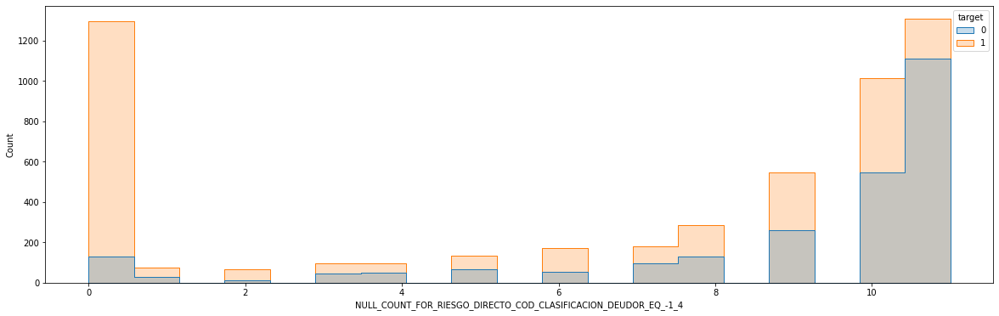

In [ ]:
plt.figure(figsize=(20, 6))
sns.histplot(df_rcc_train_agg_month, x="NULL_COUNT_FOR_RIESGO_DIRECTO_COD_CLASIFICACION_DEUDOR_EQ_-1_4", hue="target", element="step")

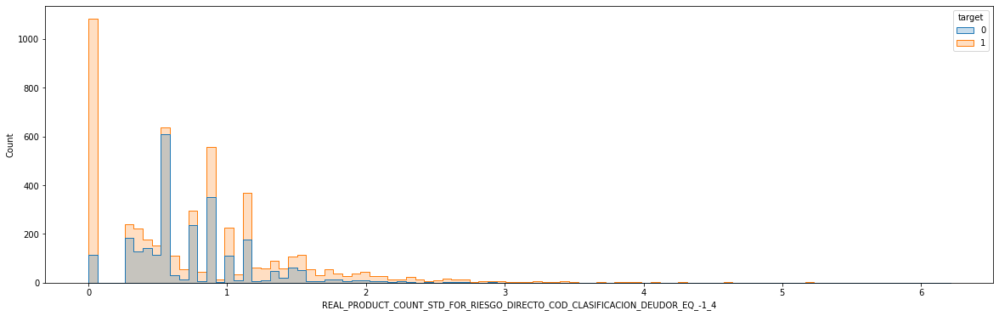

In [ ]:
plt.figure(figsize=(20, 6))
sns.histplot(df_rcc_train_agg_month, x="REAL_PRODUCT_COUNT_STD_FOR_RIESGO_DIRECTO_COD_CLASIFICACION_DEUDOR_EQ_-1_4", hue="target", element="step")

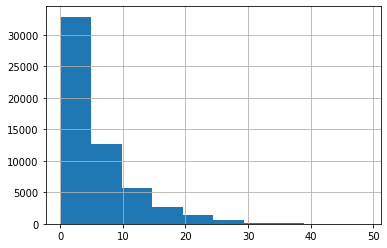

In [ ]:
df_rcc_train_agg_month.loc[df_rcc_train_agg_month['target'] == 1, "REAL_PRODUCT_COUNT_MEAN"].hist()

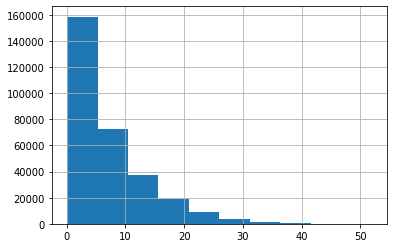

In [ ]:
df_rcc_train_agg_month.loc[df_rcc_train_agg_month['target'] == 0, "REAL_PRODUCT_COUNT_MEAN"].hist()

In [ ]:
df_nuevos = df_rcc_train.loc[(df_rcc_train["codmes"] == 201802) & 
                 ~(df_rcc_train["key_value"].isin(df_rcc_train.loc[df_rcc_train["codmes"] != 201802, "key_value"].unique())), ["key_value"]].drop_duplicates()

In [ ]:
df_base_train["target"].mean()

0.15819262623191357

In [ ]:
df_nuevos.merge(df_base_train, how="left", on="key_value").describe()

,key_value,target
count,40165.000000,40165.000000
mean,205629.781003,0.121997
std,108777.701115,0.327286
min,10.000000,0.000000
25%,110460.000000,0.000000
50%,214878.000000,0.000000
75%,307385.000000,0.000000
max,358486.000000,1.000000


In [ ]:
df_rcc_test.groupby("codmes", as_index=False).agg({"key_value": "nunique"})

,codmes,key_value
0,201803,304407
1,201804,307786
2,201805,311221
3,201806,314598
4,201807,319240
5,201808,321742
6,201809,323546
7,201810,327975
8,201811,329841
9,201812,327683


In [ ]:
df_rcc_test.loc[(df_rcc_test["codmes"] == 201902) & 
                 ~(df_rcc_test["key_value"].isin(df_rcc_test.loc[df_rcc_test["codmes"] != 201902, "key_value"].unique())), "key_value"].nunique()

42267

In [ ]:
df_rcc_train["COD_CLASIFICACION_DEUDOR"].unique(), df_rcc_test["COD_CLASIFICACION_DEUDOR"].unique()

(array([1, 2, 6, 4, 5, 3], dtype=uint8),
 array([1, 2, 6, 4, 3, 5], dtype=uint8))

In [ ]:
df_rcc_train["RIESGO_DIRECTO"].unique(), df_rcc_test["RIESGO_DIRECTO"].unique()

(array([1, 3, 4, 5, 7]), array([1, 3, 4, 5, 7]))

In [ ]:
df_rcc_train["COD_CLASIFICACION_DEUDOR"] = df_rcc_train["COD_CLASIFICACION_DEUDOR"] + 1
df_rcc_train["RIESGO_DIRECTO"] = df_rcc_train["RIESGO_DIRECTO"] + 2

df_rcc_test["COD_CLASIFICACION_DEUDOR"] = df_rcc_test["COD_CLASIFICACION_DEUDOR"] + 1
df_rcc_test["RIESGO_DIRECTO"] = df_rcc_test["RIESGO_DIRECTO"] + 2

### Historical Features

In [ ]:
from scipy.stats import hmean, gmean, kurtosis, skew, entropy

#### Count, sum, min, max, mean

In [ ]:
df_rcc_train_agg = (df_rcc_train.groupby(["key_value", "codmes"], as_index=False)
                                .agg({
                                        "saldo": ["count", "sum", "min", "max", "mean"],
                                        "condicion": ["sum", "min", "max", "mean"],
                                        "COD_CLASIFICACION_DEUDOR": ["sum", "min", "max", "mean"],
                                        "RIESGO_DIRECTO": ["sum", "min", "max", "mean"],
                                }))

In [ ]:
df_rcc_test_agg = (df_rcc_test.groupby(["key_value", "codmes"], as_index=False)
                                .agg({
                                        "saldo": ["count", "sum", "min", "max", "mean"],
                                        "condicion": ["sum", "min", "max", "mean"],
                                        "COD_CLASIFICACION_DEUDOR": ["sum", "min", "max", "mean"],
                                        "RIESGO_DIRECTO": ["sum", "min", "max", "mean"],
                                }))

In [ ]:
df_rcc_train_agg.columns = ["_".join(c) if c[-1] != "" else c[0] for c in df_rcc_train_agg.columns]
df_rcc_test_agg.columns = ["_".join(c) if c[-1] != "" else c[0] for c in df_rcc_test_agg.columns]

In [ ]:
df_rcc_train_agg.head()

,key_value,codmes,saldo_count,saldo_sum,saldo_min,saldo_max,saldo_mean,condicion_sum,condicion_min,condicion_max,condicion_mean,COD_CLASIFICACION_DEUDOR_sum,COD_CLASIFICACION_DEUDOR_min,COD_CLASIFICACION_DEUDOR_max,COD_CLASIFICACION_DEUDOR_mean,RIESGO_DIRECTO_sum,RIESGO_DIRECTO_min,RIESGO_DIRECTO_max,RIESGO_DIRECTO_mean
0,0,201703,4,3.777921,0.927186,0.961819,0.944480,0,0,0,0.0,4.0,1,1,1.0,6,1,3,1.5
1,0,201704,5,4.705365,0.927186,0.961819,0.941073,0,0,0,0.0,5.0,1,1,1.0,7,1,3,1.4
2,0,201705,5,4.705208,0.927186,0.961819,0.941042,0,0,0,0.0,5.0,1,1,1.0,7,1,3,1.4
3,0,201706,5,4.705231,0.927186,0.961819,0.941046,0,0,0,0.0,5.0,1,1,1.0,7,1,3,1.4
4,0,201707,5,4.705533,0.927186,0.961819,0.941107,0,0,0,0.0,5.0,1,1,1.0,7,1,3,1.4


In [ ]:
col_num = [c for c in df_rcc_train_agg.columns if c not in ["key_value", "codmes"]]
#['saldo_count', 'saldo_sum', 'saldo_min', 'saldo_max', 'saldo_mean', 'condicion_sum', 'condicion_min', 'condicion_max', 'condicion_mean']

In [ ]:
import time

In [ ]:
for col_ in col_num:
    print("Numeric Feature: {0}".format(col_))
    ti = time.time()
    df_rcc_train_agg["last{0}".format(col_)] = df_rcc_train_agg.groupby("key_value")[col_].shift(1)
    df_rcc_test_agg["last{0}".format(col_)] = df_rcc_test_agg.groupby("key_value")[col_].shift(1)
  
    if col_ == "codmes":
        df_rcc_train_agg["difflast{0}".format(col_)] = df_rcc_train_agg.apply(lambda row: diff_months(row["last{0}".format(col_)], row[col_]), axis=1)
        df_rcc_test_agg["difflast{0}".format(col_)] = df_rcc_test_agg.apply(lambda row: diff_months(row["last{0}".format(col_)], row[col_]), axis=1)
    else:
        df_rcc_train_agg["difflast{0}".format(col_)] = df_rcc_train_agg.apply(lambda row: row[col_] - row["last{0}".format(col_)], axis=1)
        df_rcc_test_agg["difflast{0}".format(col_)] = df_rcc_test_agg.apply(lambda row: row[col_] - row["last{0}".format(col_)], axis=1)
  
    df_rcc_train_agg["absdifflast{0}".format(col_)] = abs(df_rcc_train_agg["difflast{0}".format(col_)])
    df_rcc_test_agg["absdifflast{0}".format(col_)] = abs(df_rcc_test_agg["difflast{0}".format(col_)])

    df_rcc_train_agg.loc[pd.notnull(df_rcc_train_agg["difflast{0}".format(col_)]), "incrflag{0}".format(col_)] = df_rcc_train_agg.loc[pd.notnull(df_rcc_train_agg["difflast{0}".format(col_)]), "difflast{0}".format(col_)].apply(lambda c: 1 if c > 0 else 0)
    df_rcc_train_agg.loc[pd.notnull(df_rcc_train_agg["difflast{0}".format(col_)]), "decrflag{0}".format(col_)] = df_rcc_train_agg.loc[pd.notnull(df_rcc_train_agg["difflast{0}".format(col_)]), "difflast{0}".format(col_)].apply(lambda c: 1 if c < 0 else 0)
    df_rcc_train_agg.loc[pd.notnull(df_rcc_train_agg["difflast{0}".format(col_)]), "sameflag{0}".format(col_)] = df_rcc_train_agg.loc[pd.notnull(df_rcc_train_agg["difflast{0}".format(col_)]), "difflast{0}".format(col_)].apply(lambda c: 1 if c == 0 else 0)

    df_rcc_test_agg.loc[pd.notnull(df_rcc_test_agg["difflast{0}".format(col_)]), "incrflag{0}".format(col_)] = df_rcc_test_agg.loc[pd.notnull(df_rcc_test_agg["difflast{0}".format(col_)]), "difflast{0}".format(col_)].apply(lambda c: 1 if c > 0 else 0)
    df_rcc_test_agg.loc[pd.notnull(df_rcc_test_agg["difflast{0}".format(col_)]), "decrflag{0}".format(col_)] = df_rcc_test_agg.loc[pd.notnull(df_rcc_test_agg["difflast{0}".format(col_)]), "difflast{0}".format(col_)].apply(lambda c: 1 if c < 0 else 0)
    df_rcc_test_agg.loc[pd.notnull(df_rcc_test_agg["difflast{0}".format(col_)]), "sameflag{0}".format(col_)] = df_rcc_test_agg.loc[pd.notnull(df_rcc_test_agg["difflast{0}".format(col_)]), "difflast{0}".format(col_)].apply(lambda c: 1 if c == 0 else 0)

    tf = time.time()
    print("\tCalculo de variables en {0:.2f} segundos.".format(tf-ti))

Numeric Feature: saldo_count
	Calculo de variables en 103.53 segundos.
Numeric Feature: saldo_sum
	Calculo de variables en 102.50 segundos.
Numeric Feature: saldo_min
	Calculo de variables en 102.55 segundos.
Numeric Feature: saldo_max
	Calculo de variables en 103.96 segundos.
Numeric Feature: saldo_mean
	Calculo de variables en 106.37 segundos.
Numeric Feature: condicion_sum
	Calculo de variables en 109.15 segundos.
Numeric Feature: condicion_min
	Calculo de variables en 107.45 segundos.
Numeric Feature: condicion_max
	Calculo de variables en 112.78 segundos.
Numeric Feature: condicion_mean
	Calculo de variables en 115.14 segundos.
Numeric Feature: COD_CLASIFICACION_DEUDOR_sum
	Calculo de variables en 129.62 segundos.
Numeric Feature: COD_CLASIFICACION_DEUDOR_max


In [ ]:
df_rcc_train_agg.head(5)

In [ ]:
c_month = {"codmes": ["count", "first", "last"]}
c_dict = {c: ["sum", "mean", "std", "min", "max", "first", "last"] for c in col_num}
c_grow_dict = {c: ["sum", "mean", "std", "min", "max", "first", "last"] for c in df_rcc_train_agg.columns if (('incrflag' in c) or ('decrflag' in c))}
c_abs_diff_dict = {c: ["sum", "mean", "std", "min", "max", "first", "last"] for c in df_rcc_train_agg.columns if 'absdiff' in c}

all_dict = {}

all_dict.update(c_month)
all_dict.update(c_dict)
all_dict.update(c_grow_dict)
all_dict.update(c_abs_diff_dict)

In [ ]:
n_months = 12
n_months_dict = {1: {"train": [201802], "test": [201802]},
                 2: {"train": [201802, 201801], "test": [201902, 201901]},
                 4: {"train": [201802, 201801, 201712, 201711], "test": [201902, 201901, 201812, 201811]},
                 6: {"train": [201802, 201801, 201712, 201711, 201710, 201709], "test": [201902, 201901, 201812, 201811, 201810, 201809]},
                 12: {"train": [201802, 201801, 201712, 201711, 201710, 201709, 201708, 201707, 201706, 201705, 201704, 201703], 
                      "test": [201902, 201901, 201812, 201811, 201810, 201809, 201808, 201807, 201806, 201805, 201804, 201803]
                      }
                 }

def get_hist_features(n_months):
  prefix_ = "U{0}M_".format(n_months)

  df_rcc_train_agg_all = df_rcc_train_agg.loc[df_rcc_train_agg["codmes"].isin(n_months_dict[n_months]["train"])].groupby("key_value", as_index=False).agg(c_dict)
  df_rcc_train_agg_all.columns = [prefix_ + "_".join(c) if c[-1] != '' else c[0] for c in df_rcc_train_agg_all.columns]

  df_rcc_test_agg_all = df_rcc_test_agg.loc[df_rcc_test_agg["codmes"].isin(n_months_dict[n_months]["test"])].groupby("key_value", as_index=False).agg(c_dict)
  df_rcc_test_agg_all.columns = [prefix_ + "_".join(c) if c[-1] != '' else c[0] for c in df_rcc_test_agg_all.columns]

  
  df_rcc_train_agg_all[prefix_ + "diff_codmes_first"] = df_rcc_train_agg_all[prefix_ + "codmes_first"].apply(lambda m: diff_months(c, 201802))
  df_rcc_train_agg_all[prefix_ + "diff_codmes_last"] = df_rcc_train_agg_all[prefix_ + "codmes_last"].apply(lambda m: diff_months(c, 201802))
  
  df_rcc_test_agg_all[prefix_ + "diff_codmes_first"] = df_rcc_test_agg_all[prefix_ + "codmes_first"].apply(lambda m: diff_months(c, 201902))
  df_rcc_test_agg_all[prefix_ + "diff_codmes_last"] = df_rcc_test_agg_all[prefix_ + "codmes_last"].apply(lambda m: diff_months(c, 201902))

  del df_rcc_train_agg_all[prefix_ + "codmes_first"]
  del df_rcc_train_agg_all[prefix_ + "codmes_last"]
  del df_rcc_test_agg_all[prefix_ + "codmes_last"]
  del df_rcc_test_agg_all[prefix_ + "codmes_last"]

  return df_rcc_train_agg_all, df_rcc_test_agg_all

In [ ]:
df_rcc_u1m = get_hist_features()

In [ ]:
df_rcc_train_agg_all.head()

,key_value,U12M_saldo_count_sum,U12M_saldo_count_mean,U12M_saldo_count_std,U12M_saldo_count_min,U12M_saldo_count_max,U12M_saldo_count_first,U12M_saldo_count_last,U12M_saldo_sum_sum,U12M_saldo_sum_mean,U12M_saldo_sum_std,U12M_saldo_sum_min,U12M_saldo_sum_max,U12M_saldo_sum_first,U12M_saldo_sum_last,U12M_saldo_min_sum,U12M_saldo_min_mean,U12M_saldo_min_std,U12M_saldo_min_min,U12M_saldo_min_max,U12M_saldo_min_first,U12M_saldo_min_last,U12M_saldo_max_sum,U12M_saldo_max_mean,U12M_saldo_max_std,U12M_saldo_max_min,U12M_saldo_max_max,U12M_saldo_max_first,U12M_saldo_max_last,U12M_saldo_mean_sum,U12M_saldo_mean_mean,U12M_saldo_mean_std,U12M_saldo_mean_min,U12M_saldo_mean_max,U12M_saldo_mean_first,U12M_saldo_mean_last,U12M_condicion_sum_sum,U12M_condicion_sum_mean,U12M_condicion_sum_std,U12M_condicion_sum_min,...,U12M_absdifflastsaldo_max_std,U12M_absdifflastsaldo_max_min,U12M_absdifflastsaldo_max_max,U12M_absdifflastsaldo_max_first,U12M_absdifflastsaldo_max_last,U12M_absdifflastsaldo_mean_sum,U12M_absdifflastsaldo_mean_mean,U12M_absdifflastsaldo_mean_std,U12M_absdifflastsaldo_mean_min,U12M_absdifflastsaldo_mean_max,U12M_absdifflastsaldo_mean_first,U12M_absdifflastsaldo_mean_last,U12M_absdifflastcondicion_sum_sum,U12M_absdifflastcondicion_sum_mean,U12M_absdifflastcondicion_sum_std,U12M_absdifflastcondicion_sum_min,U12M_absdifflastcondicion_sum_max,U12M_absdifflastcondicion_sum_first,U12M_absdifflastcondicion_sum_last,U12M_absdifflastcondicion_min_sum,U12M_absdifflastcondicion_min_mean,U12M_absdifflastcondicion_min_std,U12M_absdifflastcondicion_min_min,U12M_absdifflastcondicion_min_max,U12M_absdifflastcondicion_min_first,U12M_absdifflastcondicion_min_last,U12M_absdifflastcondicion_max_sum,U12M_absdifflastcondicion_max_mean,U12M_absdifflastcondicion_max_std,U12M_absdifflastcondicion_max_min,U12M_absdifflastcondicion_max_max,U12M_absdifflastcondicion_max_first,U12M_absdifflastcondicion_max_last,U12M_absdifflastcondicion_mean_sum,U12M_absdifflastcondicion_mean_mean,U12M_absdifflastcondicion_mean_std,U12M_absdifflastcondicion_mean_min,U12M_absdifflastcondicion_mean_max,U12M_absdifflastcondicion_mean_first,U12M_absdifflastcondicion_mean_last
0,0,53,4.416667,1.164500,3,7,4,7,50.948174,4.245681,1.082779,2.984509,6.829334,3.777921,6.829334,11.232015,0.936001,0.015573,0.927141,0.961819,0.927186,0.927141,12.172789,1.014399,0.055023,0.961819,1.072672,0.961819,1.062438,11.576217,0.964685,0.024947,0.941042,0.998158,0.944480,0.975619,0.0,0.000,0.000000,0,...,0.033085,0.000000,0.110853,0.000000,0.001568,0.113586,0.010326,0.012779,0.000005,0.039933,0.003407,0.019217,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.00000,0.000000,0.0,0.000000,0.0,0.000000
1,1,8,2.666667,1.154701,2,4,2,4,7.459759,2.486586,1.076292,1.864763,3.729381,1.865614,3.729381,2.781715,0.927238,0.000104,0.927119,0.927309,0.927309,0.927119,2.814154,0.938051,0.000499,0.937476,0.938372,0.938305,0.938372,2.797534,0.932511,0.000257,0.932345,0.932807,0.932807,0.932345,0.0,0.000,0.000000,0,...,0.000048,0.000829,0.000896,0.000829,0.000896,0.000462,0.000231,0.000275,0.000036,0.000426,0.000426,0.000036,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.00000,0.000000,0.0,0.000000,0.0,0.000000
2,2,6,3.000000,0.000000,3,3,3,3,5.636907,2.818454,0.044070,2.787292,2.849616,2.787292,2.849616,1.854238,0.927119,0.000000,0.927119,0.927119,0.927119,0.927119,1.928230,0.964115,0.044038,0.932975,0.995254,0.932975,0.995254,1.878969,0.939484,0.014690,0.929097,0.949872,0.929097,0.949872,0.0,0.000,0.000000,0,...,NaN,0.062279,0.062279,0.062279,0.062279,0.020775,0.020775,NaN,0.020775,0.020775,0.020775,0.020775,0.0,0.000000,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.000000,NaN,0.0,0.0,0.0,0.0,0.000000,0.00000,NaN,0.0,0.000000,0.0,0.000000
3,3,7,3.500000,0.707107,3,4,4,3,7.193806,3.596903,0.678201,3.117342,4.076464,4.076464,3.117342,1.856030,0.928015,0.001140,0.927209,0.92882

In [ ]:
df_rcc_test_agg_all.head()

,key_value,U12M_saldo_count_sum,U12M_saldo_count_mean,U12M_saldo_count_std,U12M_saldo_count_min,U12M_saldo_count_max,U12M_saldo_count_first,U12M_saldo_count_last,U12M_saldo_sum_sum,U12M_saldo_sum_mean,U12M_saldo_sum_std,U12M_saldo_sum_min,U12M_saldo_sum_max,U12M_saldo_sum_first,U12M_saldo_sum_last,U12M_saldo_min_sum,U12M_saldo_min_mean,U12M_saldo_min_std,U12M_saldo_min_min,U12M_saldo_min_max,U12M_saldo_min_first,U12M_saldo_min_last,U12M_saldo_max_sum,U12M_saldo_max_mean,U12M_saldo_max_std,U12M_saldo_max_min,U12M_saldo_max_max,U12M_saldo_max_first,U12M_saldo_max_last,U12M_saldo_mean_sum,U12M_saldo_mean_mean,U12M_saldo_mean_std,U12M_saldo_mean_min,U12M_saldo_mean_max,U12M_saldo_mean_first,U12M_saldo_mean_last,U12M_condicion_sum_sum,U12M_condicion_sum_mean,U12M_condicion_sum_std,U12M_condicion_sum_min,...,U12M_absdifflastsaldo_max_std,U12M_absdifflastsaldo_max_min,U12M_absdifflastsaldo_max_max,U12M_absdifflastsaldo_max_first,U12M_absdifflastsaldo_max_last,U12M_absdifflastsaldo_mean_sum,U12M_absdifflastsaldo_mean_mean,U12M_absdifflastsaldo_mean_std,U12M_absdifflastsaldo_mean_min,U12M_absdifflastsaldo_mean_max,U12M_absdifflastsaldo_mean_first,U12M_absdifflastsaldo_mean_last,U12M_absdifflastcondicion_sum_sum,U12M_absdifflastcondicion_sum_mean,U12M_absdifflastcondicion_sum_std,U12M_absdifflastcondicion_sum_min,U12M_absdifflastcondicion_sum_max,U12M_absdifflastcondicion_sum_first,U12M_absdifflastcondicion_sum_last,U12M_absdifflastcondicion_min_sum,U12M_absdifflastcondicion_min_mean,U12M_absdifflastcondicion_min_std,U12M_absdifflastcondicion_min_min,U12M_absdifflastcondicion_min_max,U12M_absdifflastcondicion_min_first,U12M_absdifflastcondicion_min_last,U12M_absdifflastcondicion_max_sum,U12M_absdifflastcondicion_max_mean,U12M_absdifflastcondicion_max_std,U12M_absdifflastcondicion_max_min,U12M_absdifflastcondicion_max_max,U12M_absdifflastcondicion_max_first,U12M_absdifflastcondicion_max_last,U12M_absdifflastcondicion_mean_sum,U12M_absdifflastcondicion_mean_mean,U12M_absdifflastcondicion_mean_std,U12M_absdifflastcondicion_mean_min,U12M_absdifflastcondicion_mean_max,U12M_absdifflastcondicion_mean_first,U12M_absdifflastcondicion_mean_last
0,0,208,17.333333,3.420083,11,22,11,15,201.109909,16.759159,3.238173,10.688168,21.142704,10.688168,14.645761,11.127208,0.927267,0.000259,0.927119,0.927959,0.927959,0.927119,12.737703,1.061475,0.000000,1.061475,1.061475,1.061475,1.061475,11.611557,0.967630,0.005013,0.961032,0.976384,0.971652,0.976384,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.050091,0.004554,0.003691,0.000022,0.012165,0.001888,0.012165,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000
1,1,59,4.916667,1.240112,4,7,4,6,55.991013,4.665917,1.208720,3.772200,6.703029,3.775212,5.835804,11.130399,0.927533,0.000287,0.927186,0.927836,0.927836,0.927488,11.900627,0.991719,0.055229,0.962805,1.130898,0.962805,1.130898,11.372097,0.947675,0.009133,0.940894,0.972634,0.943803,0.972634,72.0,6.000000,20.784610,0.0,...,0.054286,0.000000,0.160099,0.000000,0.160099,0.063059,0.005733,0.008886,0.000000,0.028768,0.000000,0.028768,144.0,13.090909,29.125434,0.0,72.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,48.0,4.363636,9.708478,0.0,24.0,0.0,0.0,28.800000,2.618182,5.825087,0.0,14.400000,0.0,0.000000
2,2,90,7.500000,1.445998,6,9,6,8,84.988724,7.082393,1.333476,5.714930,8.528098,5.715031,7.484953,11.127477,0.927290,0.000193,0.927108,0.927701,0.927220,0.927108,11.729946,0.977496,0.024818,0.942784,0.994291,0.994291,0.945023,11.342265,0.945189,0.008341,0.932663,0.952522,0.952505,0.935619,0.0,0.000000,0.000000,0.0,...,0.015477,0.000000,0.051508,0.000000,0.000000,0.022917,0.002083,0.004017,0.000007,0.013313,0.000007,0.001025,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000
3,3,180,15.000000,1.758098,12,17,17,13,170.475616,14.206302,1.

In [ ]:
df_rcc_train_agg_all.to_csv("[01] Intermediate/ds_rcc_feat_hist_train.csv", index=False)
df_rcc_test_agg_all.to_csv("[01] Intermediate/ds_rcc_feat_hist_test.csv", index=False)

In [ ]:
month_dict = {"U12M": [201802, 201801, 201712, 201711, 201710, 201709, 201708, 201707, 201706, 201705, 201704, 201703],
              "U06M": [201802, 201801, 201712, 201711, 201710, 201709],
              "U03M": [201802, 201801, 201712],
              "U01M": [201802]
              }

month_dict_test = {"U12M": [201902, 201901, 201812, 201811, 201810, 201809, 201808, 201807, 201806, 201805, 201804, 201803],
              "U06M": [201902, 201901, 201812, 201811, 201810, 201809],
              "U03M": [201902, 201901, 201812],
              "U01M": [201902]
              }

#### **Variable Producto**

In [ ]:
top_freq_products = [1, 2, 3, 8, 255, 4, 0, 6]
top_propensity_products = [12, 17, 18, 25, 20]
low_propensity_products = [32, 33, 35, 36, 37, 38, 40, 41]
list_product = top_freq_products + top_propensity_products + low_propensity_products
print(list_product)

[1, 2, 3, 8, 255, 4, 0, 6, 12, 17, 18, 25, 20, 32, 33, 35, 36, 37, 38, 40, 41]


In [ ]:
df_rcc_test["PRODUCTO"] = df_rcc_test["PRODUCTO"].fillna(255)
df_rcc_test["PRODUCTO"] = df_rcc_test["PRODUCTO"].astype(int)

In [ ]:
cat_col = "PRODUCTO"
df_rcc_train.loc[~df_rcc_train[cat_col].isin(list_product), cat_col] = "OTROS"
df_rcc_train.loc[df_rcc_train[cat_col].isin(top_propensity_products), cat_col] = "TOP_PROPENSITY"
df_rcc_train.loc[df_rcc_train[cat_col].isin(low_propensity_products), cat_col] = "LOW_PROPENSITY"

df_rcc_test.loc[~df_rcc_test[cat_col].isin(list_product), cat_col] = "OTROS"
df_rcc_test.loc[df_rcc_test[cat_col].isin(top_propensity_products), cat_col] = "TOP_PROPENSITY"
df_rcc_test.loc[df_rcc_test[cat_col].isin(low_propensity_products), cat_col] = "LOW_PROPENSITY"

#### **Variable Institucion Financiera**

In [ ]:
top_freq_instits = [34, 1, 10, 28, 11, 37, 0, 2]
top_propensity_instits = [9, 26, 89, 105, 99, 39, 97, 90, 108, 106, 107, 95, 49, 94, 100, 77, 91, 96, 6, 69, 104, 85, 70, 88, 93, 101, 75, 80, 73, 76, 52, 46, 68, 71, 92, 63, 60, 55, 65] # [74, 5]
low_propensity_instits = [12, 86, 47, 14, 78, 84] #[67, 66, 87, 98, 72, 31, 81]
list_instit = top_freq_instits + top_propensity_instits + low_propensity_instits
print(list_instit)

[34, 1, 10, 28, 11, 37, 0, 2, 9, 26, 89, 105, 99, 39, 97, 90, 108, 106, 107, 95, 49, 94, 100, 77, 91, 96, 6, 69, 104, 85, 70, 88, 93, 101, 75, 80, 73, 76, 52, 46, 68, 71, 92, 63, 60, 55, 65, 12, 86, 47, 14, 78, 84]


In [ ]:
df_rcc_test["cod_instit_financiera"] = df_rcc_test["cod_instit_financiera"].fillna(255)
df_rcc_test["cod_instit_financiera"] = df_rcc_test["cod_instit_financiera"].astype(int)

In [ ]:
df_rcc_train["cod_instit_financiera"] = df_rcc_train["cod_instit_financiera"]
df_rcc_train.loc[df_rcc_train["cod_instit_financiera"].isin(top_propensity_instits), "cod_instit_financiera"] = "TOP_PROPENSITY"
df_rcc_train.loc[df_rcc_train["cod_instit_financiera"].isin(low_propensity_instits), "cod_instit_financiera"] = "LOW_PROPENSITY"
df_rcc_train.loc[~df_rcc_train["cod_instit_financiera"].isin(list_instit), "cod_instit_financiera"] = "OTROS"

In [ ]:
df_rcc_test["cod_instit_financiera"] = df_rcc_test["cod_instit_financiera"]
df_rcc_test.loc[df_rcc_test["cod_instit_financiera"].isin(top_propensity_instits), "cod_instit_financiera"] = "TOP_PROPENSITY"
df_rcc_test.loc[df_rcc_test["cod_instit_financiera"].isin(low_propensity_instits), "cod_instit_financiera"] = "LOW_PROPENSITY"
df_rcc_test.loc[~df_rcc_test["cod_instit_financiera"].isin(list_instit), "cod_instit_financiera"] = "OTROS"

#### **Variable Condición como categórica**

In [ ]:
df_rcc_train["condicion_cat"] = df_rcc_train["condicion"].apply(lambda c: 0 if c == 0 else "00_03" if c < 90 else  "03_06" if c < 180 else "06_12" if c < 365 else "12-32" if c < 960 else ">32")
df_rcc_test["condicion_cat"] = df_rcc_test["condicion"].apply(lambda c: 0 if c == 0 else "00_03" if c < 90 else  "03_06" if c < 180 else "06_12" if c < 365 else "12-32" if c < 960 else ">32")

In [ ]:
df_rcc_train["condicion_cat"].value_counts(normalize=True, dropna=False)

0        0.966859
00_03    0.022446
>32      0.005332
12-32    0.002580
03_06    0.001442
06_12    0.001340
Name: condicion_cat, dtype: float64

In [ ]:
df_rcc_test["condicion_cat"].value_counts(normalize=True, dropna=False)

0        0.967486
00_03    0.019706
>32      0.006578
12-32    0.002869
06_12    0.001725
03_06    0.001636
Name: condicion_cat, dtype: float64

#### **Generando los features**

In [ ]:
df_base = df_base_train[["key_value"]].copy()
df_base_test = df_base_test[["key_value"]].copy()

In [ ]:
for cat_col in ["PRODUCTO", "cod_instit_financiera", "condicion_cat"]:
  print("Cat Feature: {0}".format(cat_col))
  for numeric_value in ["saldo"]:
    print("\tNumeric Feature: {0}".format(numeric_value))
    for agg_func in ["mean"]:
      print("\t\tAgg func: {0}".format(agg_func))
      df_base, df_base_test = hist_feat_generator(cat_col, numeric_value, agg_func, df_base, df_base_test)

Cat Feature: PRODUCTO
	Numeric Feature: saldo
		Agg func: mean
			Features at month level: U03M
			Features at month level: U06M
			Features at month level: U12M
Cat Feature: cod_instit_financiera
	Numeric Feature: saldo
		Agg func: mean
			Features at month level: U03M
			Features at month level: U06M
			Features at month level: U12M
Cat Feature: condicion_cat
	Numeric Feature: saldo
		Agg func: mean
			Features at month level: U03M
			Features at month level: U06M
			Features at month level: U12M


In [ ]:
df_base.shape, df_base_test.shape

((358487, 343), (396609, 343))

In [ ]:
df_base.shape, df_base_test.shape

((358487, 343), (396609, 343))

#### **Exportando el dataset de RCC**

In [ ]:
df_base.to_csv("[01] Intermediate/ds_rcc.csv", index=False)
df_base_test.to_csv("[01] Intermediate/ds_rcc_test.csv", index=False)

## SUNAT

In [9]:
df_sunat_train = optimizar_df(pd.read_csv("[00] Data/sunat_train.csv"))#.drop_duplicates()
df_sunat_test = optimizar_df(pd.read_csv("[00] Data/sunat_test.csv"))#.drop_duplicates()

### Categoricas

In [62]:
df_sunat_train["tmp_f"] = 1
df_sunat_test["tmp_f"] = 1

In [63]:
df_base_sunat_train = df_sunat_train[["key_value"]].drop_duplicates()
df_base_sunat_test = df_sunat_test[["key_value"]].drop_duplicates()

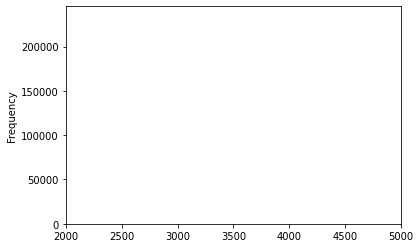

In [43]:
df_sunat_train.groupby(["key_value"], as_index=False).agg({"tipcontribuyente": "count"})["tipcontribuyente"].plot.hist(bins=50, xlim=(2000, 5000))

In [64]:
cat_cols = ["tipcontribuyente", "tippersona", "ciiu", "condiciondomicilio", "estadocontribuyente",
            "codvia", "codzona", "contabilidad", "facturacion", "domiciliado", "comercioexterior",
            "codentidadtributo", "estadotributo"
           ]#ubigeo, cargorele

In [65]:
df_sunat_test.loc[df_sunat_test["tippersona"] == 2, "tippersona"] = 1
df_sunat_test.loc[df_sunat_test["ciiu"].isin([1, 7, 99, 126]), "ciiu"] = 285
df_sunat_test.loc[df_sunat_test["facturacion"] == 7, "facturacion"] = 11

In [66]:
for cat_col in cat_cols:
  print(cat_col)

  df_tmp_train = pd.pivot_table(df_sunat_train, index= "key_value", columns=cat_col, values="tmp_f", aggfunc="count", fill_value=0).reset_index(drop=False)
  df_tmp_train.columns = ["{0}_{1}_original".format(cat_col, c) if c not in ["key_value"] else c for c in df_tmp_train.columns]
  #df_tmp_train = df_tmp_train.merge(df_base_train[["key_value", "target"]], how="inner", on="key_value")

  df_tmp_test = pd.pivot_table(df_sunat_test, index= "key_value", columns=cat_col, values="tmp_f", aggfunc="count", fill_value=0).reset_index(drop=False)
  df_tmp_test.columns = ["{0}_{1}_original".format(cat_col, c) if c not in ["key_value"] else c for c in df_tmp_test.columns]
  
  df_base_sunat_train = df_base_sunat_train.merge(df_tmp_train, how="left", on="key_value")
  df_base_sunat_test = df_base_sunat_test.merge(df_tmp_test, how="left", on="key_value")


tipcontribuyente
tippersona
ciiu
condiciondomicilio
estadocontribuyente
codvia
codzona
contabilidad
facturacion
domiciliado
comercioexterior
codentidadtributo
estadotributo


In [67]:
predictores_sunat = [c for c in df_base_sunat_train.columns if c in df_base_sunat_test.columns]

In [68]:
df_base_sunat_train = df_base_sunat_train[predictores_sunat]
df_base_sunat_test = df_base_sunat_test[predictores_sunat]

In [69]:
df_base_sunat_train

,key_value,tipcontribuyente_0_original,tipcontribuyente_1_original,tipcontribuyente_2_original,tipcontribuyente_3_original,tipcontribuyente_4_original,tipcontribuyente_5_original,tipcontribuyente_6_original,tipcontribuyente_7_original,tipcontribuyente_8_original,tipcontribuyente_9_original,tipcontribuyente_10_original,tipcontribuyente_11_original,tipcontribuyente_12_original,tipcontribuyente_13_original,tipcontribuyente_14_original,tipcontribuyente_15_original,tipcontribuyente_16_original,tipcontribuyente_17_original,tipcontribuyente_18_original,tipcontribuyente_19_original,tipcontribuyente_20_original,tipcontribuyente_21_original,tipcontribuyente_22_original,tipcontribuyente_23_original,tipcontribuyente_25_original,tipcontribuyente_26_original,tipcontribuyente_27_original,tipcontribuyente_28_original,tipcontribuyente_29_original,tipcontribuyente_30_original,tipcontribuyente_31_original,tipcontribuyente_32_original,tipcontribuyente_34_original,tipcontribuyente_35_original,tipcontribuyente_36_original,tipcontribuyente_37_original,tipcontribuyente_38_original,tipcontribuyente_39_original,tipcontribuyente_40_original,...,facturacion_10_original,facturacion_11_original,facturacion_12_original,facturacion_13_original,facturacion_14_original,facturacion_15_original,facturacion_16_original,facturacion_17_original,facturacion_18_original,facturacion_19_original,facturacion_20_original,facturacion_21_original,domiciliado_0_original,domiciliado_1_original,domiciliado_2_original,comercioexterior_0_original,comercioexterior_1_original,comercioexterior_2_original,comercioexterior_3_original,comercioexterior_4_original,comercioexterior_5_original,comercioexterior_6_original,comercioexterior_7_original,comercioexterior_8_original,comercioexterior_9_original,comercioexterior_10_original,comercioexterior_11_original,comercioexterior_12_original,comercioexterior_13_original,codentidadtributo_0_original,codentidadtributo_1_original,codentidadtributo_2_original,codentidadtributo_4_original,codentidadtributo_5_original,codentidadtributo_6_original,codentidadtributo_7_original,codentidadtributo_8_original,estadotributo_0_original,estadotributo_1_original,estadotributo_2_original
0,190597,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
1,162813,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
2,190620,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
3,43886,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
4,255211,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
233861,305832,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,6,0,0,0,0,0,0,0,0,0,0,0,6,0,0,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6,0,0,6
233862,137052,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,19,0,0,0,0,0,0,0,0,0,0,0,19,0,0,19,0,0,0,0,0,0,0,0,0,0,0,0,7,0,0,8,0,4,0,0,0,19,0
233863,173618,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
233864,137231,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [9]:
#df_sunat_train_unique = df_sunat_train.drop_duplicates()
#df_sunat_test_unique = df_sunat_test.drop_duplicates()

### Numéricas

In [70]:
df_sunat_train[["fecalta", "fecbaja"]].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1462036 entries, 0 to 1462035
Data columns (total 2 columns):
 #   Column   Non-Null Count    Dtype  
---  ------   --------------    -----  
 0   fecalta  1441139 non-null  float32
 1   fecbaja  738322 non-null   float32
dtypes: float32(2)
memory usage: 11.2 MB


In [71]:
df_sunat_train["fecalta_reg"] = df_sunat_train["fecalta"] + abs(df_sunat_train["fecalta"].min())
df_sunat_train["fecbaja_reg"] = df_sunat_train["fecbaja"] + abs(df_sunat_train["fecbaja"].min())

df_sunat_test["fecalta_reg"] = df_sunat_test["fecalta"] + abs(df_sunat_test["fecalta"].min())
df_sunat_test["fecbaja_reg"] = df_sunat_test["fecbaja"] + abs(df_sunat_test["fecbaja"].min())

In [72]:
df_sunat_train["fecdiff"] = df_sunat_train["fecalta"] - df_sunat_train["fecbaja"]
df_sunat_train["fecdiff_reg"] = df_sunat_train["fecalta_reg"] - df_sunat_train["fecbaja_reg"]

df_sunat_test["fecdiff"] = df_sunat_test["fecalta"] - df_sunat_test["fecbaja"]
df_sunat_test["fecdiff_reg"] = df_sunat_test["fecalta_reg"] - df_sunat_test["fecbaja_reg"]

In [73]:
df_sunat_train_num_agg = df_sunat_train.groupby(["key_value"], as_index=False).agg({"fecalta": ["min", "median", "max", "mean", "std", "count"],
                                                           "fecbaja": ["min", "median", "max", "mean", "std", "count"],
                                                           "fecdiff": ["min", "median", "max", "mean", "std"],
                                                           "fecdiff_reg": ["min", "median", "max", "mean", "std"]
                                                           })
df_sunat_train_num_agg.columns = ["_".join(c) if c[-1] != "" else c[0] for c in df_sunat_train_num_agg.columns]

In [74]:
df_sunat_test_num_agg = df_sunat_test.groupby(["key_value"], as_index=False).agg({"fecalta": ["min", "median", "max", "mean", "std", "count"],
                                                           "fecbaja": ["min", "median", "max", "mean", "std", "count"],
                                                           "fecdiff": ["min", "median", "max", "mean", "std"],
                                                           "fecdiff_reg": ["min", "median", "max", "mean", "std"]
                                                           })
df_sunat_test_num_agg.columns = ["_".join(c) if c[-1] != "" else c[0] for c in df_sunat_test_num_agg.columns]

In [75]:
df_sunat_test_num_agg.head(5)

,key_value,fecalta_min,fecalta_median,fecalta_max,fecalta_mean,fecalta_std,fecalta_count,fecbaja_min,fecbaja_median,fecbaja_max,fecbaja_mean,fecbaja_std,fecbaja_count,fecdiff_min,fecdiff_median,fecdiff_max,fecdiff_mean,fecdiff_std,fecdiff_reg_min,fecdiff_reg_median,fecdiff_reg_max,fecdiff_reg_mean,fecdiff_reg_std
0,0,0.566027,0.566027,0.566027,0.566027,NaN,1,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,1.377142,1.377142,1.377142,1.377142,NaN,1,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,4,1.377142,1.377142,1.377142,1.377142,NaN,1,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5,1.106770,1.106770,1.106770,1.106770,NaN,1,1.422525,1.422525,1.422525,1.422525,NaN,1,-0.315755,-0.315755,-0.315755,-0.315755,NaN,-4.2805,-4.2805,-4.2805,-4.2805,NaN
4,7,1.782700,1.782700,1.782700,1.782700,NaN,1,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [76]:
df_base_sunat_train = df_base_sunat_train.merge(df_sunat_train_num_agg)
df_base_sunat_test = df_base_sunat_test.merge(df_sunat_test_num_agg)

In [78]:
df_base_sunat_train.columns = ["sunat_" + c if c not in ["key_value"] else c for c in df_base_sunat_train.columns]
df_base_sunat_test.columns = ["sunat_" + c if c not in ["key_value"] else c for c in df_base_sunat_test.columns]

In [79]:
df_base_sunat_train.head()

,key_value,sunat_tipcontribuyente_0_original,sunat_tipcontribuyente_1_original,sunat_tipcontribuyente_2_original,sunat_tipcontribuyente_3_original,sunat_tipcontribuyente_4_original,sunat_tipcontribuyente_5_original,sunat_tipcontribuyente_6_original,sunat_tipcontribuyente_7_original,sunat_tipcontribuyente_8_original,sunat_tipcontribuyente_9_original,sunat_tipcontribuyente_10_original,sunat_tipcontribuyente_11_original,sunat_tipcontribuyente_12_original,sunat_tipcontribuyente_13_original,sunat_tipcontribuyente_14_original,sunat_tipcontribuyente_15_original,sunat_tipcontribuyente_16_original,sunat_tipcontribuyente_17_original,sunat_tipcontribuyente_18_original,sunat_tipcontribuyente_19_original,sunat_tipcontribuyente_20_original,sunat_tipcontribuyente_21_original,sunat_tipcontribuyente_22_original,sunat_tipcontribuyente_23_original,sunat_tipcontribuyente_25_original,sunat_tipcontribuyente_26_original,sunat_tipcontribuyente_27_original,sunat_tipcontribuyente_28_original,sunat_tipcontribuyente_29_original,sunat_tipcontribuyente_30_original,sunat_tipcontribuyente_31_original,sunat_tipcontribuyente_32_original,sunat_tipcontribuyente_34_original,sunat_tipcontribuyente_35_original,sunat_tipcontribuyente_36_original,sunat_tipcontribuyente_37_original,sunat_tipcontribuyente_38_original,sunat_tipcontribuyente_39_original,sunat_tipcontribuyente_40_original,...,sunat_comercioexterior_7_original,sunat_comercioexterior_8_original,sunat_comercioexterior_9_original,sunat_comercioexterior_10_original,sunat_comercioexterior_11_original,sunat_comercioexterior_12_original,sunat_comercioexterior_13_original,sunat_codentidadtributo_0_original,sunat_codentidadtributo_1_original,sunat_codentidadtributo_2_original,sunat_codentidadtributo_4_original,sunat_codentidadtributo_5_original,sunat_codentidadtributo_6_original,sunat_codentidadtributo_7_original,sunat_codentidadtributo_8_original,sunat_estadotributo_0_original,sunat_estadotributo_1_original,sunat_estadotributo_2_original,sunat_fecalta_min,sunat_fecalta_median,sunat_fecalta_max,sunat_fecalta_mean,sunat_fecalta_std,sunat_fecalta_count,sunat_fecbaja_min,sunat_fecbaja_median,sunat_fecbaja_max,sunat_fecbaja_mean,sunat_fecbaja_std,sunat_fecbaja_count,sunat_fecdiff_min,sunat_fecdiff_median,sunat_fecdiff_max,sunat_fecdiff_mean,sunat_fecdiff_std,sunat_fecdiff_reg_min,sunat_fecdiff_reg_median,sunat_fecdiff_reg_max,sunat_fecdiff_reg_mean,sunat_fecdiff_reg_std
0,190597,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,-0.785832,-0.785832,-0.785832,-0.785832,NaN,1,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,162813,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0.971584,0.971584,0.971584,0.971584,NaN,1,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,190620,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0.025283,0.025283,0.025283,0.025283,NaN,1,-1.561407,-1.561407,-1.561407,-1.561407,NaN,1,1.58669,1.58669,1.58669,1.58669,NaN,-1.632073,-1.632073,-1.632073,-1.632073,NaN
3,43886,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0.566027,0.566027,0.566027,0.566027,NaN,1,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,255211,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0.836399,0.836399,0.836399,0.836399,NaN,1,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [80]:
df_base_sunat_train.to_csv("[01] Intermediate/ds_sunat.csv", index=False)
df_base_sunat_test.to_csv("[01] Intermediate/ds_sunat_test.csv", index=False)

### Another Approach

In [ ]:
df_base_train.loc[df_base_train["source_code"].apply(lambda s: str(s)[2] == '1'), "target"].mean()

In [79]:
0.14770851684297845 * 0.5

0.07385425842148922

In [70]:
cat_col = "tipcontribuyente"
df_tmp = df_sunat_train[["key_value", cat_col]].drop_duplicates().merge(df_base_train[["key_value", "target"]], how="left", on="key_value")
df_tmp_agg = df_tmp.groupby([cat_col], as_index=False).agg({"target": ["mean", "count"]})
df_tmp_agg.columns = ["_".join(c) if c[-1] != "" else c[0] for c in df_tmp_agg.columns]
df_tmp_agg["target_%"] = round(100 * df_tmp_agg["target_count"] / df_tmp_agg["target_count"].sum(), 2)
df_tmp_agg.sort_values(by=[("target_%")], ascending=[False])

,tipcontribuyente,target_mean,target_count,target_%
0,0,0.144976,127269,47.49
9,9,0.145075,84432,31.50
49,49,0.177769,20431,7.62
29,29,0.097483,13469,5.03
46,46,0.108829,9639,3.60
18,18,0.106383,4794,1.79
2,2,0.096000,2250,0.84
16,16,0.074114,1862,0.69
48,48,0.103261,1840,0.69
31,31,0.121588,403,0.15


In [59]:
df_tmp.groupby("codentidadtributo_0_original").agg({"target": ["mean", "count"]}).head(10)

target        
                                  mean   count
codentidadtributo_0_original                  
0                             0.147921  227757
1                             0.092862    1443
2                             0.130711     788
3                             0.134855     482
4                             0.182058     379
5                             0.142322     267
6                             0.103306     242
7                             0.104294     163
8                             0.160622     193
9                             0.208333     168

In [64]:
df_sunat_train.groupby("key_value", as_index=False).agg({"tipcontribuyente": "count"}).sort_values(by="tipcontribuyente", ascending=False)

,key_value,tipcontribuyente
223563,341144,53290
28298,42734,41349
42490,64138,16350
47461,71671,11468
139092,211072,10672
...,...,...
84913,128793,1
84914,128794,1
84916,128796,1
84917,128797,1


In [62]:
#df_sunat_train["real_count"] = df_sunat_train.groupby("key_value").count()
#df_sunat_test["real_count"] = df_sunat_test.groupby("key_value").count()

,tipcontribuyente,tippersona,ciiu,ubigeo,condiciondomicilio,estadocontribuyente,fecalta,fecbaja,codvia,codzona,contabilidad,facturacion,domiciliado,comercioexterior,cargorele,codentidadtributo,estadotributo
key_value,,,,,,,,,,,,,,,,,
0,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1
1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1
2,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1
3,3,3,3,3,3,3,3,0,3,3,3,3,3,3,3,3,3
5,2,2,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
358481,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1
358482,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1
358484,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1


In [60]:
df_sunat_train.shape[0]

1462036

In [61]:
df_sunat_train.drop_duplicates().shape[0]

292479

In [48]:
df_sunat_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 292479 entries, 0 to 1462035
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   key_value            292479 non-null  uint32 
 1   tipcontribuyente     292479 non-null  uint8  
 2   tippersona           292479 non-null  uint8  
 3   ciiu                 292479 non-null  uint16 
 4   ubigeo               292479 non-null  uint16 
 5   condiciondomicilio   292479 non-null  uint8  
 6   estadocontribuyente  292479 non-null  uint8  
 7   fecalta              272027 non-null  float32
 8   fecbaja              46802 non-null   float32
 9   codvia               292479 non-null  uint8  
 10  codzona              292479 non-null  uint8  
 11  contabilidad         292479 non-null  uint8  
 12  facturacion          292479 non-null  uint8  
 13  domiciliado          292479 non-null  uint8  
 14  comercioexterior     292479 non-null  uint8  
 15  cargorele       

In [49]:
df_sunat_train.head()

,key_value,tipcontribuyente,tippersona,ciiu,ubigeo,condiciondomicilio,estadocontribuyente,fecalta,fecbaja,codvia,codzona,contabilidad,facturacion,domiciliado,comercioexterior,cargorele,codentidadtributo,estadotributo
0,190597,9,0,178,442,0,0,-0.785832,NaN,0,0,6,11,0,1,635,8,2
1,162813,0,0,253,449,0,0,0.971584,NaN,20,0,6,11,0,1,635,8,2
2,190620,9,0,173,473,0,2,0.025283,-1.561407,11,0,6,11,0,1,635,8,2
3,43886,0,0,285,154,0,0,0.566027,NaN,11,3,6,11,0,1,635,8,2
4,255211,0,0,285,456,0,0,0.836399,NaN,11,3,6,11,0,1,635,8,2


In [51]:
df_sunat_train["key_value"].count(), df_sunat_train["key_value"].nunique()

(292479, 233866)

In [53]:
df_sunat_train.groupby("key_value", as_index=False).agg({"tipcontribuyente": "count"}).sort_values(by="tipcontribuyente", ascending=False)

,key_value,tipcontribuyente
172663,262090,96
80409,121911,63
57921,87603,51
149929,227523,47
157189,238557,45
...,...,...
83372,126457,1
83373,126458,1
83376,126461,1
83377,126463,1


In [54]:
df_sunat_train.loc[df_sunat_train["key_value"] == 262090]

,key_value,tipcontribuyente,tippersona,ciiu,ubigeo,condiciondomicilio,estadocontribuyente,fecalta,fecbaja,codvia,codzona,contabilidad,facturacion,domiciliado,comercioexterior,cargorele,codentidadtributo,estadotributo
112572,262090,0,0,150,610,0,0,-1.056204,NaN,21,0,10,17,0,1,635,8,2
446764,262090,31,1,150,1141,0,3,1.917886,NaN,11,35,2,2,1,2,47,4,1
446766,262090,31,1,150,1141,0,3,1.917886,NaN,11,35,2,2,1,2,47,0,1
446767,262090,31,1,150,1141,0,3,1.917886,NaN,11,35,2,2,1,2,47,6,1
446773,262090,31,1,150,1141,0,3,1.917886,NaN,11,35,2,2,1,2,47,6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1371659,262090,31,1,150,1023,0,3,2.053072,NaN,11,35,6,11,1,1,47,0,1
1371860,262090,31,1,150,481,0,0,2.053072,NaN,0,35,10,17,1,1,425,6,0
1371862,262090,31,1,150,481,0,0,2.053072,NaN,0,35,10,17,1,1,425,4,0
1371872,262090,31,1,150,481,0,0,2.053072,NaN,0,35,10,17,1,1,425,0,0


In [58]:
df_sunat_train.groupby("tipcontribuyente", as_index=False).agg({"key_value": "count"}).sort_values(by="key_value", ascending=False)

,tipcontribuyente,key_value
0,0,127924
9,9,87583
29,29,23575
49,49,20441
46,46,13772
18,18,7262
16,16,3335
2,2,2685
48,48,2434
31,31,1054


In [ ]:
from scipy import stats

In [ ]:
df_sunat_train_agg = df_sunat_train.groupby("key_value", as_index=False).agg({c: stats.mode for c in df_sunat_train.columns if c not in ["key_value", "fecalta", "fecbaja"]})

In [ ]:
df_sunat_test_agg = df_sunat_test.groupby("key_value", as_index=False).agg({c: stats.mode for c in df_sunat_test.columns if c not in ["key_value", "fecalta", "fecbaja"]})

In [ ]:
for col in [c for c in df_sunat_train.columns if c not in ["key_value", "fecalta", "fecbaja"]]:
  df_sunat_train_agg[col] = df_sunat_train_agg[col].apply(lambda t: t[0][0])
  df_sunat_test_agg[col] = df_sunat_test_agg[col].apply(lambda t: t[0][0])

In [ ]:
df_sunat_train_fecha = df_sunat_train.groupby("key_value", as_index=False).agg({"fecalta": ["min", "max", "mean"], "fecbaja": ["min", "max", "mean"]})
df_sunat_test_fecha = df_sunat_test.groupby("key_value", as_index=False).agg({"fecalta": ["min", "max", "mean"], "fecbaja": ["min", "max", "mean"]})

In [ ]:
df_sunat_train_fecha.columns = ["SUNAT" + "_".join(c).upper() if c[-1] != "" else c[0] for c in df_sunat_train_fecha.columns]
df_sunat_test_fecha.columns = ["SUNAT" + "_".join(c).upper() if c[-1] != "" else c[0] for c in df_sunat_test_fecha.columns]

In [ ]:
df_sunat_train_agg = df_sunat_train_agg.merge(df_sunat_train_fecha, how="left", on="key_value")
df_sunat_test_agg = df_sunat_test_agg.merge(df_sunat_test_fecha, how="left", on="key_value")

In [ ]:
df_sunat_train_agg.to_csv("[01] Intermediate/ds_sunat.csv", index=False)
df_sunat_test_agg.to_csv("[01] Intermediate/ds_sunat_test.csv", index=False)

In [ ]:
df_sunat_test_agg.head()

,key_value,tipcontribuyente,tippersona,ciiu,ubigeo,condiciondomicilio,estadocontribuyente,codvia,codzona,contabilidad,facturacion,domiciliado,comercioexterior,cargorele,codentidadtributo,estadotributo,SUNATFECALTA_MIN,SUNATFECALTA_MAX,SUNATFECALTA_MEAN,SUNATFECBAJA_MIN,SUNATFECBAJA_MAX,SUNATFECBAJA_MEAN
0,0,0,0,255,473,0,0,3,3,6,11,0,2,635,8,2,0.566027,0.566027,0.566027,NaN,NaN,NaN
1,2,0,0,244,473,0,0,0,3,6,11,0,1,635,8,2,1.377142,1.377142,1.377142,NaN,NaN,NaN
2,4,0,0,285,1109,0,0,3,3,6,11,0,2,635,8,2,1.377142,1.377142,1.377142,NaN,NaN,NaN
3,5,9,0,177,674,0,3,3,3,2,11,0,2,635,8,2,1.106770,1.106770,1.106770,1.422525,1.422525,1.422525
4,7,0,0,285,500,0,0,3,10,6,11,0,2,635,8,2,1.782700,1.782700,1.782700,NaN,NaN,NaN


In [ ]:
df_sunat_train.groupby("key_value", as_index=False).agg({"tipcontribuyente": "count"}).sort_values(by="tipcontribuyente", ascending=False)

,key_value,tipcontribuyente
172663,262090,96
80409,121911,63
57921,87603,51
149929,227523,47
157189,238557,45
...,...,...
83372,126457,1
83373,126458,1
83376,126461,1
83377,126463,1


In [ ]:
df_sunat_test.groupby("key_value", as_index=False).agg({"tipcontribuyente": "count"}).sort_values(by="tipcontribuyente", ascending=False)


,key_value,tipcontribuyente
16321,24767,655
143253,220827,93
227474,352446,65
10113,15340,62
142130,219118,49
...,...,...
90676,139485,1
90677,139487,1
90678,139489,1
90679,139490,1


## Censo

In [81]:
df_censo_train = optimizar_df(pd.read_csv("[00] Data/censo_train.csv")).drop_duplicates()
df_censo_test = optimizar_df(pd.read_csv("[00] Data/censo_test.csv")).drop_duplicates()

In [82]:
df_censo_train.shape[0], df_censo_train["key_value"].nunique()

(153139, 153139)

In [83]:
df_censo_test.shape[0], df_censo_test["key_value"].nunique()

(200499, 200499)

In [85]:
df_censo_train.columns = ["censo_" + c if c not in ["key_value"] else c for c in df_censo_train.columns]
df_censo_test.columns = ["censo_" + c if c not in ["key_value"] else c for c in df_censo_test.columns]

In [86]:
df_censo_train.head()

,key_value,censo_lon_x,censo_lat_y,censo_zon_sis,censo_zon_der,censo_zon_inu,censo_zon_com,censo_score,censo_pob,censo_pob_a,censo_pob_b,censo_pob_c,censo_pob_d,censo_pob_e,censo_hog,censo_a,censo_b,censo_c,censo_d,censo_e,censo_pred,censo_ing_a_18,censo_gas_ali_a_18,censo_gas_ves_a_18,censo_gas_alq_a_18,censo_gas_mue_a_18,censo_gas_sal_a_18,censo_gas_trans_a_18,censo_gas_esp_a_18,censo_gas_otrs_a_18,censo_ing_b_18,censo_gas_ali_b_18,censo_gas_ves_b_18,censo_gas_alq_b_18,censo_gas_mue_b_18,censo_gas_sal_b_18,censo_gas_trans_b_18,censo_gas_esp_b_18,censo_gas_otrs_b_18,censo_ing_c_18,...,censo_estud_9,censo_estud_10,censo_profe_1,censo_profe_2,censo_profe_3,censo_profe_4,censo_profe_5,censo_profe_6,censo_profe_7,censo_profe_8,censo_profe_9,censo_profe_10,censo_acteco1,censo_acteco2,censo_acteco3,censo_acteco4,censo_acteco5,censo_acteco6,censo_acteco7,censo_acteco8,censo_acteco9,censo_acteco10,censo_acteco11,censo_acteco12,censo_acteco13,censo_acteco14,censo_acteco15,censo_acteco16,censo_acteco17,censo_acteco18,censo_acteco19,censo_acteco20,censo_acteco21,censo_ocup_1,censo_ocup_2,censo_ocup_3,censo_ocup_4,censo_ocup_5,censo_ocup_6,censo_flag_censo
0,106695,1.827118,-0.711359,-0.931515,-0.242328,-0.32701,-0.280674,-0.714361,-0.544996,-0.312923,-0.425825,-0.565415,-0.089094,-0.165019,-0.537031,-0.302006,-0.418318,-0.547005,-0.110158,-0.187616,4,-0.298620,-0.298620,-0.298620,-0.298620,-0.298620,-0.298620,-0.298620,-0.298620,-0.298620,-0.452057,-0.452057,-0.452057,-0.452057,-0.452057,-0.452057,-0.452057,-0.452057,-0.452057,-0.535443,...,-0.199376,-0.308000,-0.340184,-0.217179,-0.355359,-0.206882,-0.225646,-0.151014,-0.339847,-0.419854,-0.733954,-0.205903,-0.237047,-0.368741,-0.555645,-0.273762,-0.338135,0.041469,-0.511477,-0.457707,0.639525,-0.202316,-0.173108,-0.331307,-0.224216,-0.155999,-0.232125,-0.378461,-0.270605,-0.543045,-0.583661,-0.644919,-0.11823,-0.639720,-0.329153,-0.248796,-0.623164,-0.605414,-0.644919,0
1,271120,-0.480514,0.198531,0.054361,-0.242328,-0.32701,-0.280674,-0.104283,-0.060420,-0.312923,-0.485131,0.448644,-0.059923,-0.308719,-0.078552,-0.302006,-0.457537,0.462810,-0.162021,-0.317260,3,-0.298620,-0.298620,-0.298620,-0.298620,-0.298620,-0.298620,-0.298620,-0.298620,-0.298620,-0.412100,-0.412100,-0.412100,-0.412100,-0.412100,-0.412100,-0.412100,-0.412100,-0.412100,0.334792,...,-0.008364,-0.308000,0.017784,-0.139198,-0.500427,0.000321,-0.076505,0.239948,0.184462,0.143793,-0.041876,-0.205903,0.215731,-0.368741,-0.130826,-0.273762,-0.338135,-0.127766,-0.076081,0.214074,0.059442,0.017362,-0.402767,-0.331307,-0.171162,-0.658023,-0.007670,0.049331,-0.270605,-0.162191,-0.215123,-0.199299,-0.11823,-0.234777,-0.113894,-0.135995,0.032167,0.062284,-0.199299,0
2,63080,-0.192205,-0.216570,1.040236,-0.242328,-0.32701,-0.280674,-0.124272,0.607510,-0.312923,1.092421,-0.230260,0.961048,0.733106,0.572192,-0.302006,0.993563,-0.220300,0.927114,0.849535,2,-0.298620,-0.298620,-0.298620,-0.298620,-0.298620,-0.298620,-0.298620,-0.298620,-0.298620,1.106274,1.106274,1.106274,1.106274,1.106274,1.106274,1.106274,1.106274,1.106274,0.004703,...,-0.180274,0.137688,-0.340184,-0.035223,0.176559,0.069388,0.445490,-0.151014,0.097077,0.566528,-0.041876,-0.011010,-0.237047,0.360282,0.378958,-0.273762,-0.338135,-0.466236,0.177900,0.438002,0.494504,0.237039,-0.173108,-0.331307,-0.224216,0.513367,-0.232125,0.370175,-0.270605,1.742079,0.521952,0.246320,-0.11823,0.035186,0.224369,0.117805,-0.131666,1.063831,0.246320,0
3,107681,-0.803171,0.748640,1.040236,-0.242328,-0.32701,-0.280674,-0.540244,-0.658501,-0.131975,-0.437686,-0.599790,-0.439141,-0.308719,-0.625768,-0.136362,-0.418318,-0.576705,-0.421339,-0.317260,4,-0.128909,-0.128909,-0.128909,-0.128909,-0.128909,-0.128909,-0.128909,-0.128909,-0.128909,-0.412100,-0.412100,-0.412100,-0.412100,-0.412100,-0.412100,-0.412100,-0.412100,-0.412100,-0.565451,...,-0.485894,-0.382281,0.017784,-0.451123,-0.500427,-0.621288,-0.598499,-0.151014,-0.514617,-0.842590,-0.657057,-0.205903,0.064805,-0.368741,-0.470681,-0.

In [87]:
df_censo_train.to_csv("[01] Intermediate/ds_censo.csv", index=False)
df_censo_test.to_csv("[01] Intermediate/ds_censo_test.csv", index=False)

In [31]:
df_censo_train = df_censo_train.merge(df_base_train, how="left", on="key_value")
df_censo_test = df_censo_test.merge(df_base_test, how="left", on="key_value")

In [30]:
from featexp import get_univariate_plots

                                           Plots for lon_x                                            


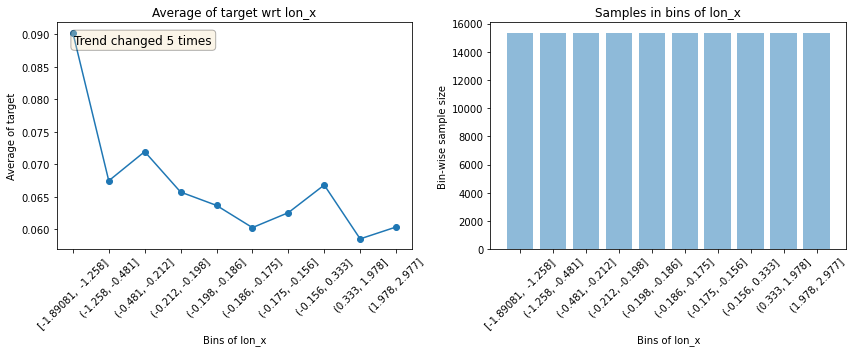

--------------------------------------------------------------------------------------------------------------


                                           Plots for lat_y                                            


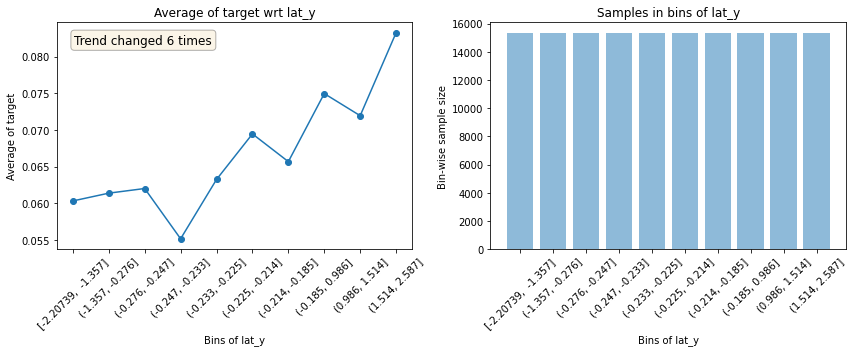

--------------------------------------------------------------------------------------------------------------


                                            Plots for pob                                             


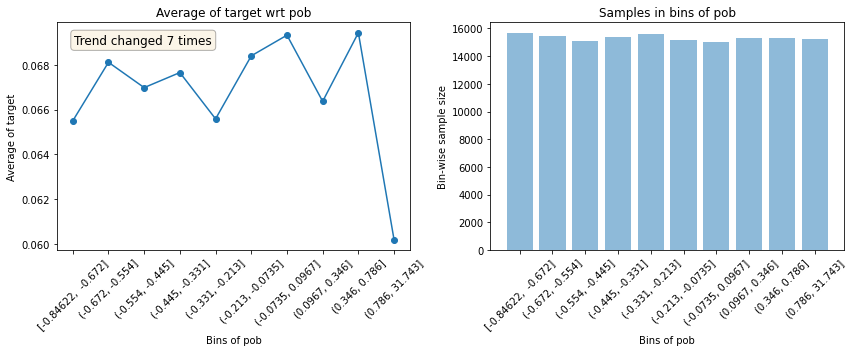

--------------------------------------------------------------------------------------------------------------


                                           Plots for pob_a                                            


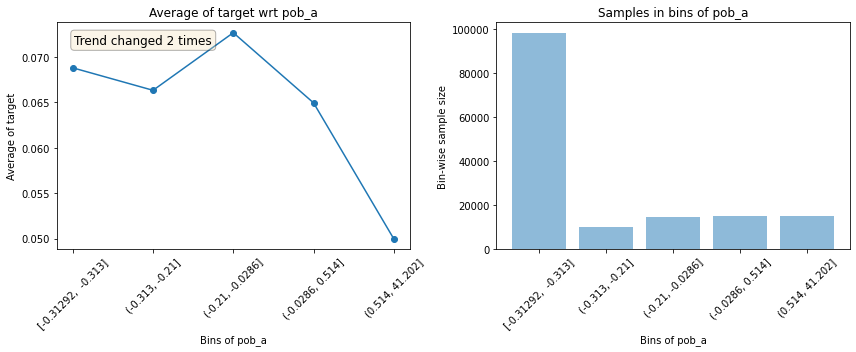

--------------------------------------------------------------------------------------------------------------


                                           Plots for pob_b                                            


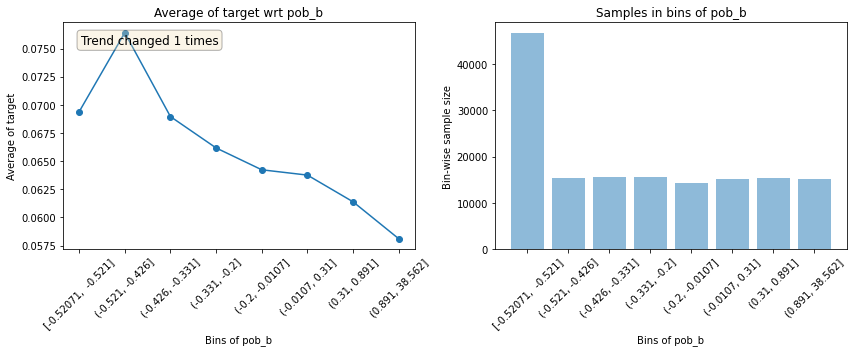

--------------------------------------------------------------------------------------------------------------


                                           Plots for pob_c                                            


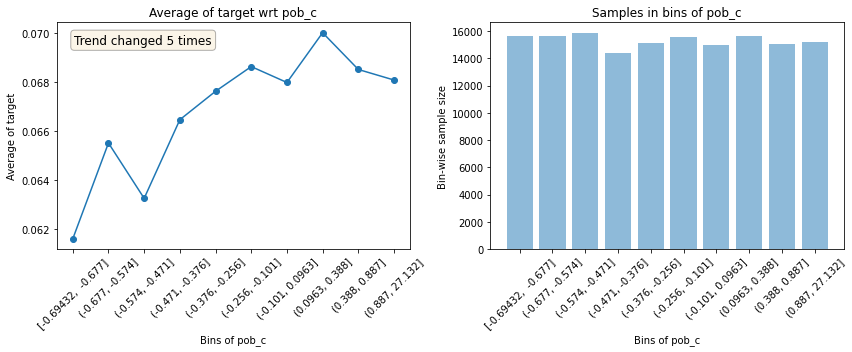

--------------------------------------------------------------------------------------------------------------


                                           Plots for pob_d                                            


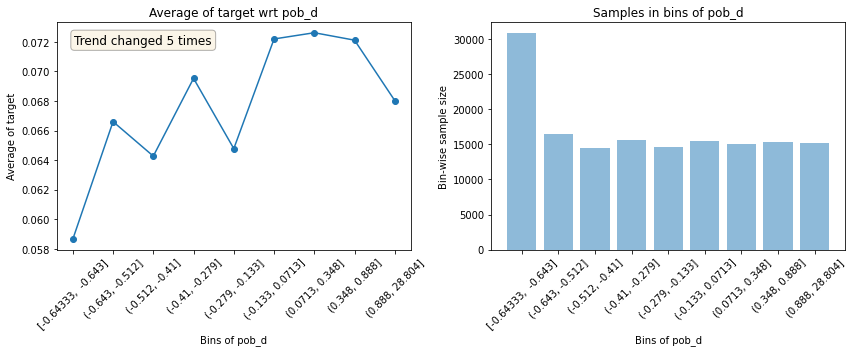

--------------------------------------------------------------------------------------------------------------


                                           Plots for pob_e                                            


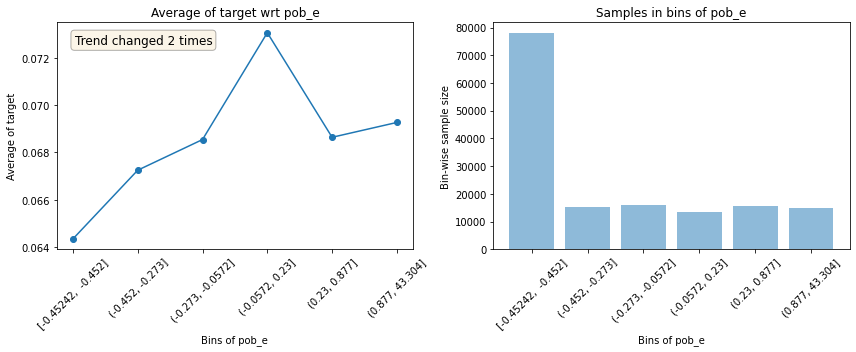

--------------------------------------------------------------------------------------------------------------


                                            Plots for hog                                             


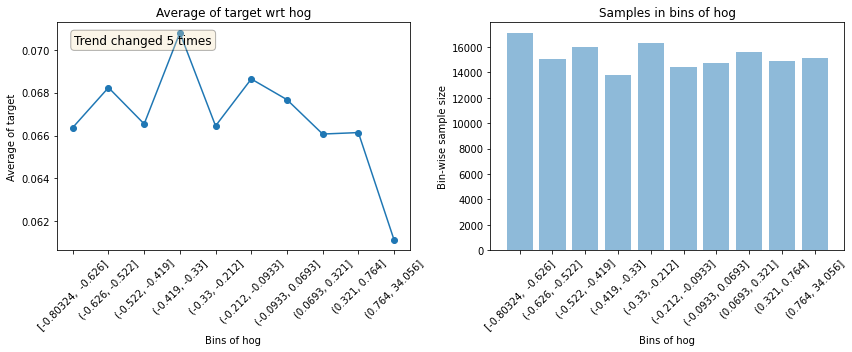

--------------------------------------------------------------------------------------------------------------


                                             Plots for a                                              


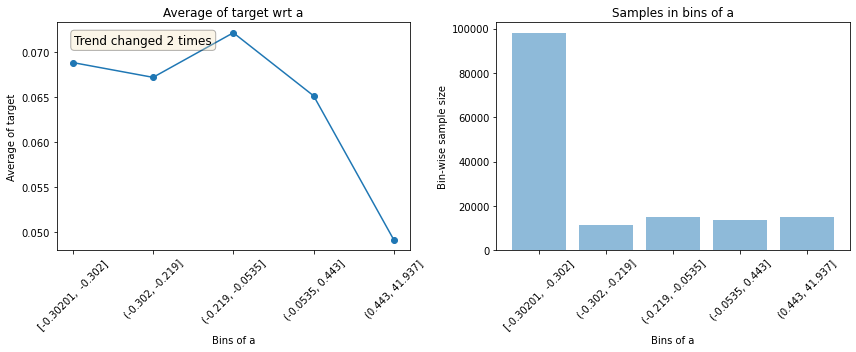

--------------------------------------------------------------------------------------------------------------


                                             Plots for b                                              


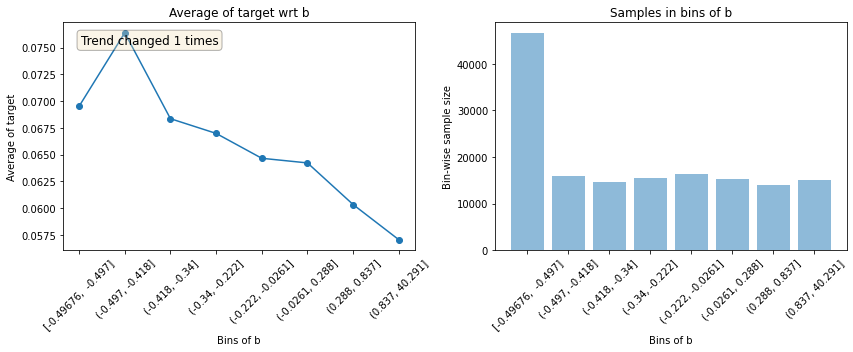

--------------------------------------------------------------------------------------------------------------


                                             Plots for c                                              


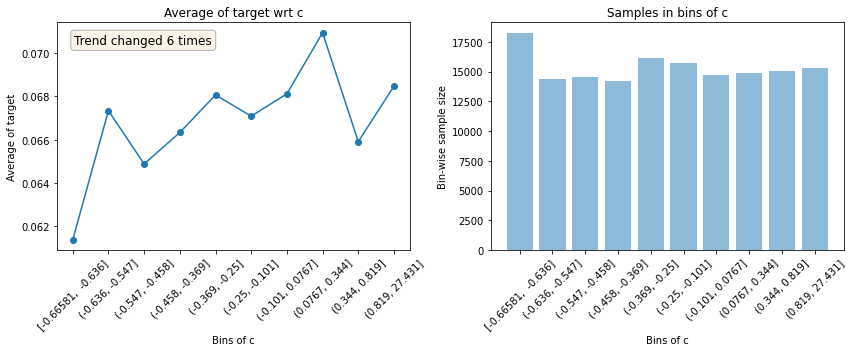

--------------------------------------------------------------------------------------------------------------


                                             Plots for d                                              


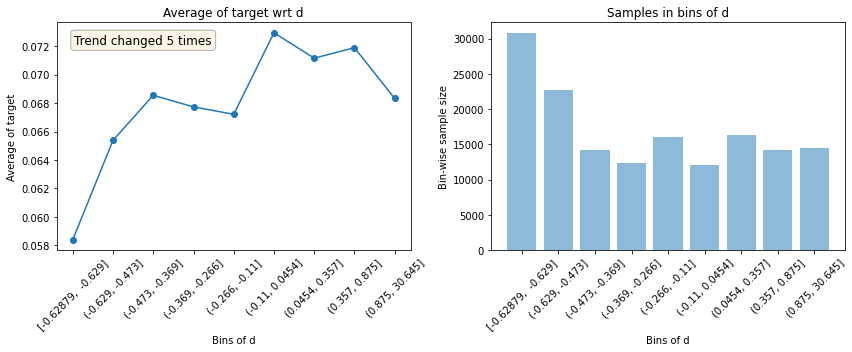

--------------------------------------------------------------------------------------------------------------


                                             Plots for e                                              


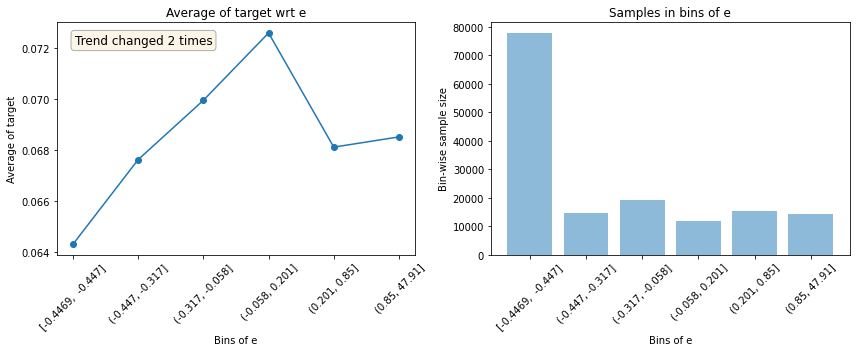

--------------------------------------------------------------------------------------------------------------


                                          Plots for ing_a_18                                          


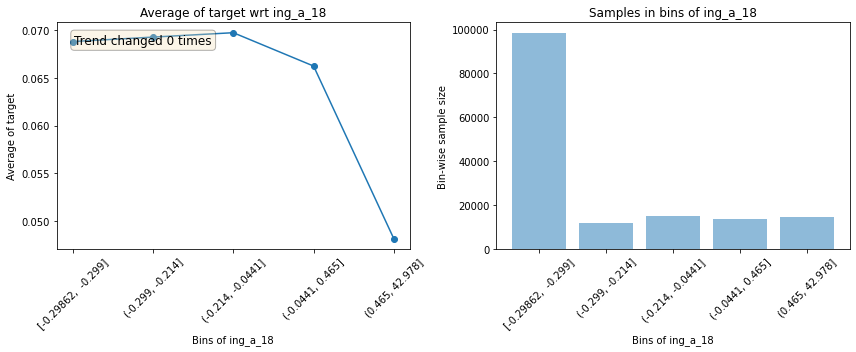

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_ali_a_18                                        


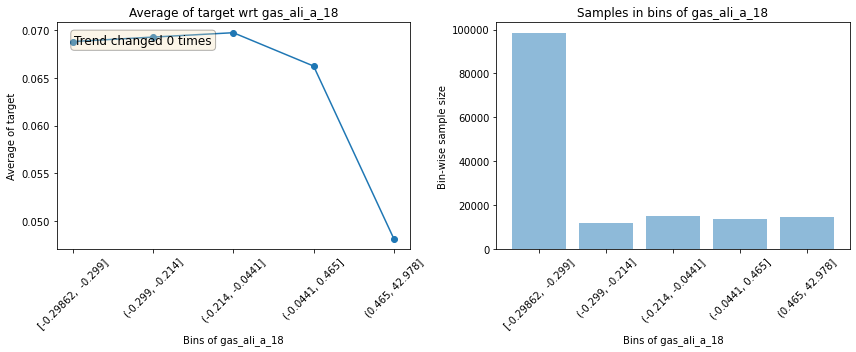

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_ves_a_18                                        


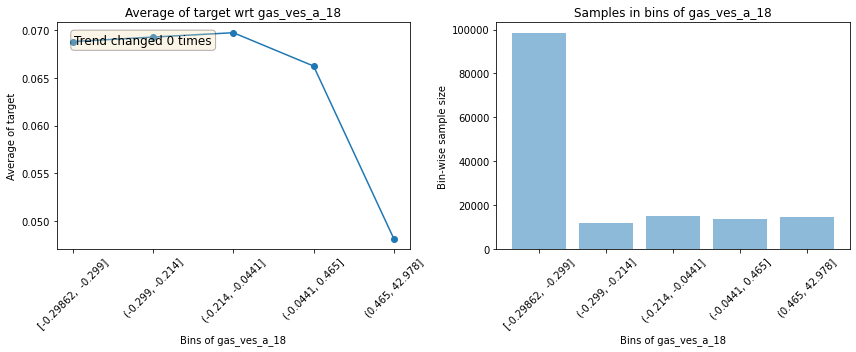

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_alq_a_18                                        


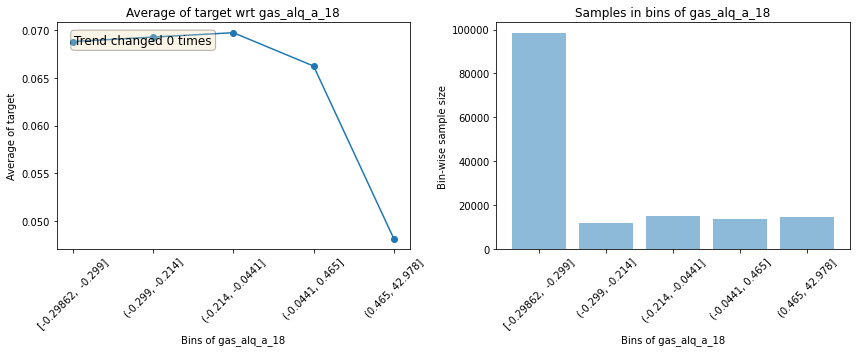

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_mue_a_18                                        


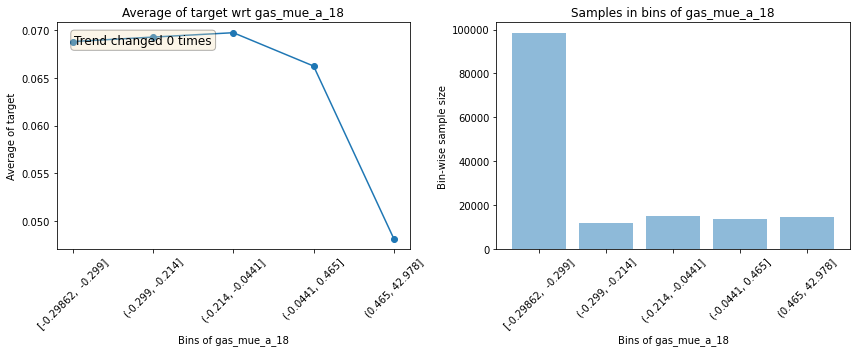

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_sal_a_18                                        


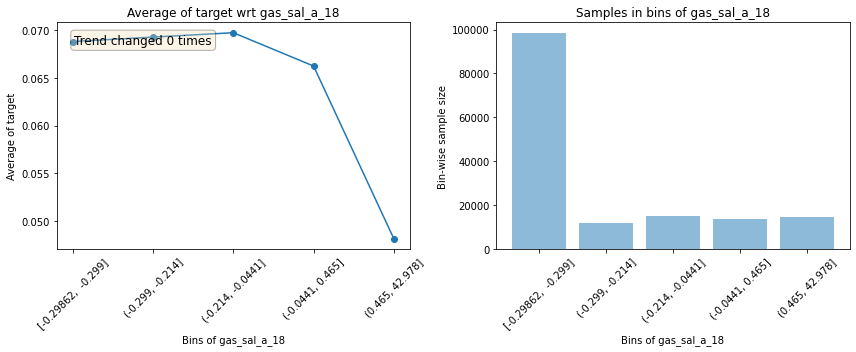

--------------------------------------------------------------------------------------------------------------


                                       Plots for gas_trans_a_18                                       


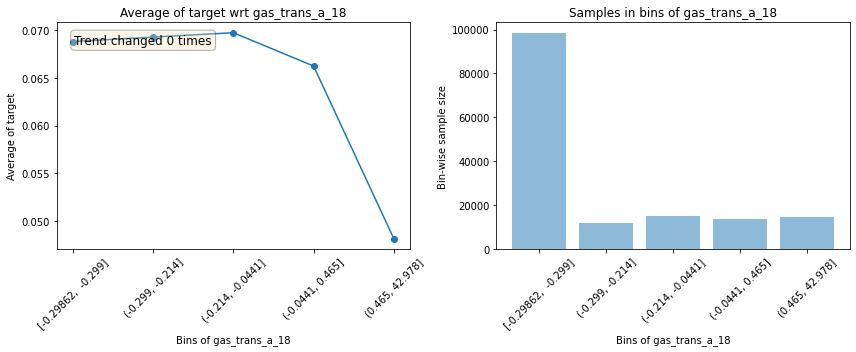

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_esp_a_18                                        


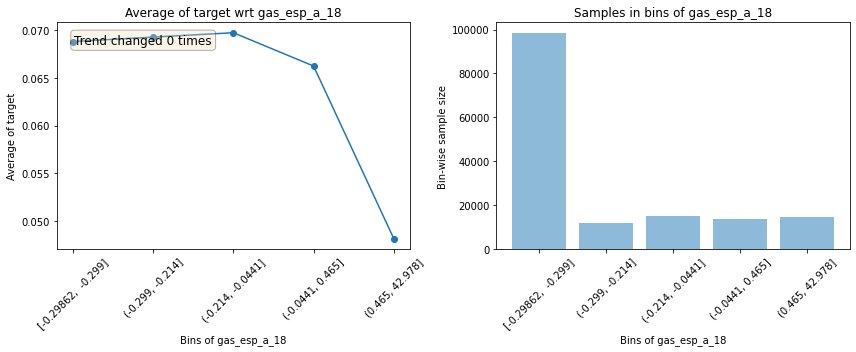

--------------------------------------------------------------------------------------------------------------


                                       Plots for gas_otrs_a_18                                        


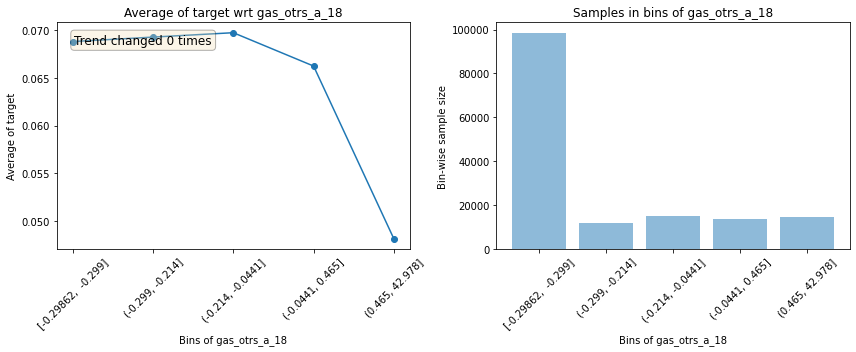

--------------------------------------------------------------------------------------------------------------


                                          Plots for ing_b_18                                          


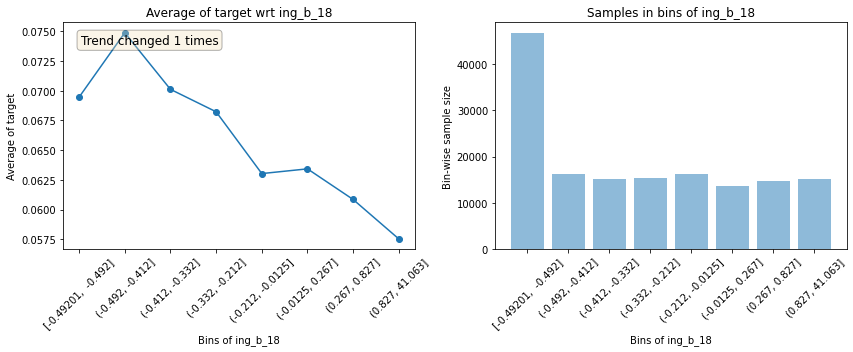

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_ali_b_18                                        


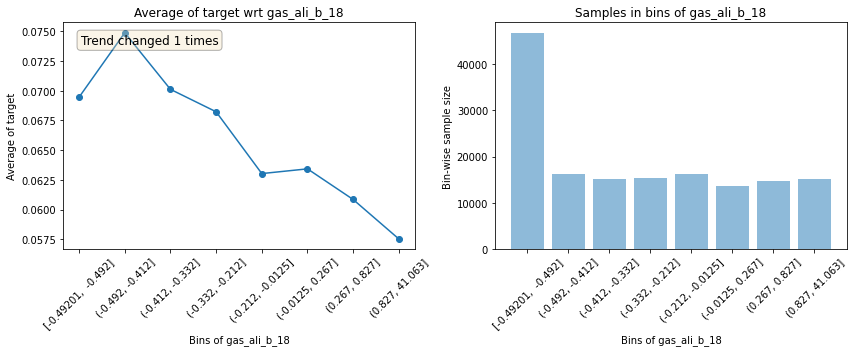

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_ves_b_18                                        


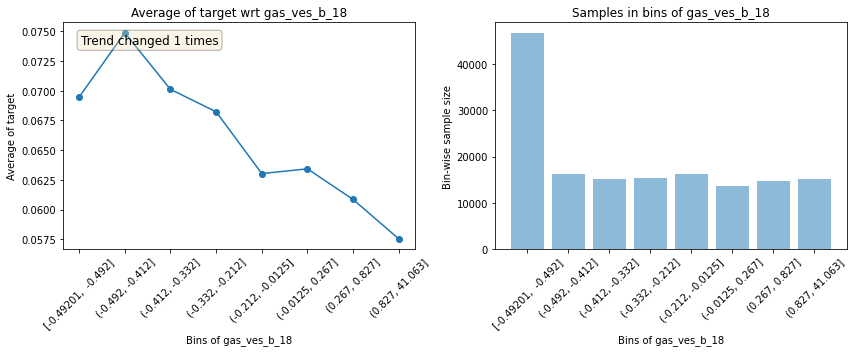

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_alq_b_18                                        


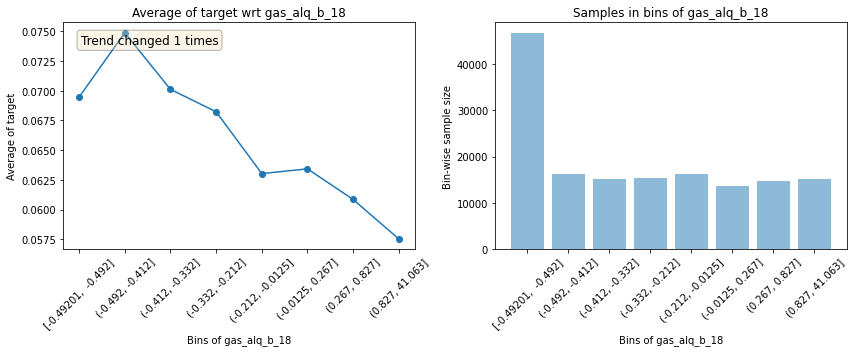

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_mue_b_18                                        


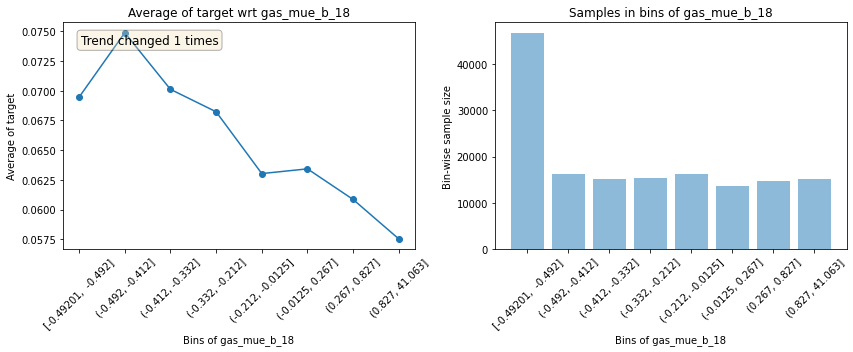

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_sal_b_18                                        


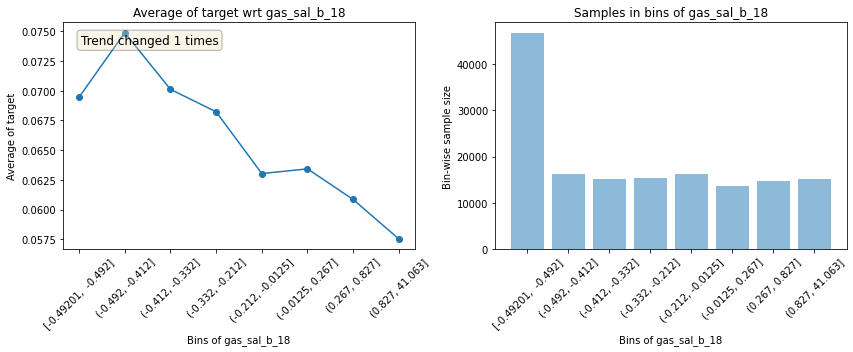

--------------------------------------------------------------------------------------------------------------


                                       Plots for gas_trans_b_18                                       


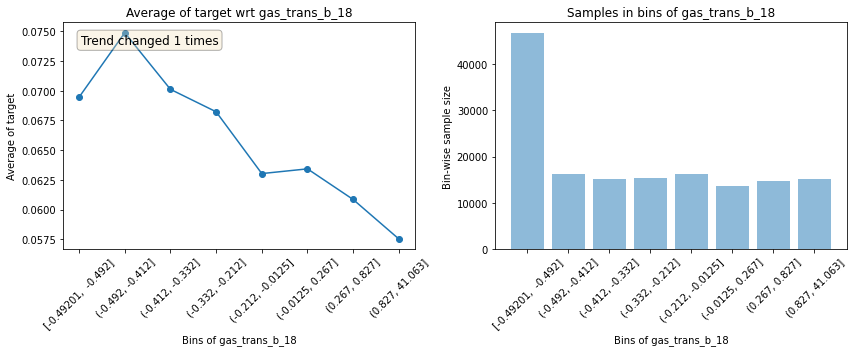

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_esp_b_18                                        


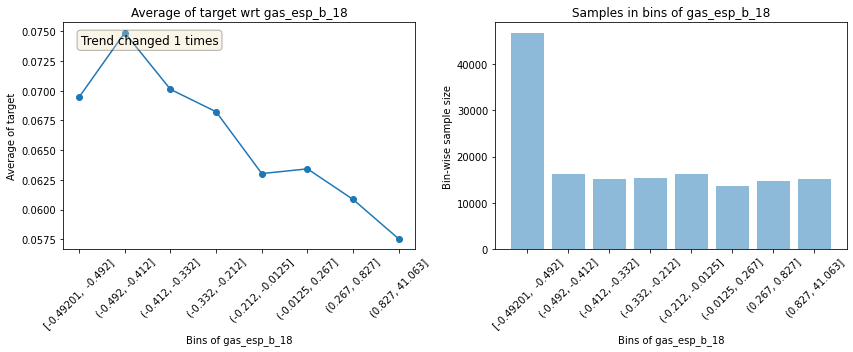

--------------------------------------------------------------------------------------------------------------


                                       Plots for gas_otrs_b_18                                        


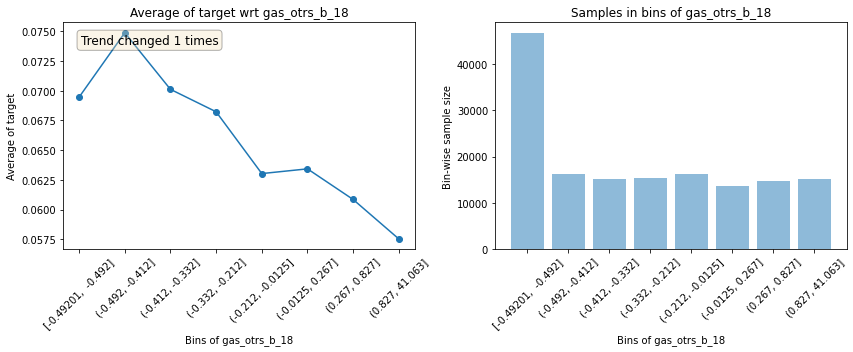

--------------------------------------------------------------------------------------------------------------


                                          Plots for ing_c_18                                          


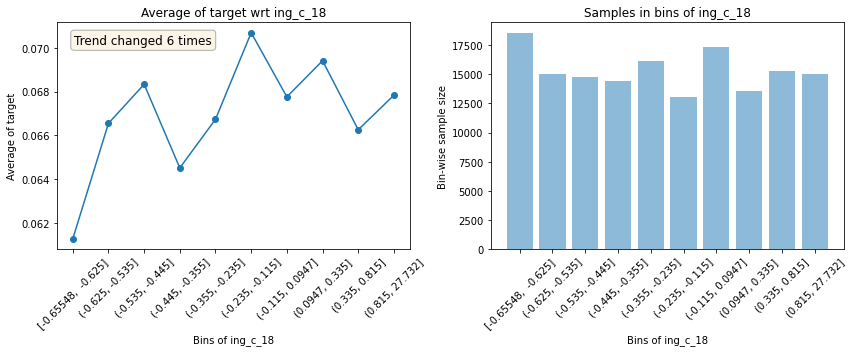

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_ali_c_18                                        


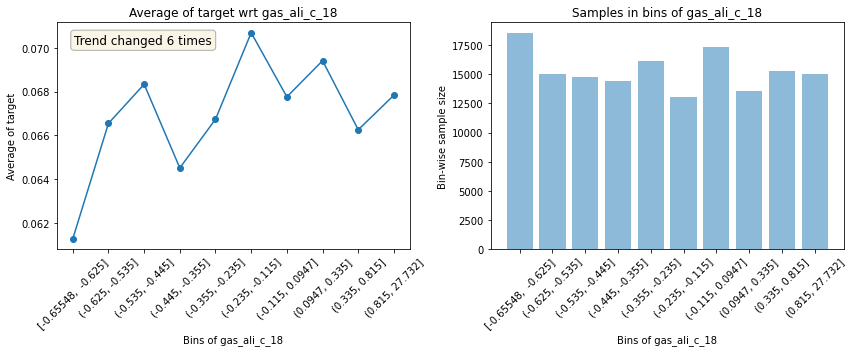

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_ves_c_18                                        


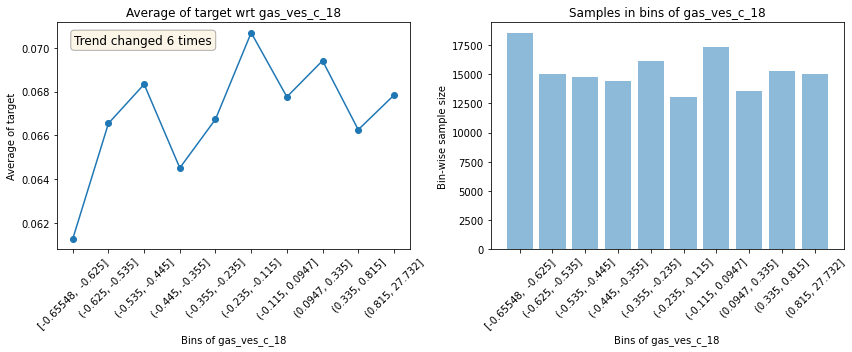

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_alq_c_18                                        


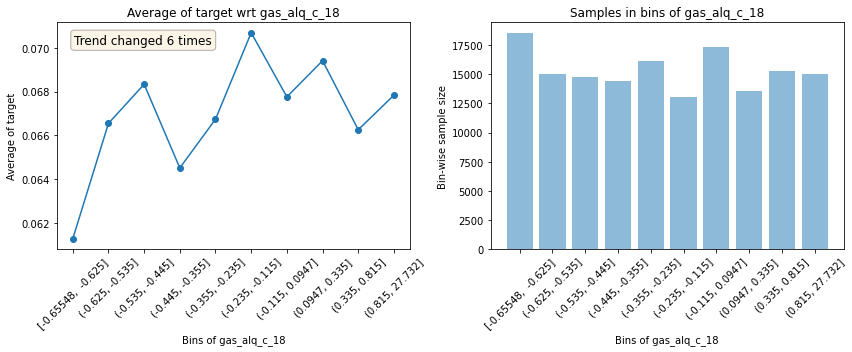

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_mue_c_18                                        


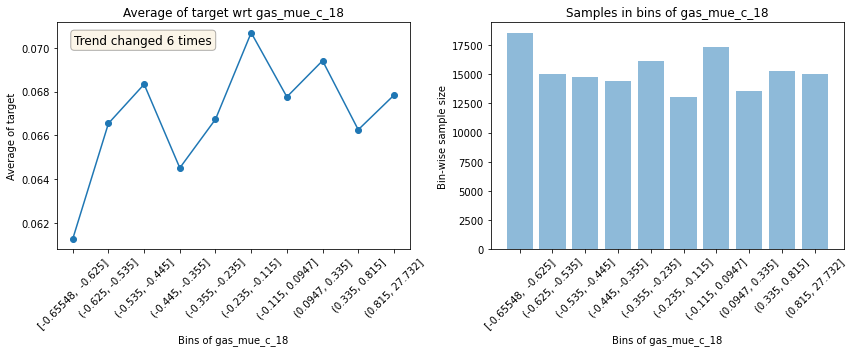

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_sal_c_18                                        


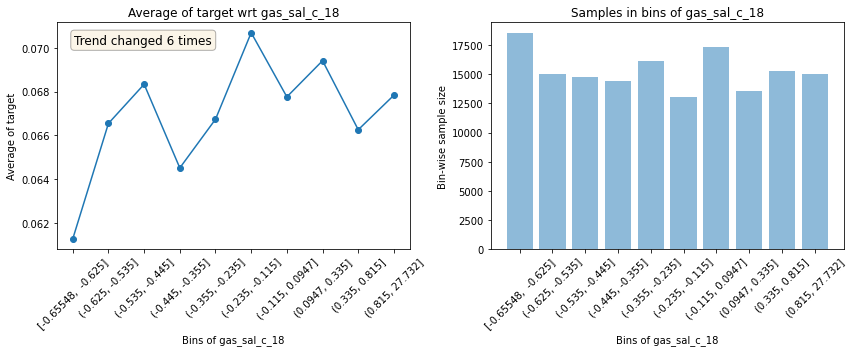

--------------------------------------------------------------------------------------------------------------


                                       Plots for gas_trans_c_18                                       


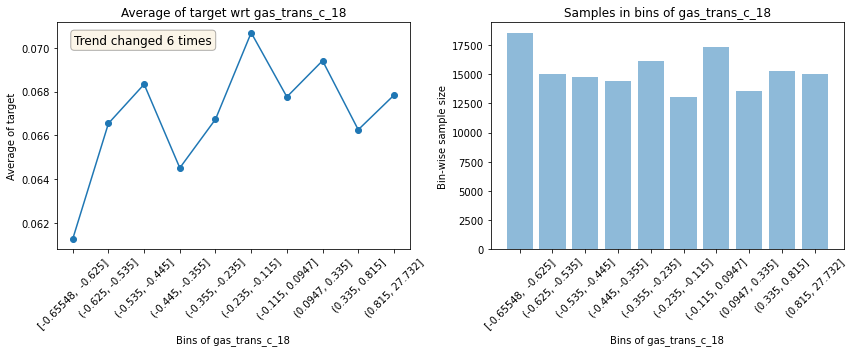

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_esp_c_18                                        


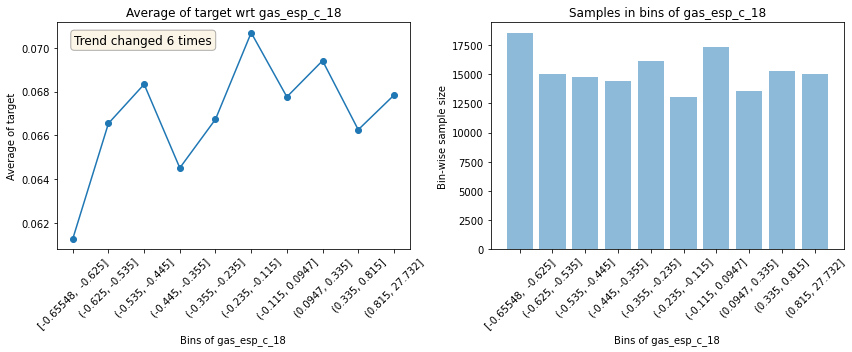

--------------------------------------------------------------------------------------------------------------


                                       Plots for gas_otrs_c_18                                        


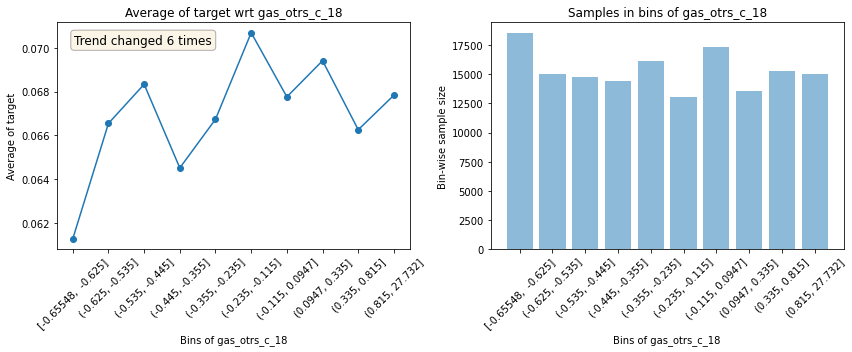

--------------------------------------------------------------------------------------------------------------


                                          Plots for ing_d_18                                          


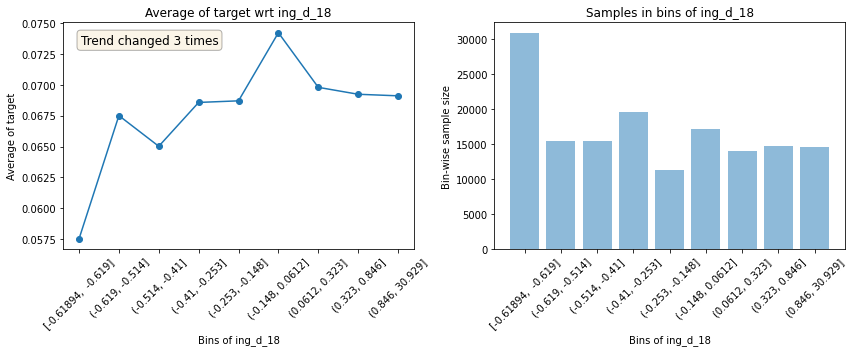

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_ali_d_18                                        


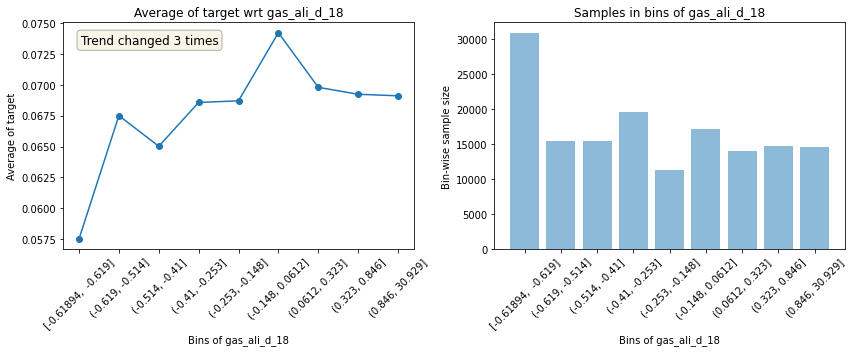

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_ves_d_18                                        


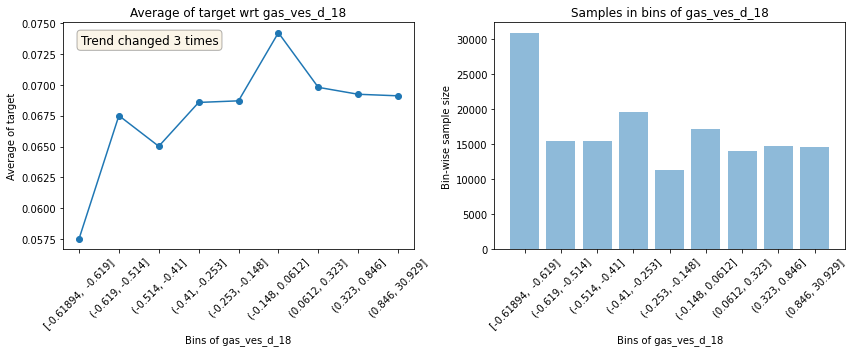

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_alq_d_18                                        


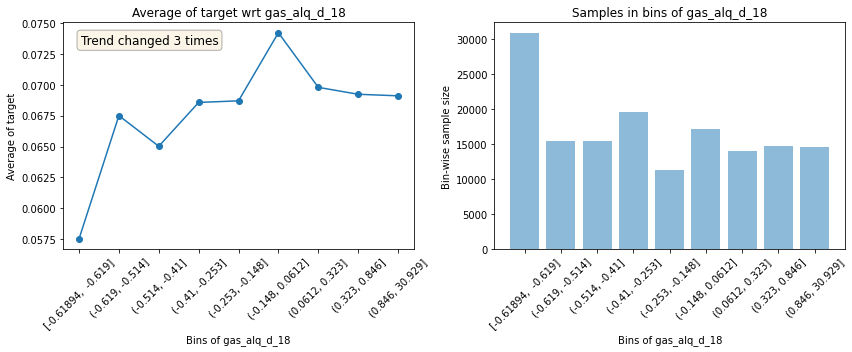

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_mue_d_18                                        


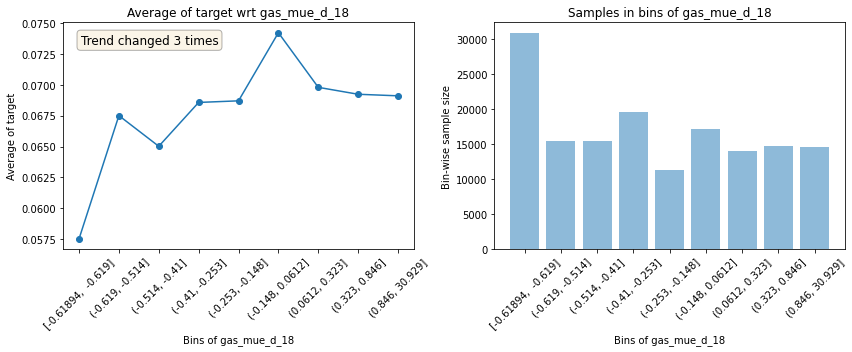

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_sal_d_18                                        


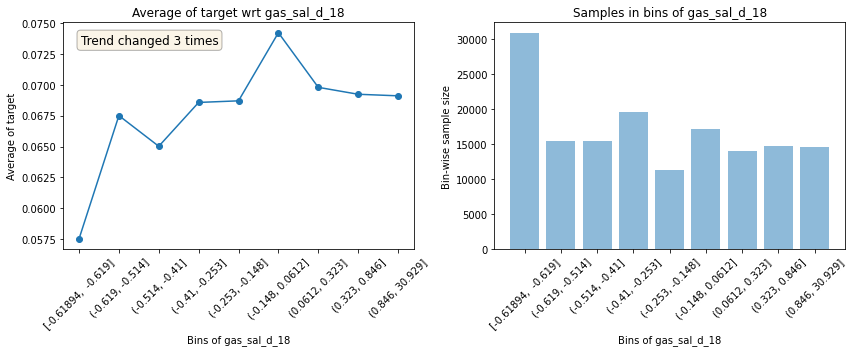

--------------------------------------------------------------------------------------------------------------


                                       Plots for gas_trans_d_18                                       


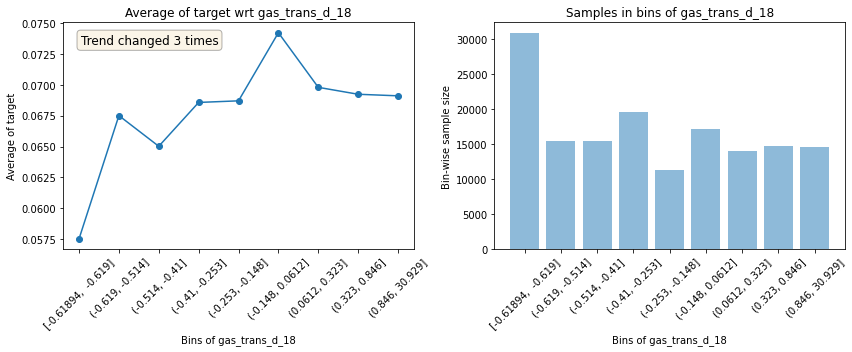

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_esp_d_18                                        


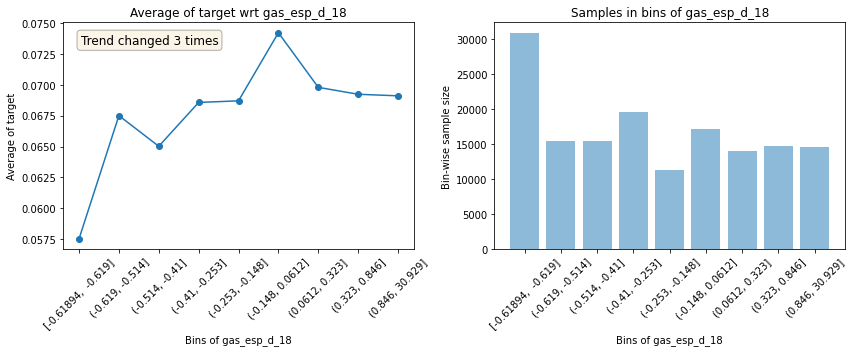

--------------------------------------------------------------------------------------------------------------


                                       Plots for gas_otrs_d_18                                        


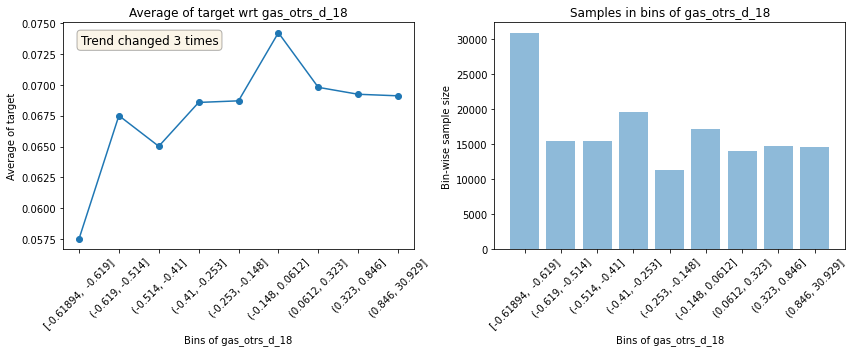

--------------------------------------------------------------------------------------------------------------


                                          Plots for ing_e_18                                          


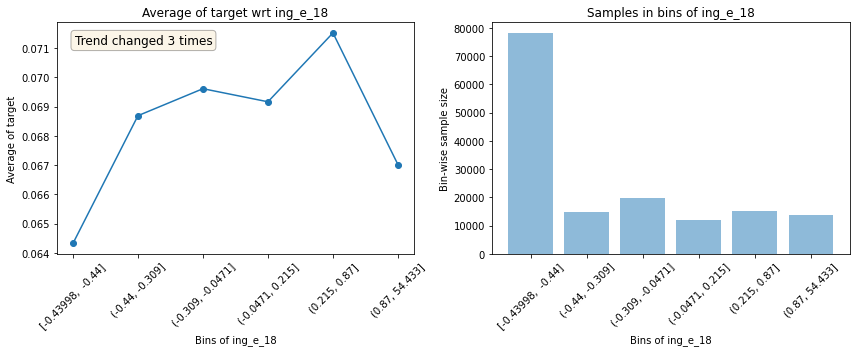

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_ali_e_18                                        


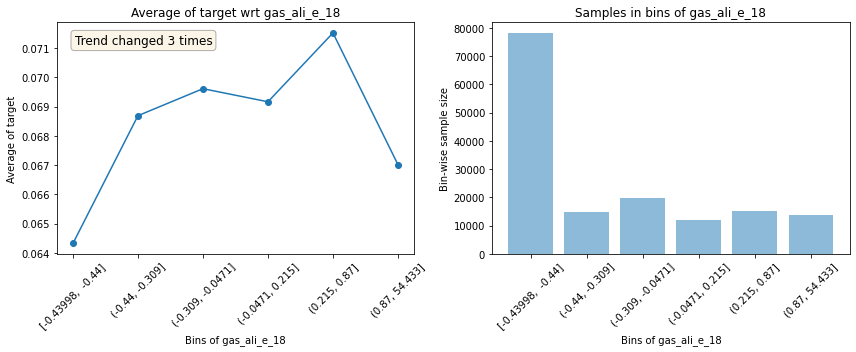

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_ves_e_18                                        


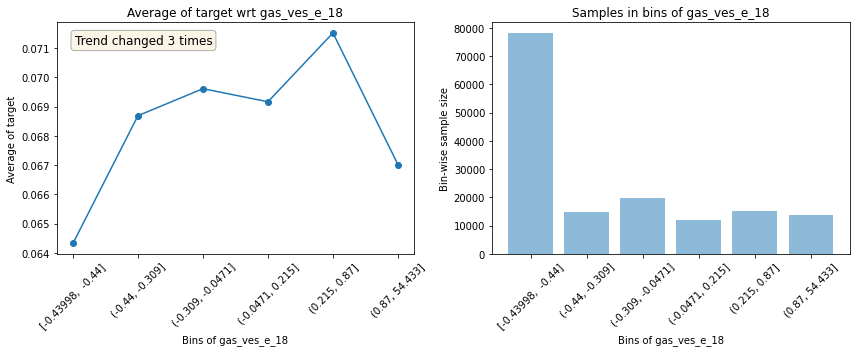

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_alq_e_18                                        


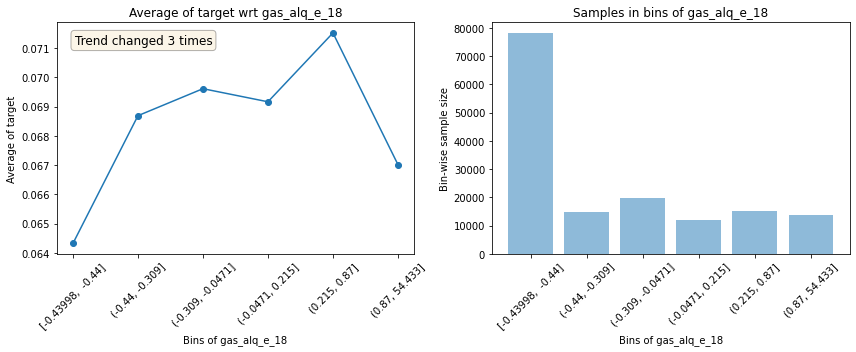

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_mue_e_18                                        


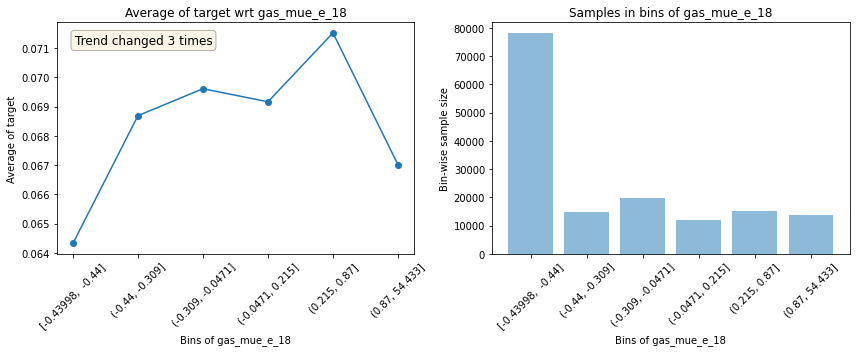

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_sal_e_18                                        


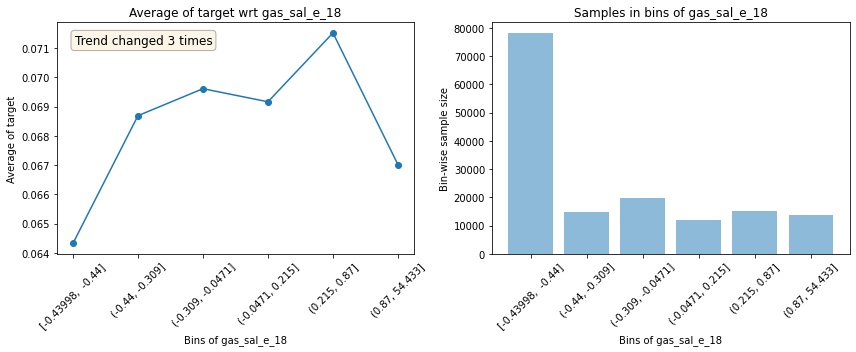

--------------------------------------------------------------------------------------------------------------


                                       Plots for gas_trans_e_18                                       


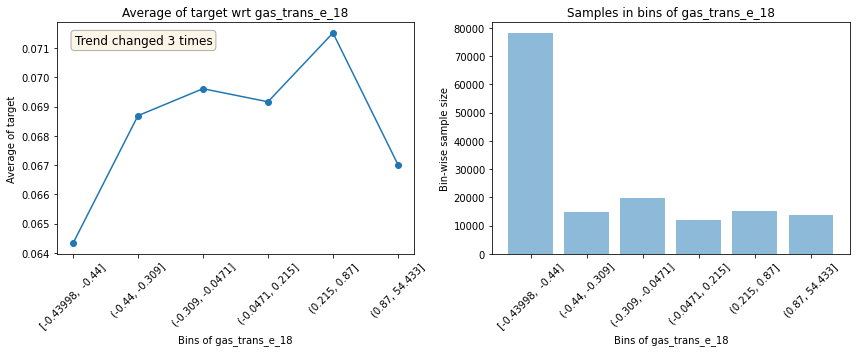

--------------------------------------------------------------------------------------------------------------


                                        Plots for gas_esp_e_18                                        


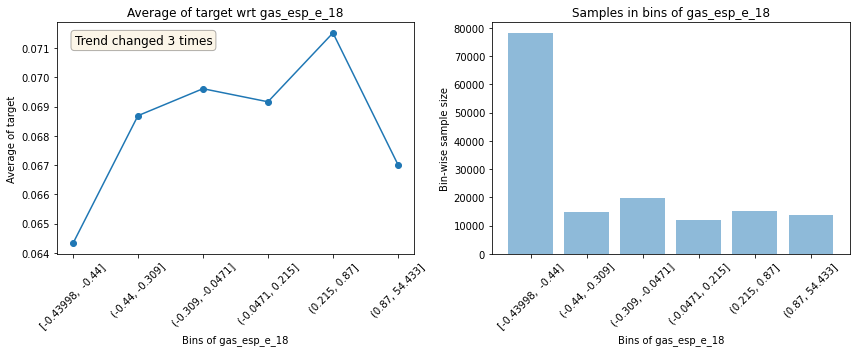

--------------------------------------------------------------------------------------------------------------


                                       Plots for gas_otrs_e_18                                        


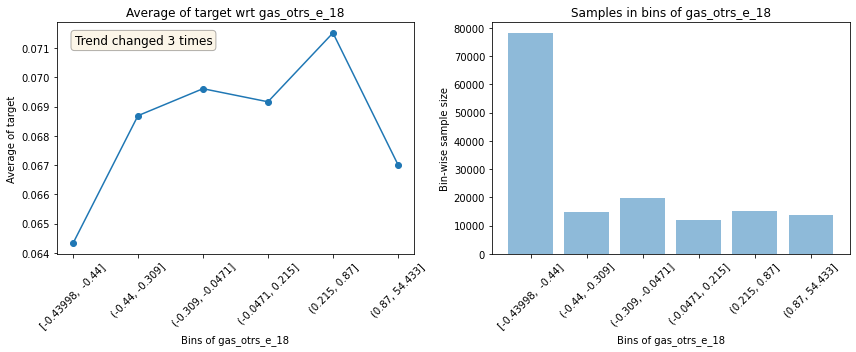

--------------------------------------------------------------------------------------------------------------


                                           Plots for ing_18                                           


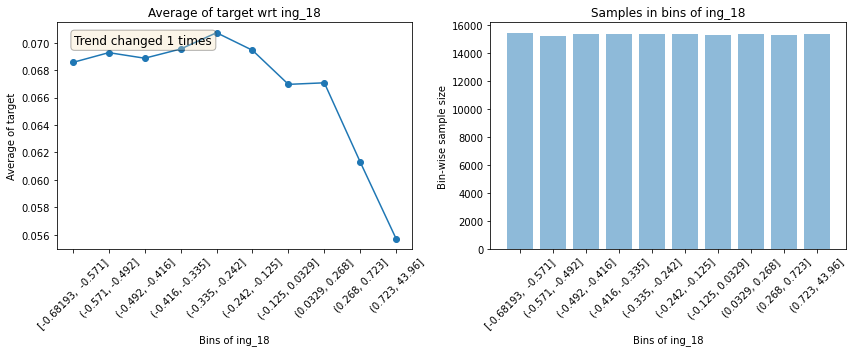

--------------------------------------------------------------------------------------------------------------


                                           Plots for g1_18                                            


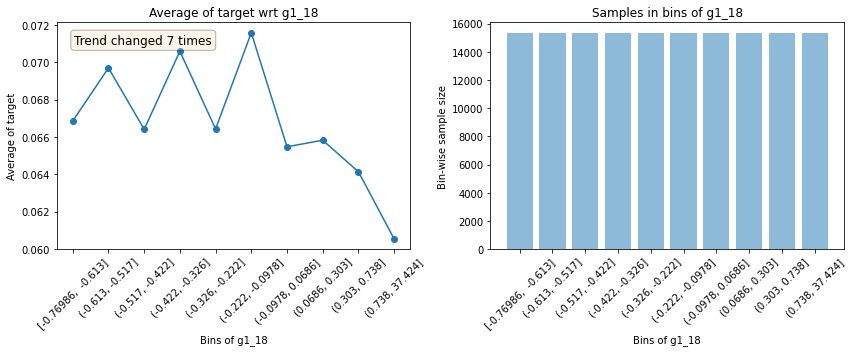

--------------------------------------------------------------------------------------------------------------


                                           Plots for g2_18                                            


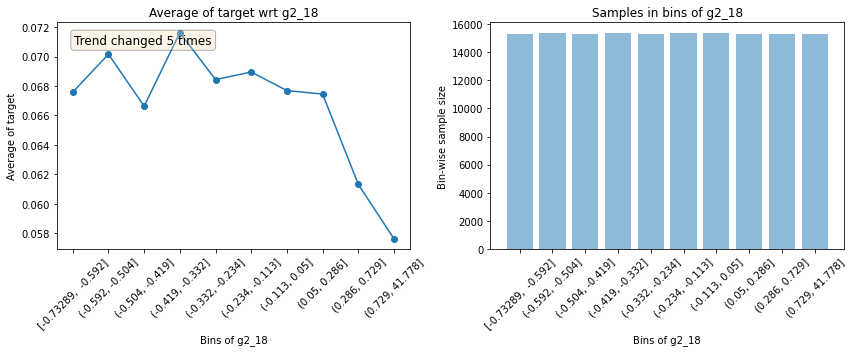

--------------------------------------------------------------------------------------------------------------


                                           Plots for g3_18                                            


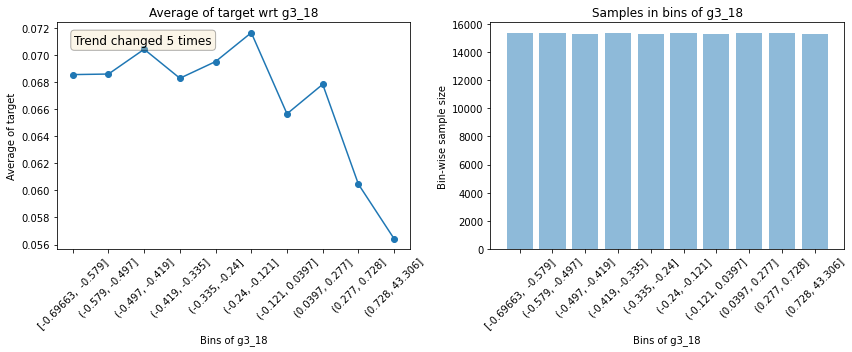

--------------------------------------------------------------------------------------------------------------


                                           Plots for g4_18                                            


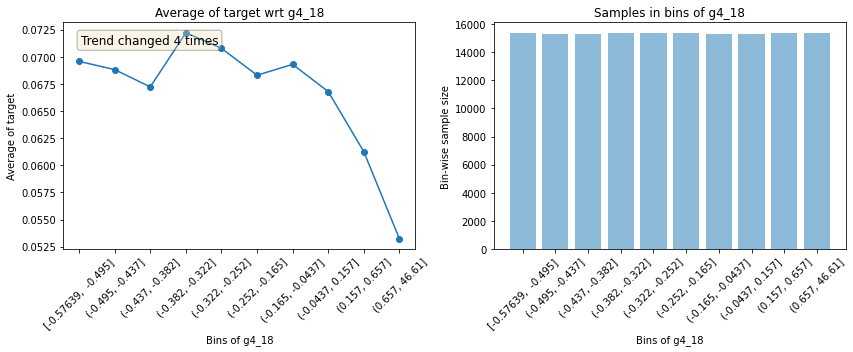

--------------------------------------------------------------------------------------------------------------


                                           Plots for g5_18                                            


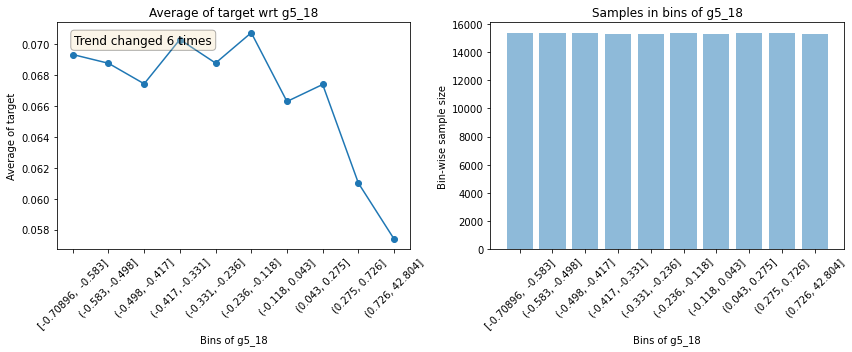

--------------------------------------------------------------------------------------------------------------


                                           Plots for g6_18                                            


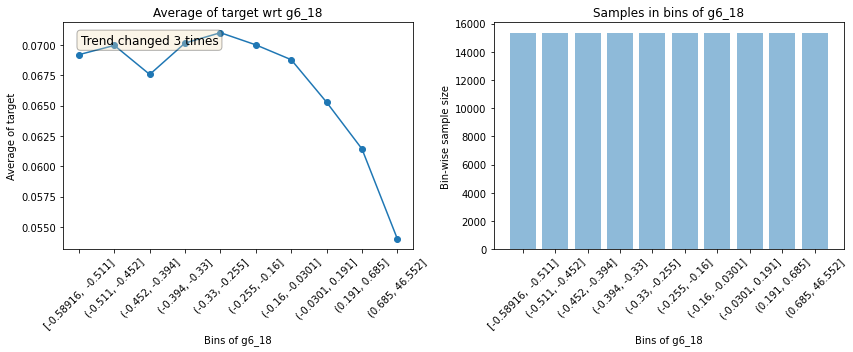

--------------------------------------------------------------------------------------------------------------


                                           Plots for g7_18                                            


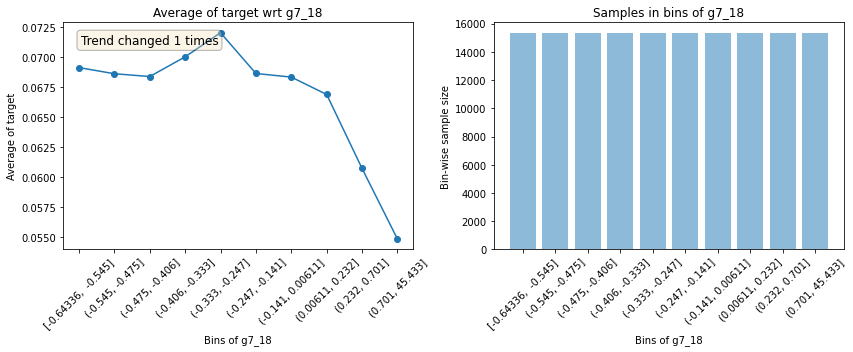

--------------------------------------------------------------------------------------------------------------


                                           Plots for g8_18                                            


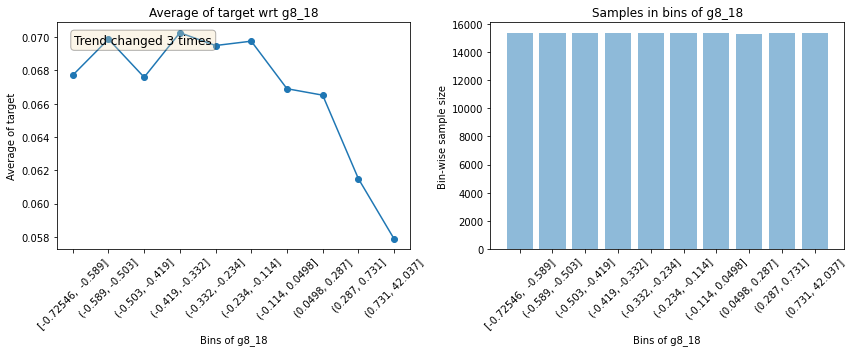

--------------------------------------------------------------------------------------------------------------


                                           Plots for score                                            


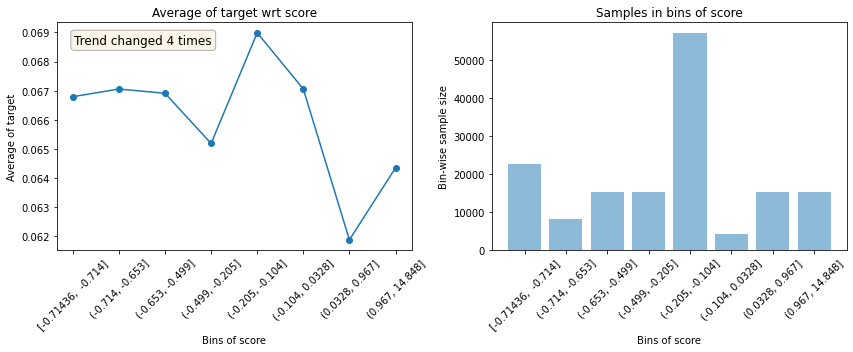

--------------------------------------------------------------------------------------------------------------


                                         Plots for viviendas                                          


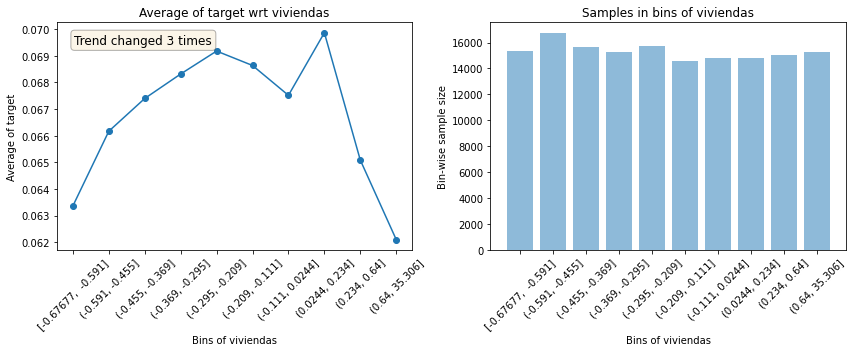

--------------------------------------------------------------------------------------------------------------


                                          Plots for nhogares                                          


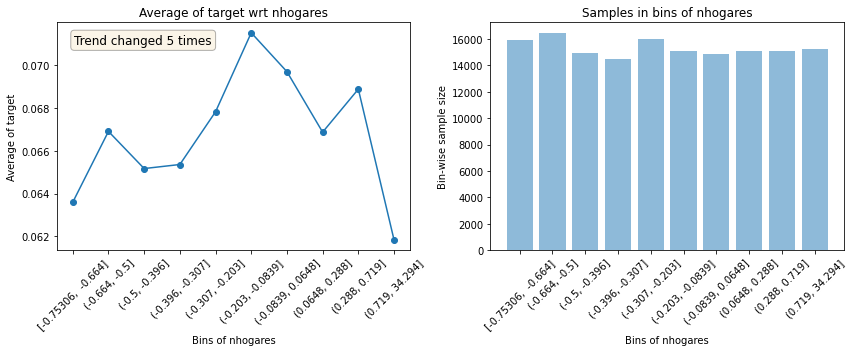

--------------------------------------------------------------------------------------------------------------


                                          Plots for dehogar1                                          


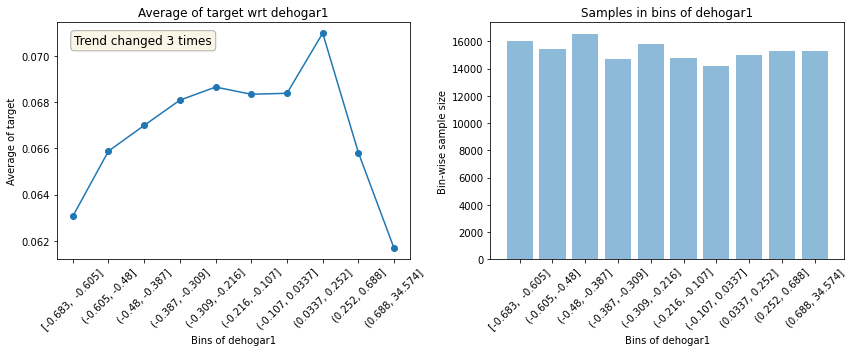

--------------------------------------------------------------------------------------------------------------


                                          Plots for dehogar2                                          


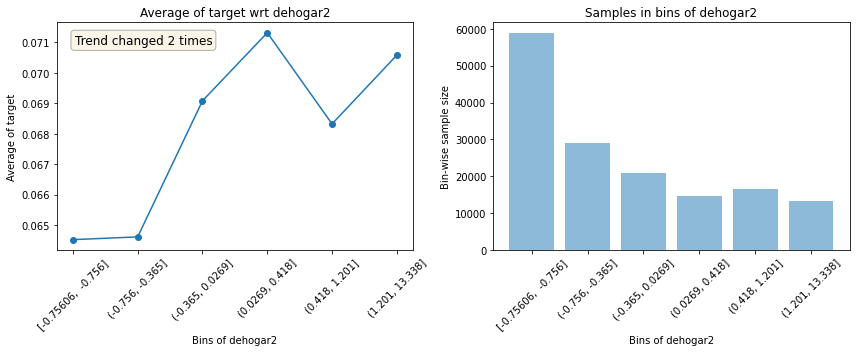

--------------------------------------------------------------------------------------------------------------


                                          Plots for dehogar3                                          


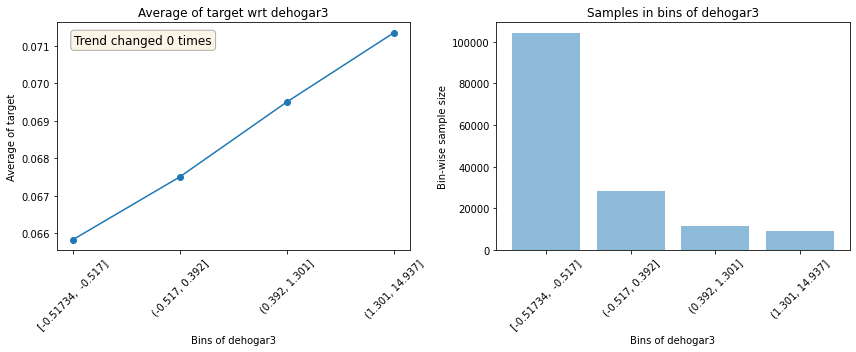

--------------------------------------------------------------------------------------------------------------


                                          Plots for dehogar4                                          


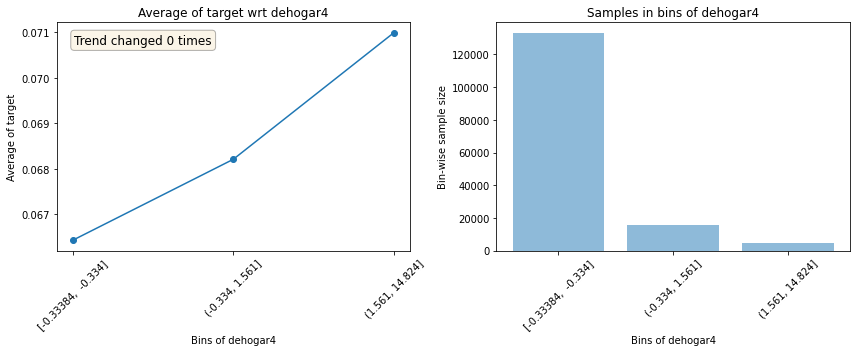

--------------------------------------------------------------------------------------------------------------


                                          Plots for dehogar5                                          


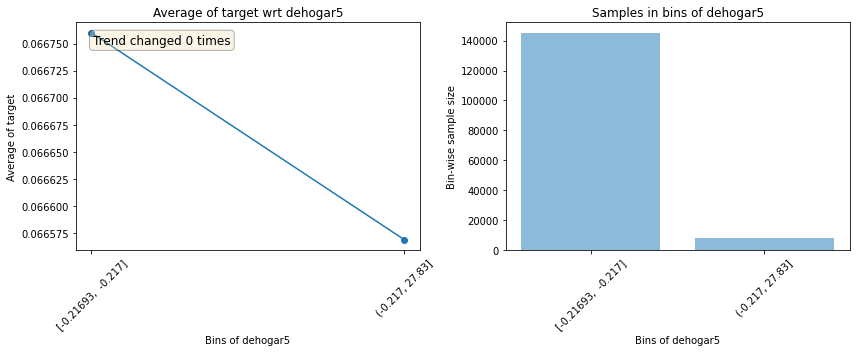

--------------------------------------------------------------------------------------------------------------


                                          Plots for dehogar6                                          


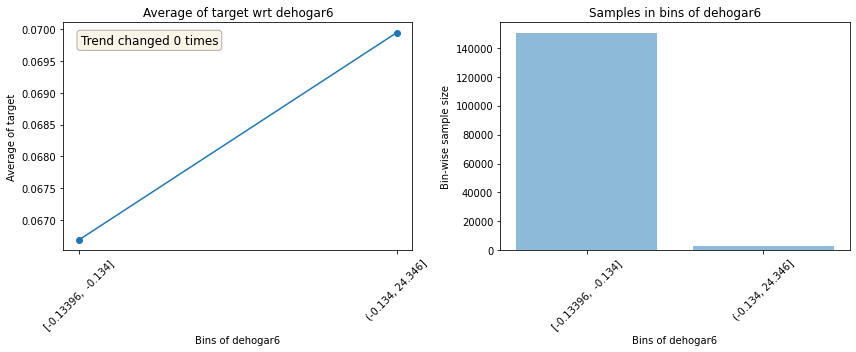

--------------------------------------------------------------------------------------------------------------


                                          Plots for dehogar7                                          


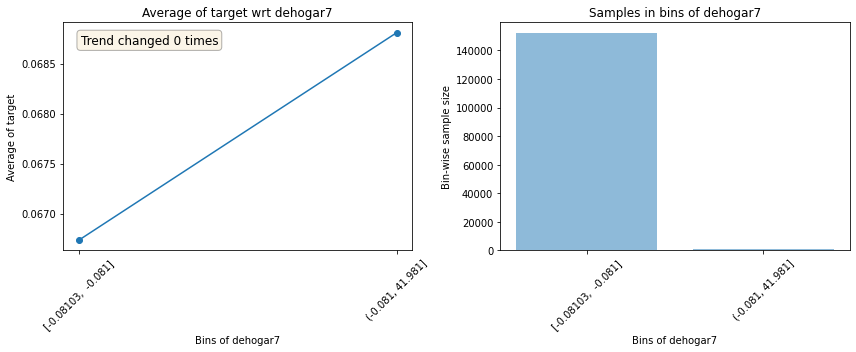

--------------------------------------------------------------------------------------------------------------


                                          Plots for dehogar8                                          


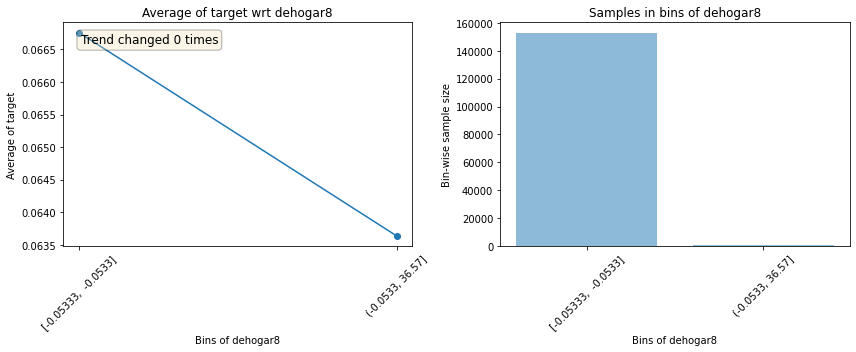

--------------------------------------------------------------------------------------------------------------


                                          Plots for tipviv1                                           


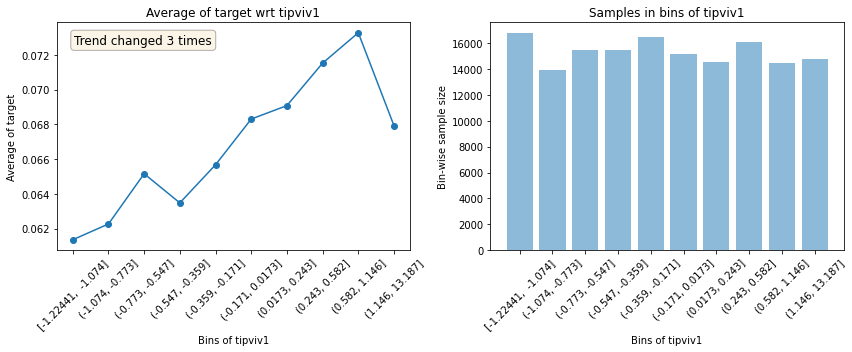

--------------------------------------------------------------------------------------------------------------


                                          Plots for tipviv2                                           


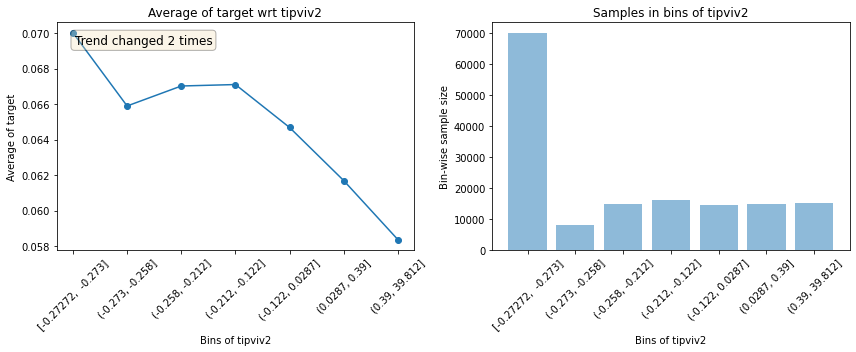

--------------------------------------------------------------------------------------------------------------


                                          Plots for tipviv3                                           


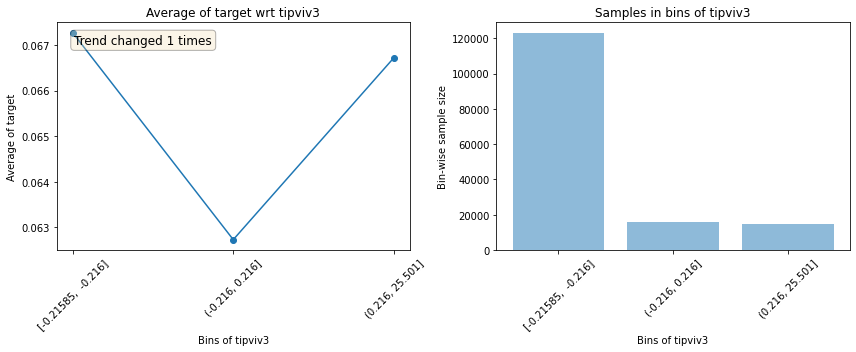

--------------------------------------------------------------------------------------------------------------


                                          Plots for tipviv4                                           


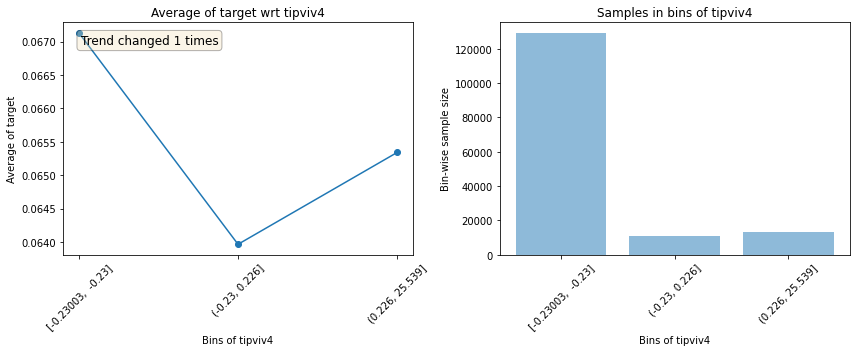

--------------------------------------------------------------------------------------------------------------


                                          Plots for tipviv6                                           


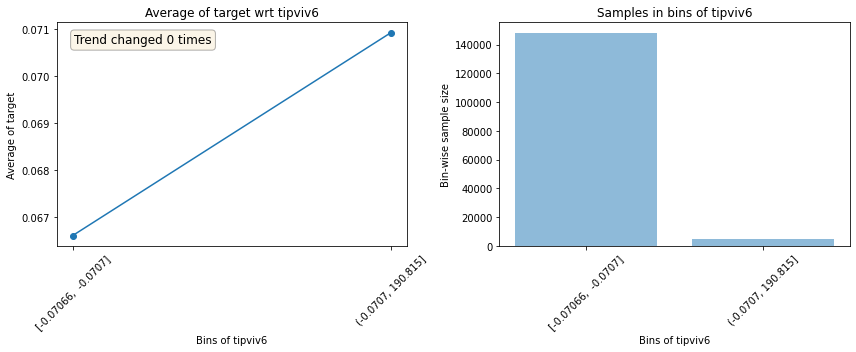

--------------------------------------------------------------------------------------------------------------


                                          Plots for tipviv7                                           


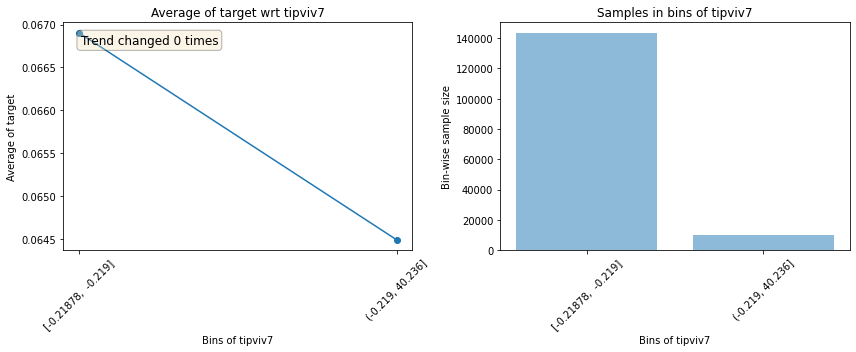

--------------------------------------------------------------------------------------------------------------


                                          Plots for tipviv9                                           


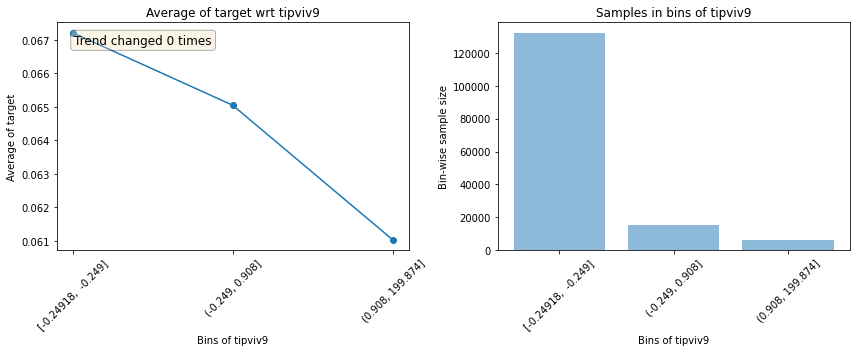

--------------------------------------------------------------------------------------------------------------


                                          Plots for matpar1                                           


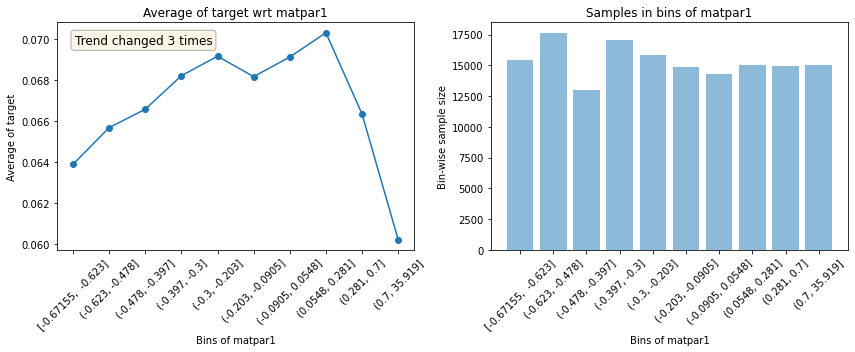

--------------------------------------------------------------------------------------------------------------


                                          Plots for matpar2                                           


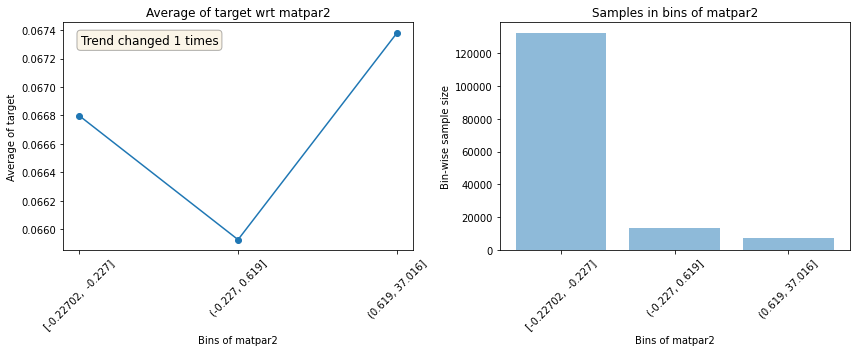

--------------------------------------------------------------------------------------------------------------


                                          Plots for matpar3                                           


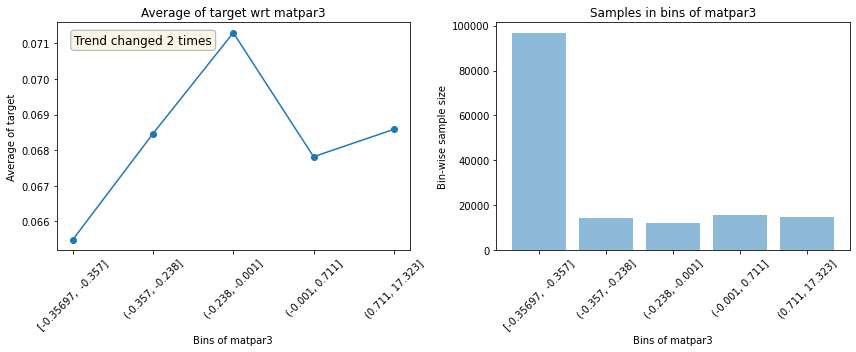

--------------------------------------------------------------------------------------------------------------


                                          Plots for matpar4                                           


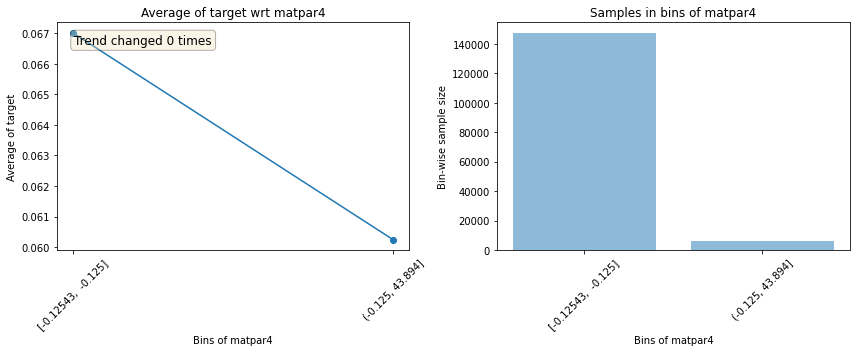

--------------------------------------------------------------------------------------------------------------


                                          Plots for matpar5                                           


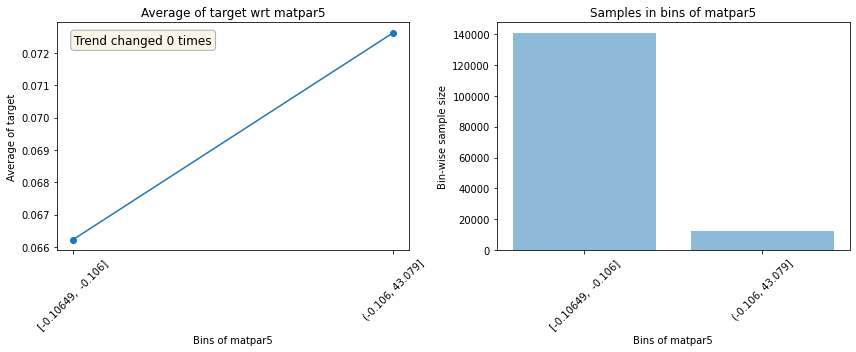

--------------------------------------------------------------------------------------------------------------


                                          Plots for matpar6                                           


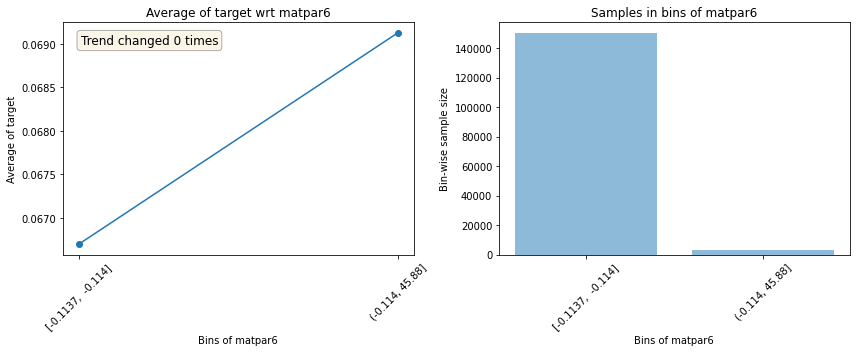

--------------------------------------------------------------------------------------------------------------


                                          Plots for matpar7                                           


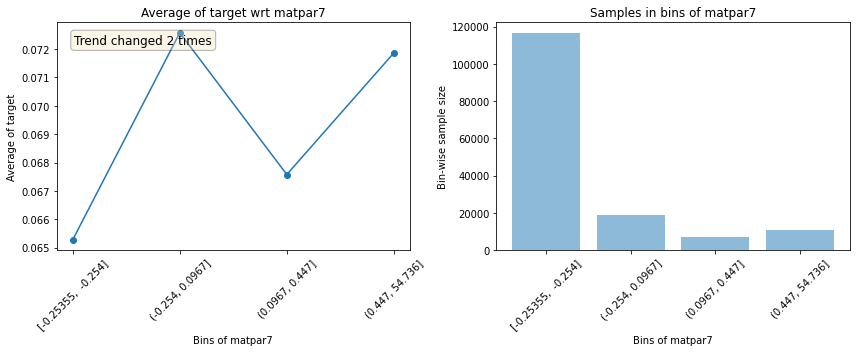

--------------------------------------------------------------------------------------------------------------


                                          Plots for matpar8                                           


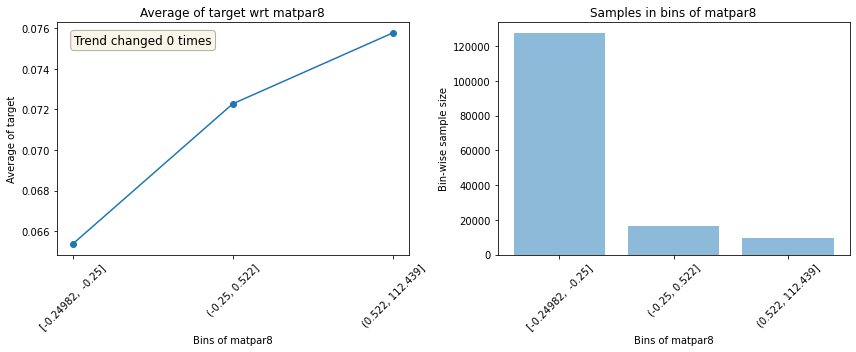

--------------------------------------------------------------------------------------------------------------


                                          Plots for matpis1                                           


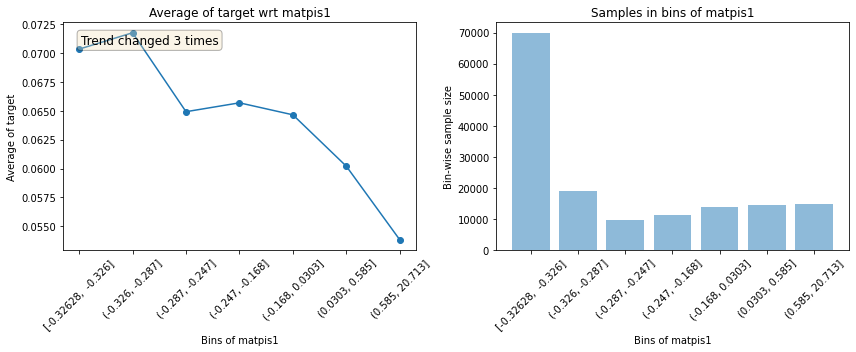

--------------------------------------------------------------------------------------------------------------


                                          Plots for matpis2                                           


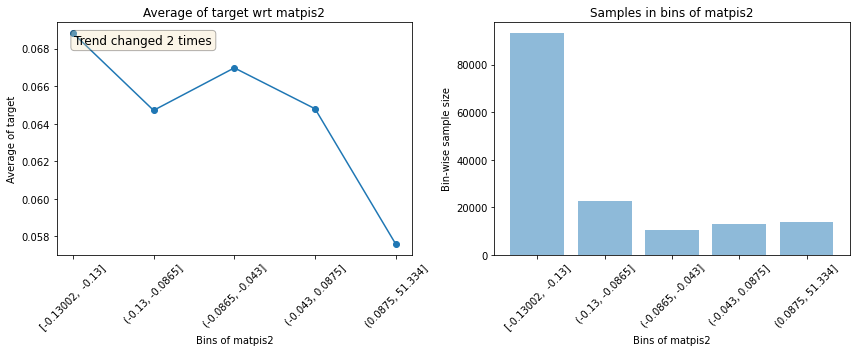

--------------------------------------------------------------------------------------------------------------


                                          Plots for matpis3                                           


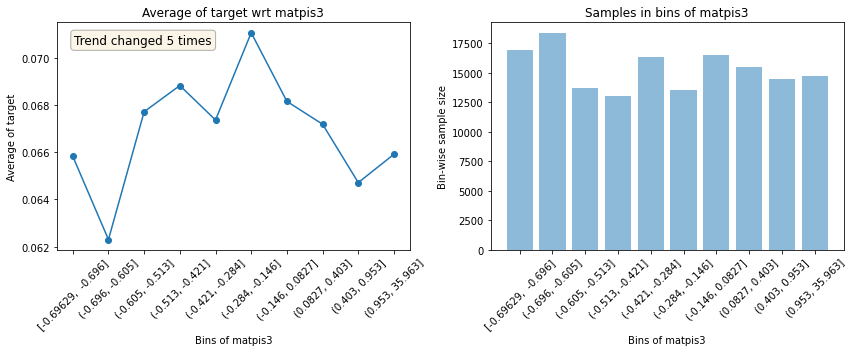

--------------------------------------------------------------------------------------------------------------


                                          Plots for matpis4                                           


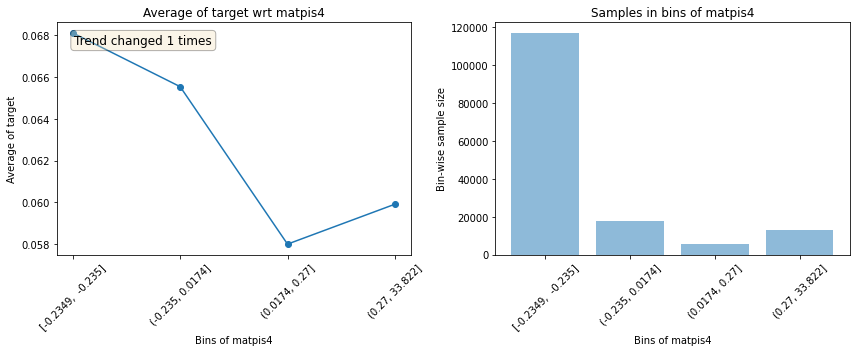

--------------------------------------------------------------------------------------------------------------


                                          Plots for matpis5                                           


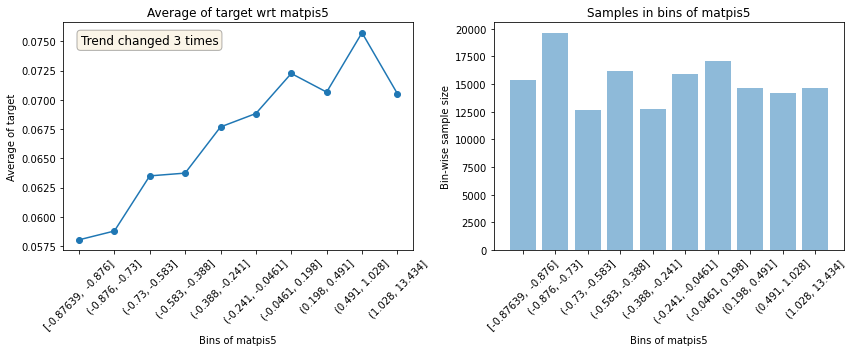

--------------------------------------------------------------------------------------------------------------


                                          Plots for matpis6                                           


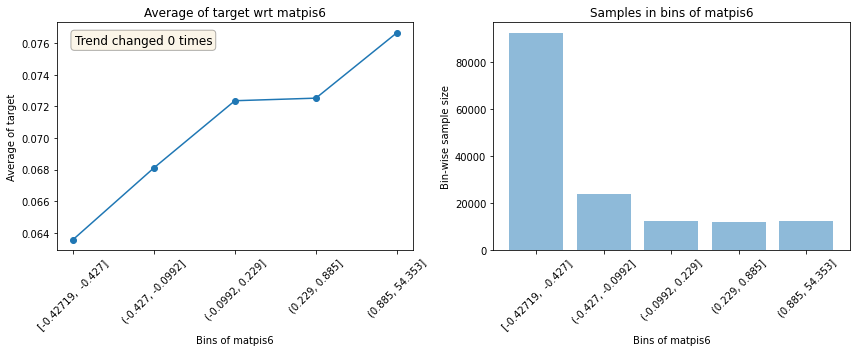

--------------------------------------------------------------------------------------------------------------


                                          Plots for matpis7                                           


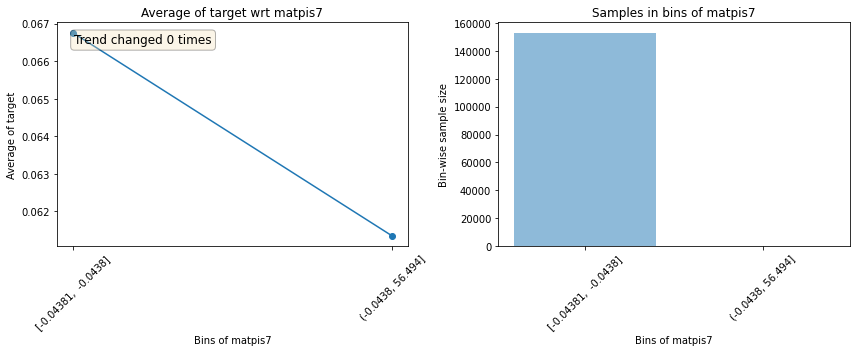

--------------------------------------------------------------------------------------------------------------


                                          Plots for abaagu1                                           


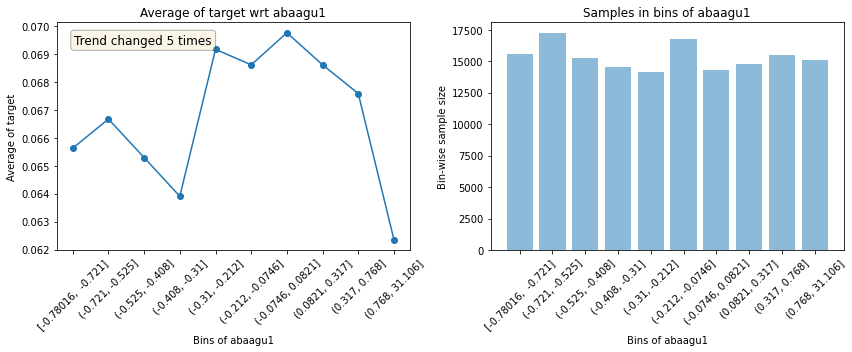

--------------------------------------------------------------------------------------------------------------


                                          Plots for abaagu2                                           


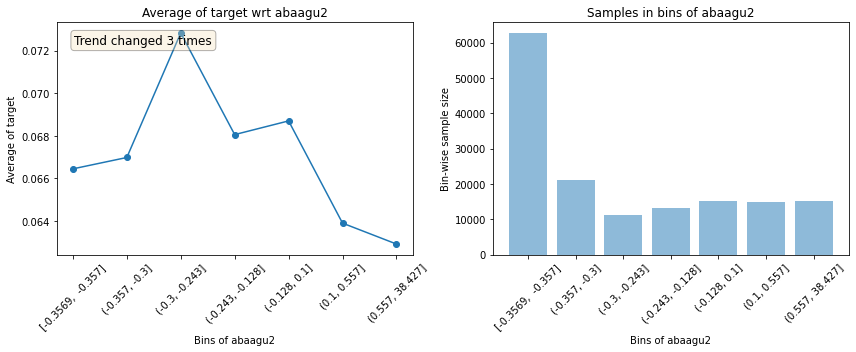

--------------------------------------------------------------------------------------------------------------


                                          Plots for abaagu3                                           


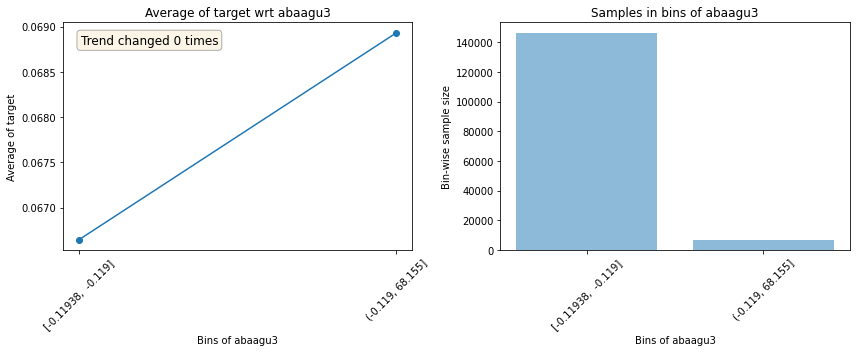

--------------------------------------------------------------------------------------------------------------


                                          Plots for abaagu4                                           


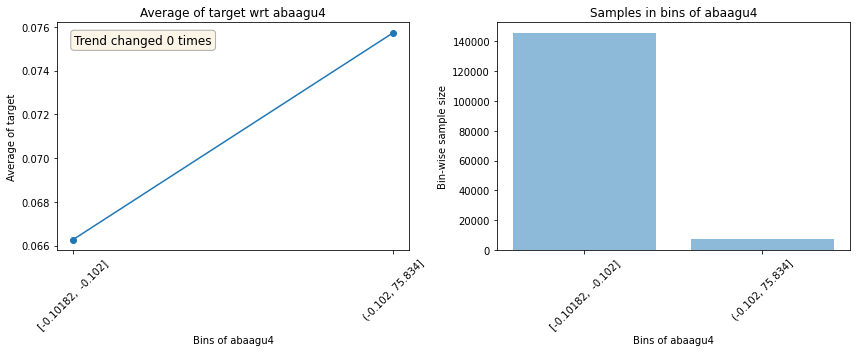

--------------------------------------------------------------------------------------------------------------


                                          Plots for abaagu5                                           


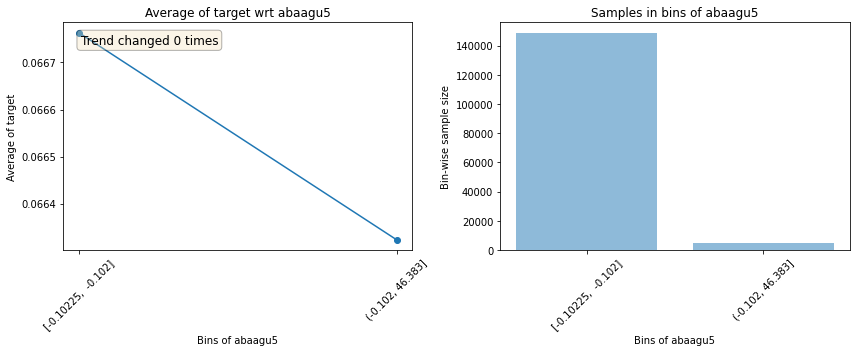

--------------------------------------------------------------------------------------------------------------


                                          Plots for abaagu6                                           


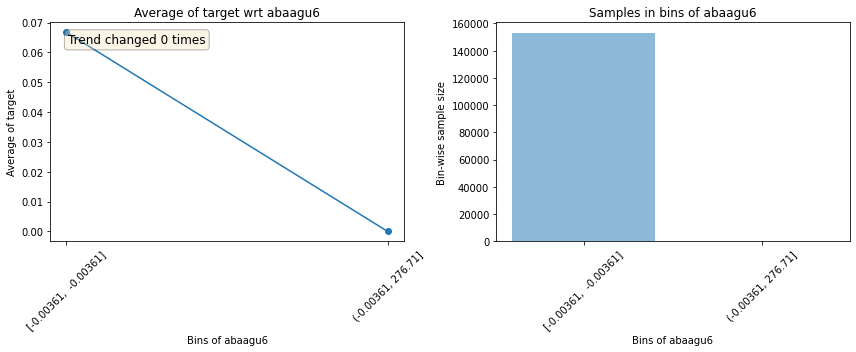

--------------------------------------------------------------------------------------------------------------


                                          Plots for abaagu7                                           


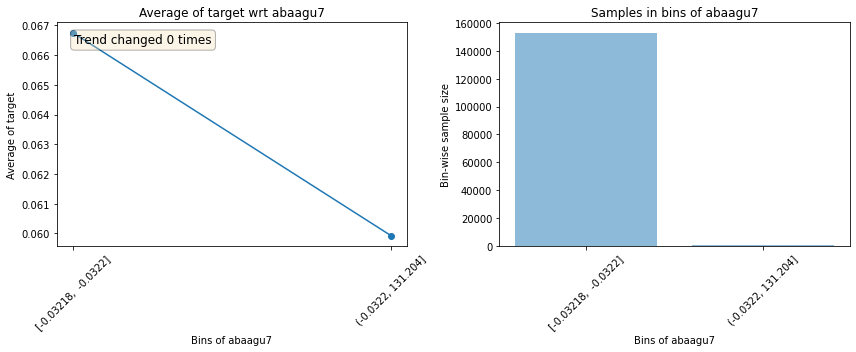

--------------------------------------------------------------------------------------------------------------


                                          Plots for abaagu8                                           


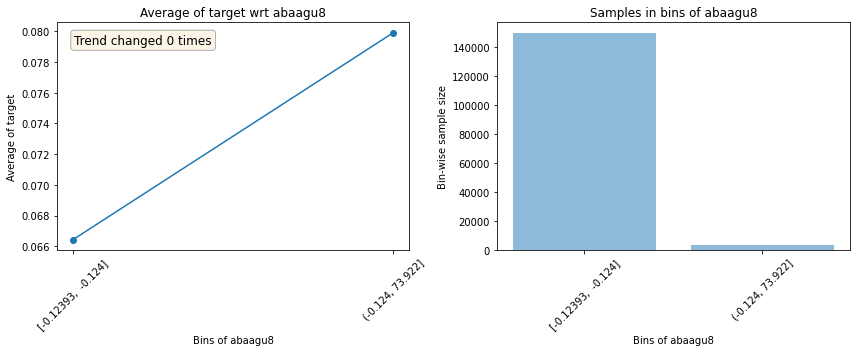

--------------------------------------------------------------------------------------------------------------


                                          Plots for abaagu9                                           


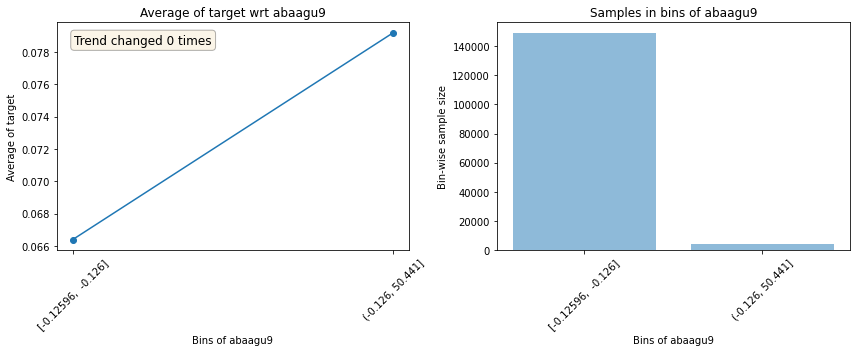

--------------------------------------------------------------------------------------------------------------


                                          Plots for vivten1                                           


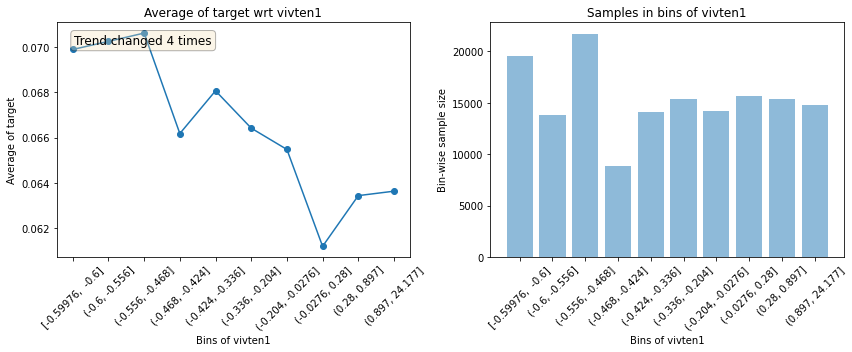

--------------------------------------------------------------------------------------------------------------


                                          Plots for vivten2                                           


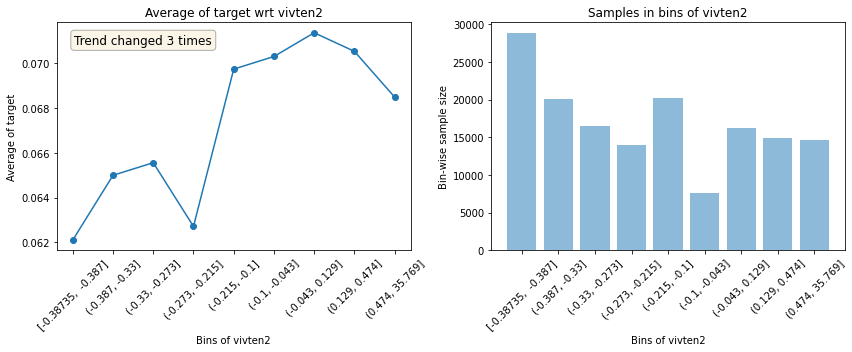

--------------------------------------------------------------------------------------------------------------


                                          Plots for vivten3                                           


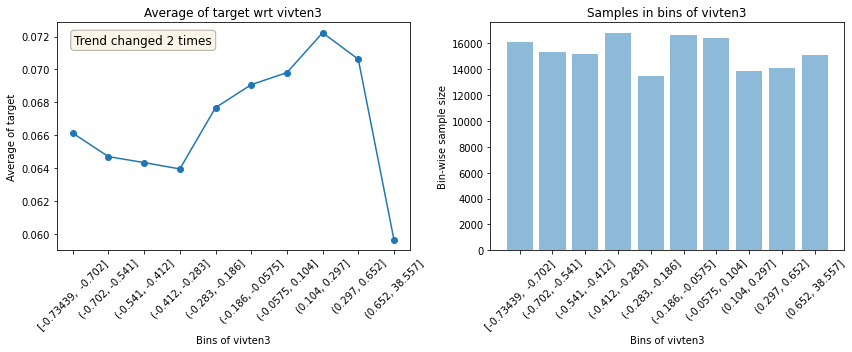

--------------------------------------------------------------------------------------------------------------


                                          Plots for vivten4                                           


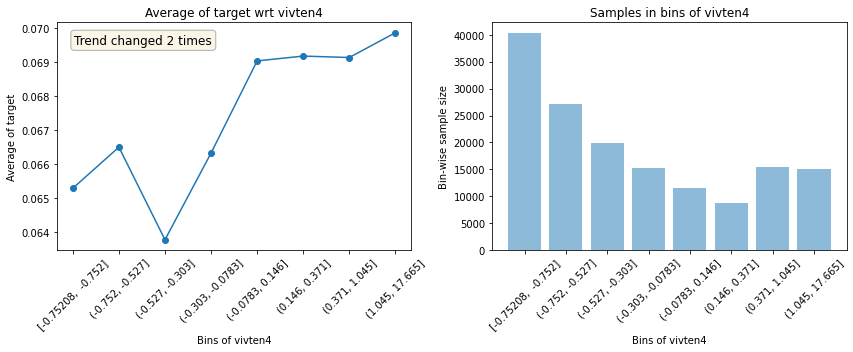

--------------------------------------------------------------------------------------------------------------


                                          Plots for vivten5                                           


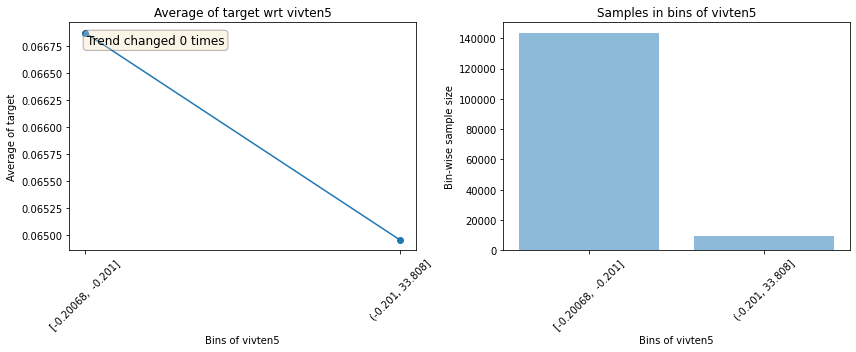

--------------------------------------------------------------------------------------------------------------


                                           Plots for totper                                           


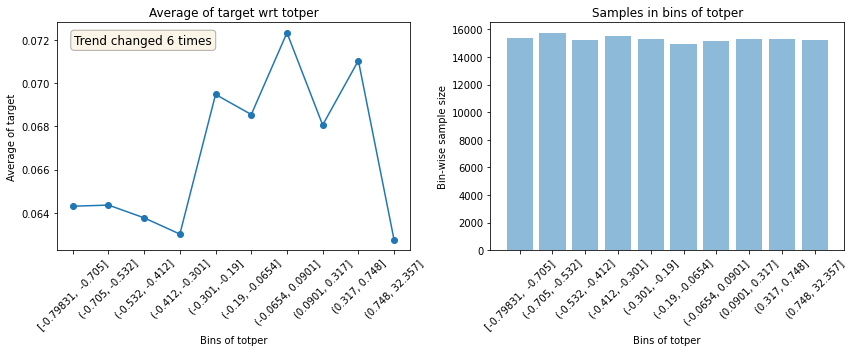

--------------------------------------------------------------------------------------------------------------


                                          Plots for mattec1                                           


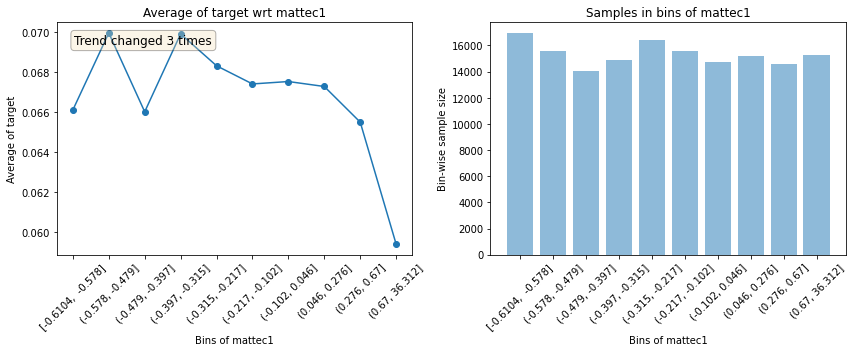

--------------------------------------------------------------------------------------------------------------


                                          Plots for mattec2                                           


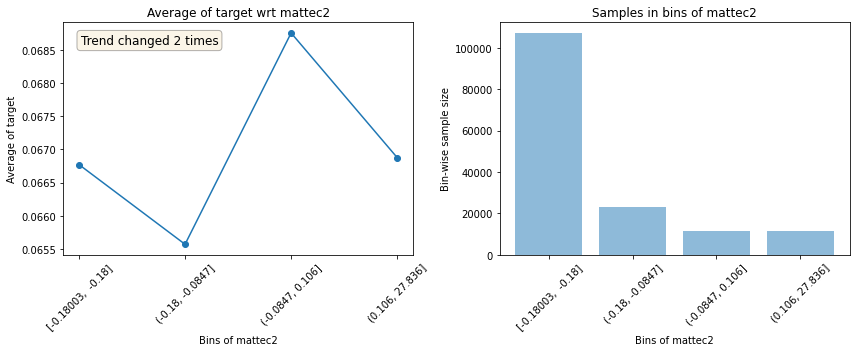

--------------------------------------------------------------------------------------------------------------


                                          Plots for mattec3                                           


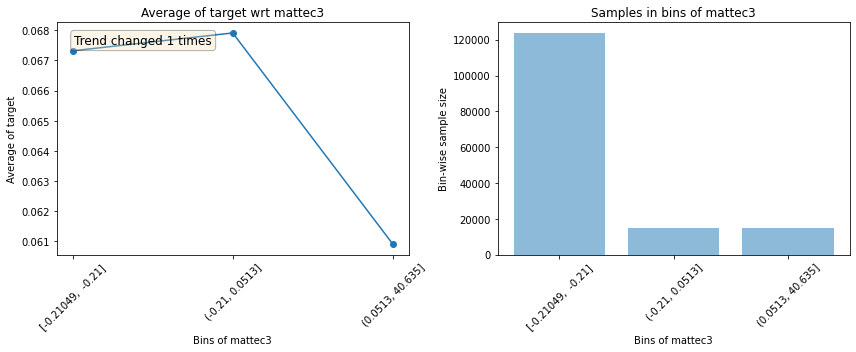

--------------------------------------------------------------------------------------------------------------


                                          Plots for mattec4                                           


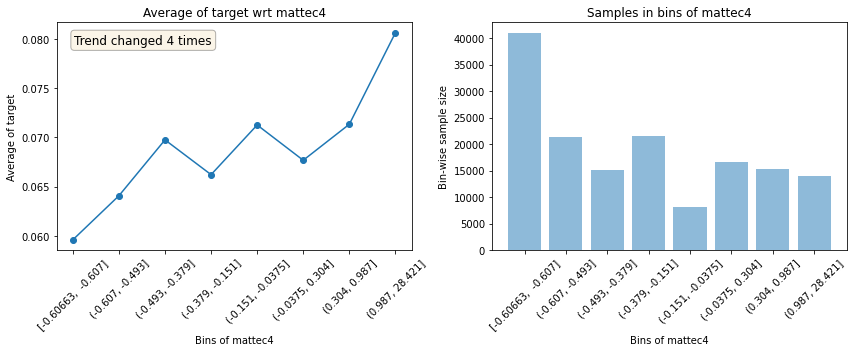

--------------------------------------------------------------------------------------------------------------


                                          Plots for mattec5                                           


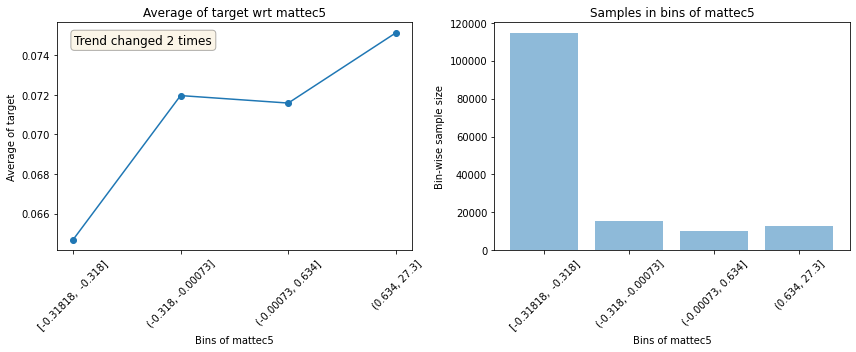

--------------------------------------------------------------------------------------------------------------


                                          Plots for mattec6                                           


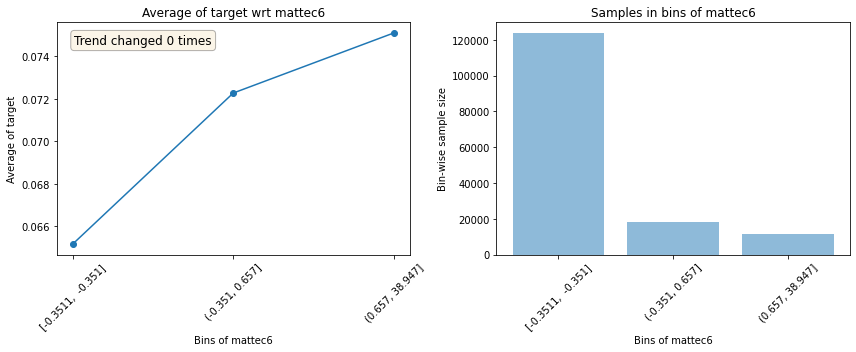

--------------------------------------------------------------------------------------------------------------


                                          Plots for mattec7                                           


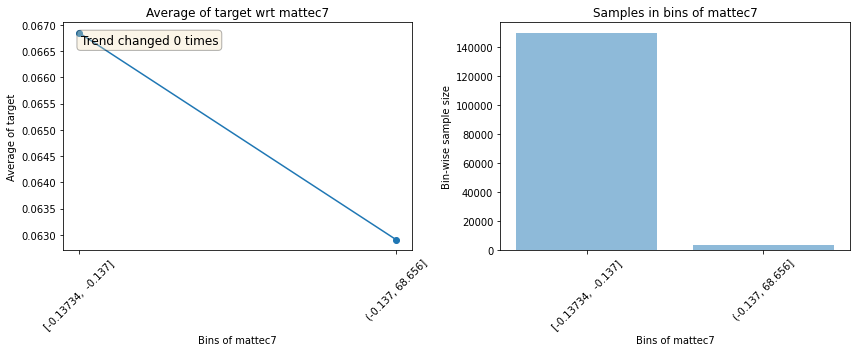

--------------------------------------------------------------------------------------------------------------


                                          Plots for mattec8                                           


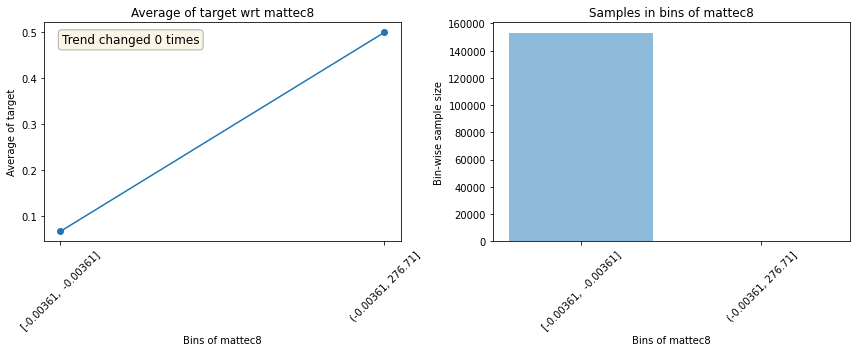

--------------------------------------------------------------------------------------------------------------


                                          Plots for agudia1                                           


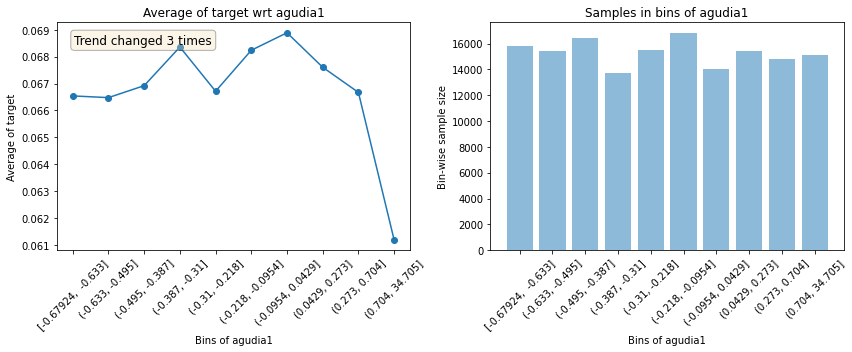

--------------------------------------------------------------------------------------------------------------


                                          Plots for agudia2                                           


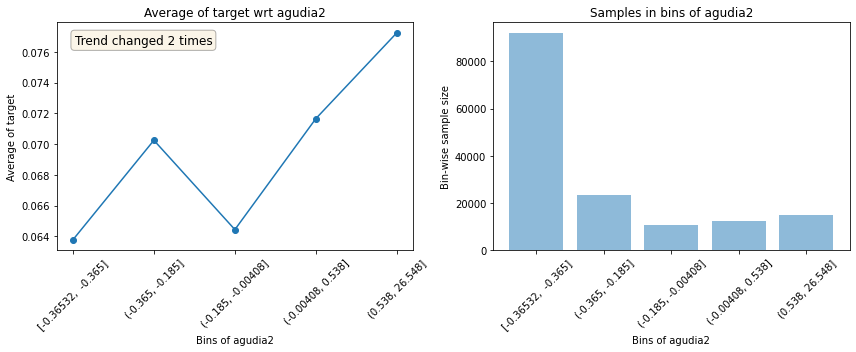

--------------------------------------------------------------------------------------------------------------


                                          Plots for agundia1                                          


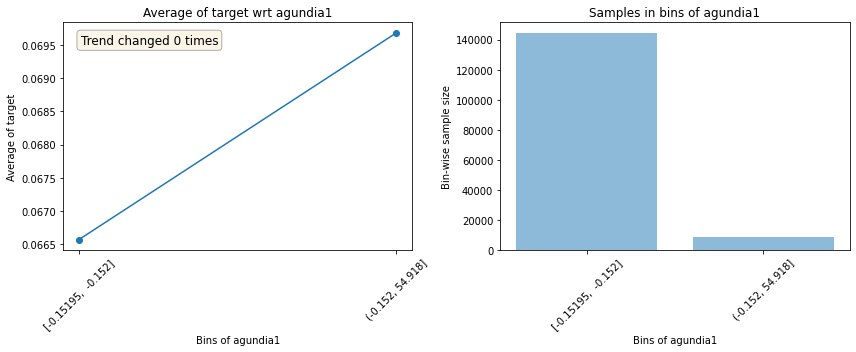

--------------------------------------------------------------------------------------------------------------


                                          Plots for agundia2                                          


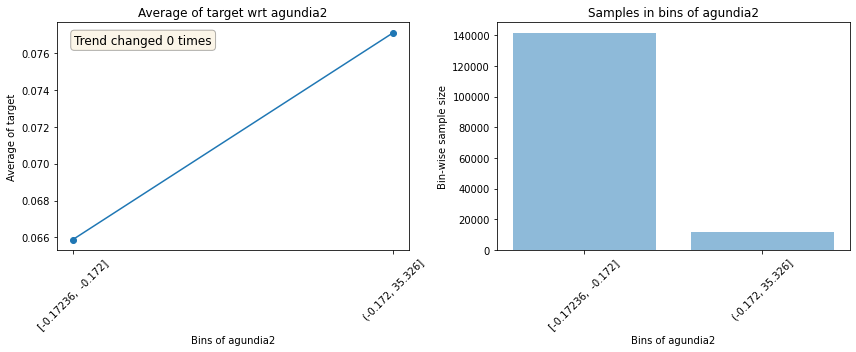

--------------------------------------------------------------------------------------------------------------


                                          Plots for agundia3                                          


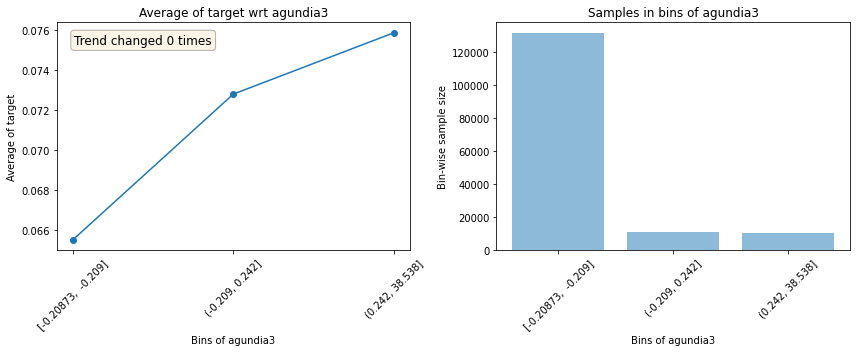

--------------------------------------------------------------------------------------------------------------


                                          Plots for agundia4                                          


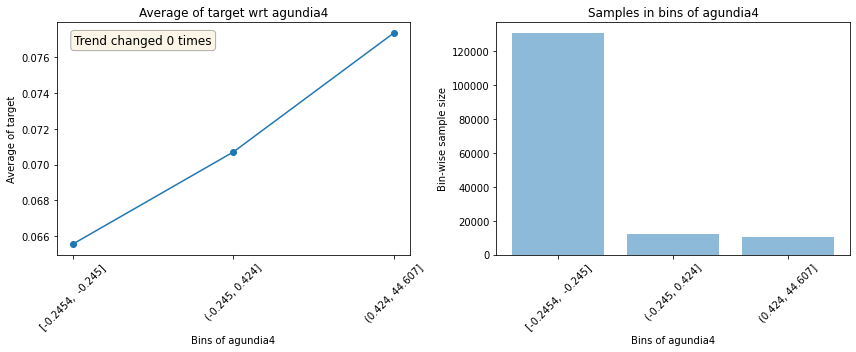

--------------------------------------------------------------------------------------------------------------


                                          Plots for agundia5                                          


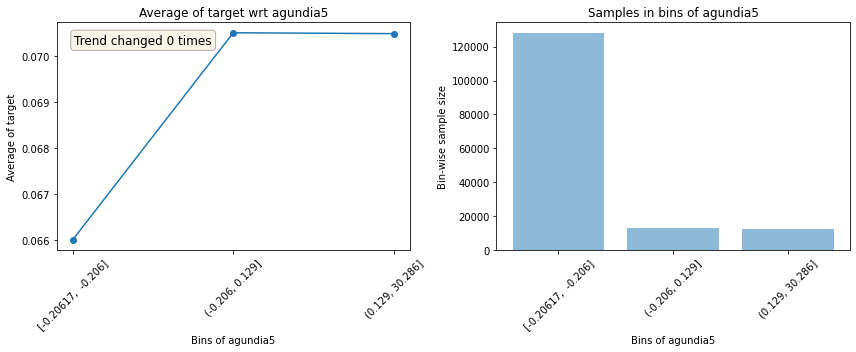

--------------------------------------------------------------------------------------------------------------


                                          Plots for agundia6                                          


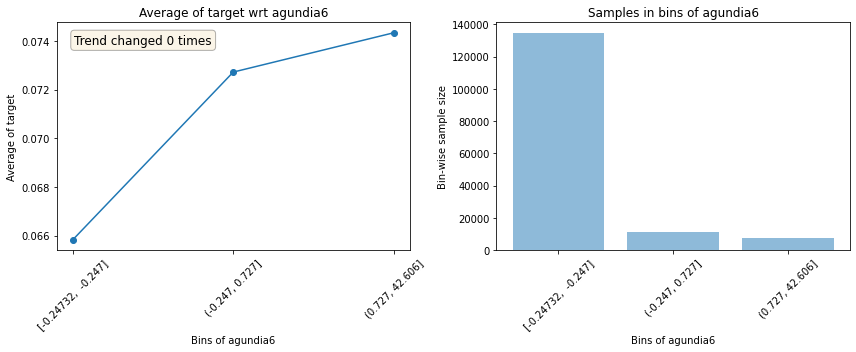

--------------------------------------------------------------------------------------------------------------


                                          Plots for pagagusi                                          


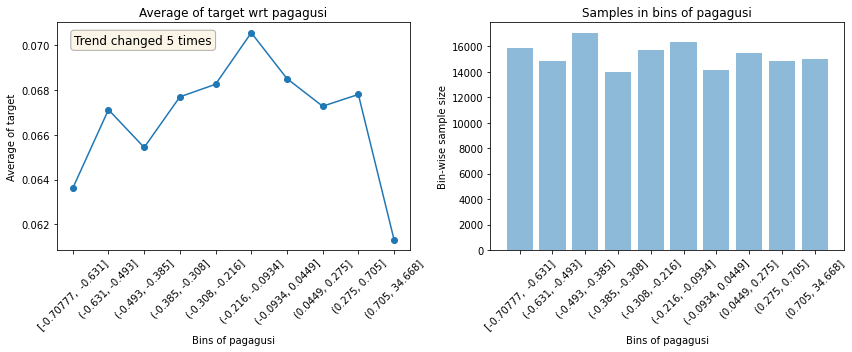

--------------------------------------------------------------------------------------------------------------


                                          Plots for pagaguno                                          


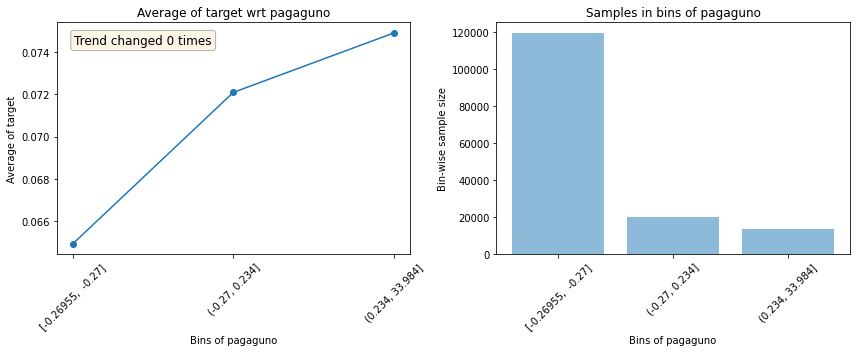

--------------------------------------------------------------------------------------------------------------


                                          Plots for pagagu1                                           


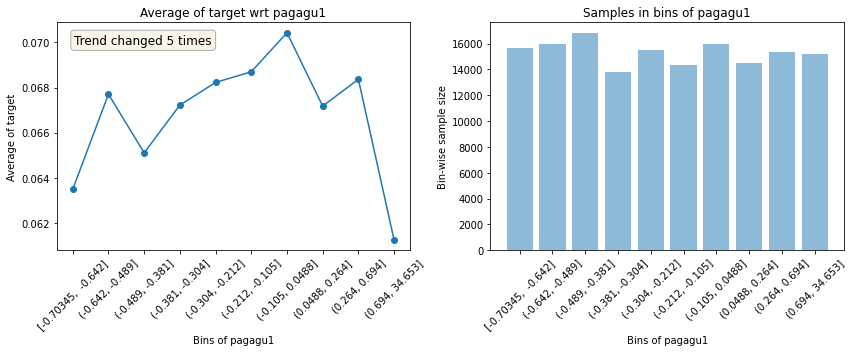

--------------------------------------------------------------------------------------------------------------


                                          Plots for pagagu2                                           


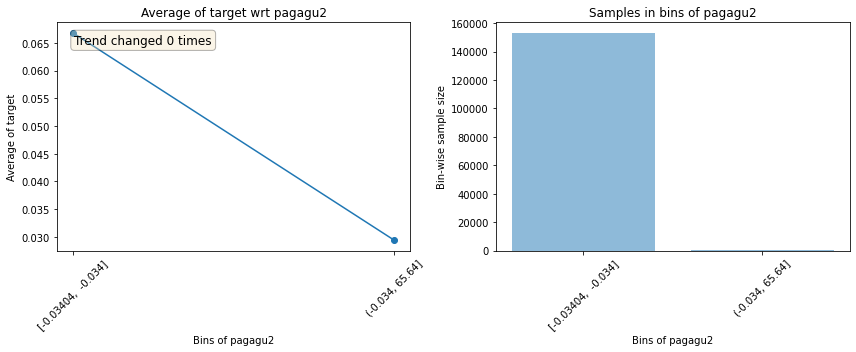

--------------------------------------------------------------------------------------------------------------


                                          Plots for pagagu3                                           


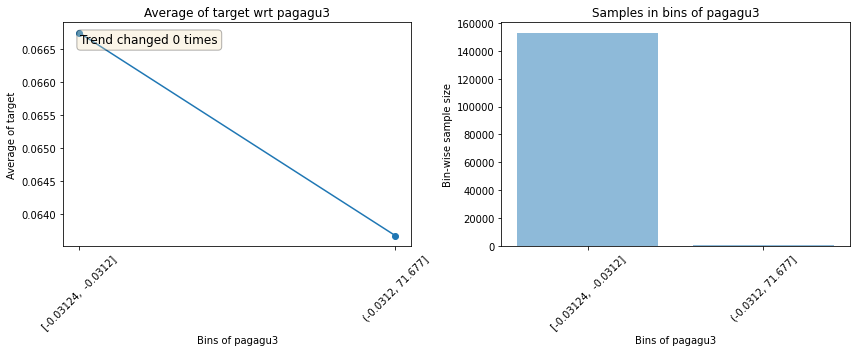

--------------------------------------------------------------------------------------------------------------


                                          Plots for pagagu4                                           


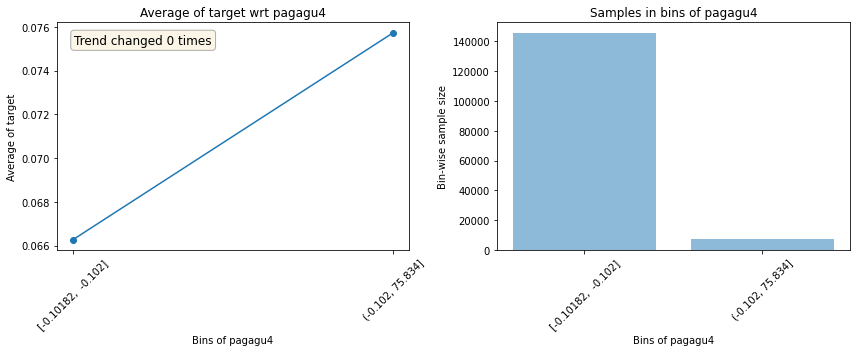

--------------------------------------------------------------------------------------------------------------


                                          Plots for pagagu5                                           


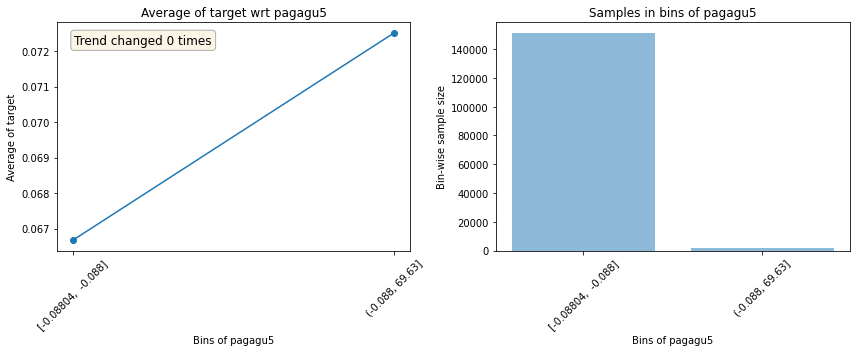

--------------------------------------------------------------------------------------------------------------


                                            Plots for hig1                                            


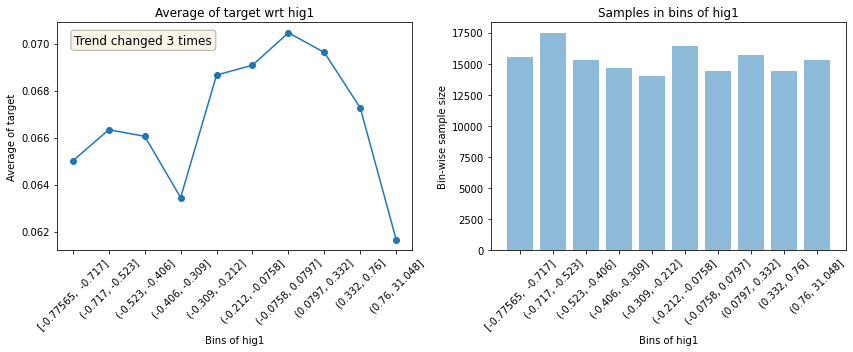

--------------------------------------------------------------------------------------------------------------


                                            Plots for hig2                                            


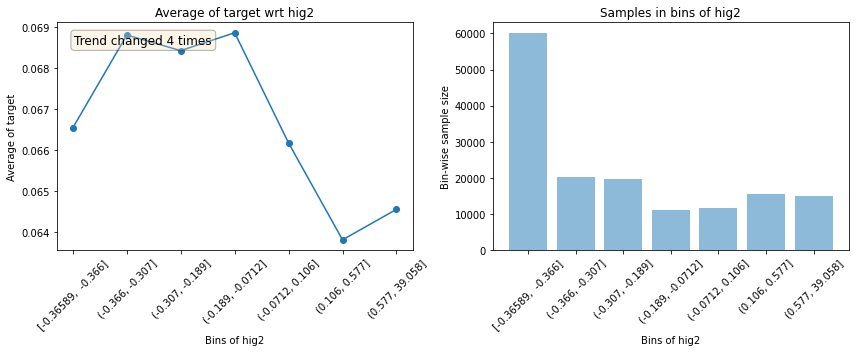

--------------------------------------------------------------------------------------------------------------


                                            Plots for hig3                                            


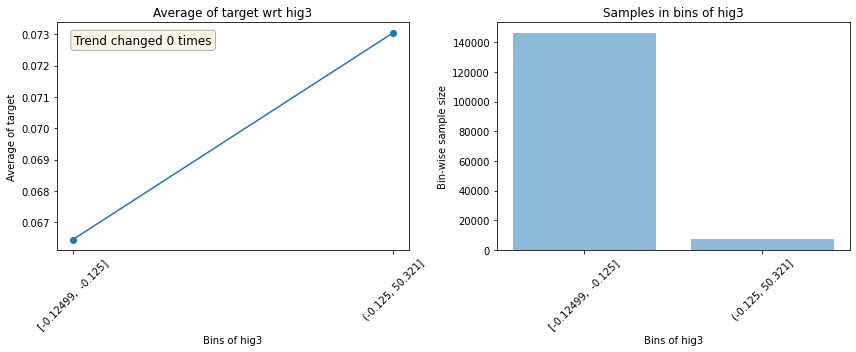

--------------------------------------------------------------------------------------------------------------


                                            Plots for hig4                                            


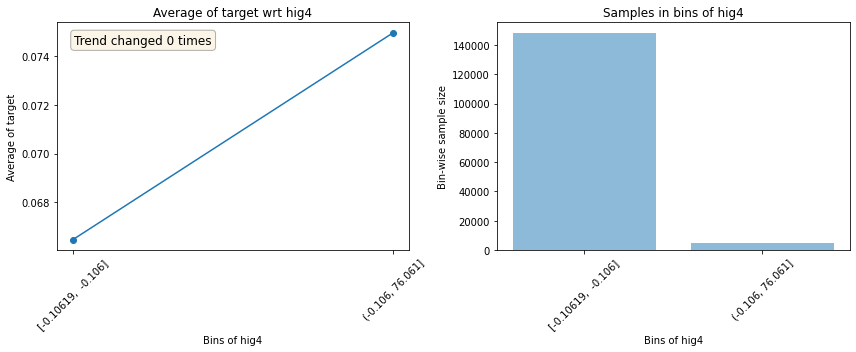

--------------------------------------------------------------------------------------------------------------


                                            Plots for hig5                                            


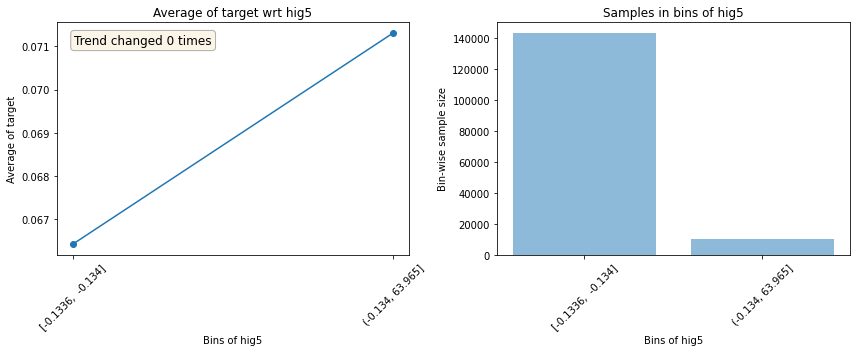

--------------------------------------------------------------------------------------------------------------


                                            Plots for hig6                                            


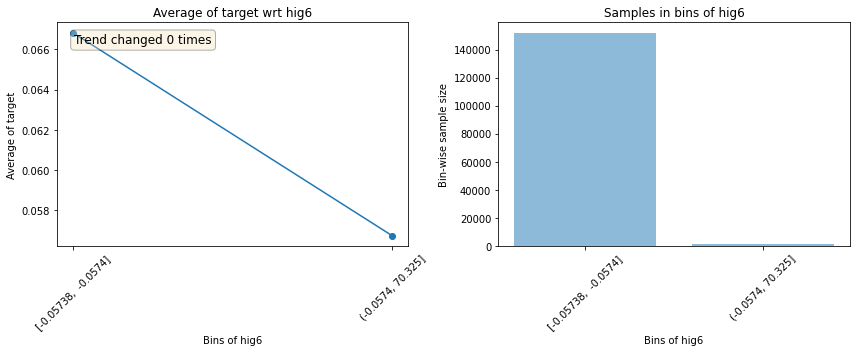

--------------------------------------------------------------------------------------------------------------


                                            Plots for hig7                                            


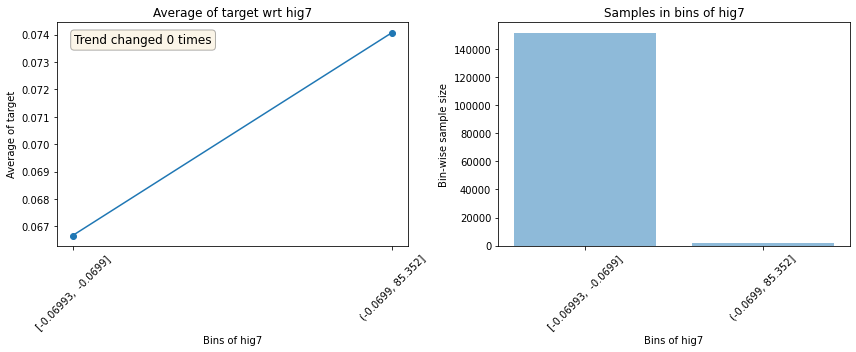

--------------------------------------------------------------------------------------------------------------


                                            Plots for hig8                                            


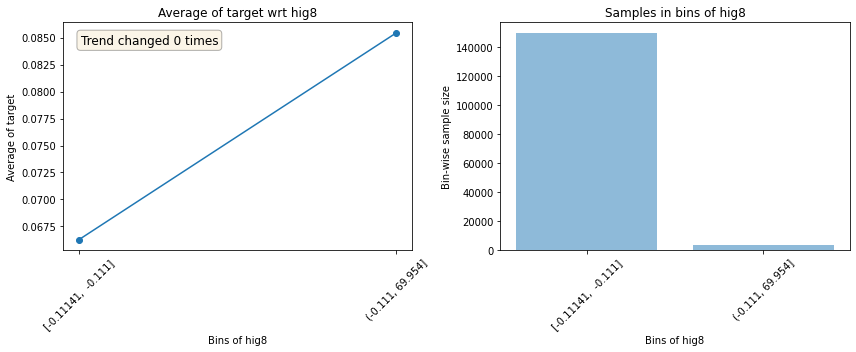

--------------------------------------------------------------------------------------------------------------


                                          Plots for alupusi                                           


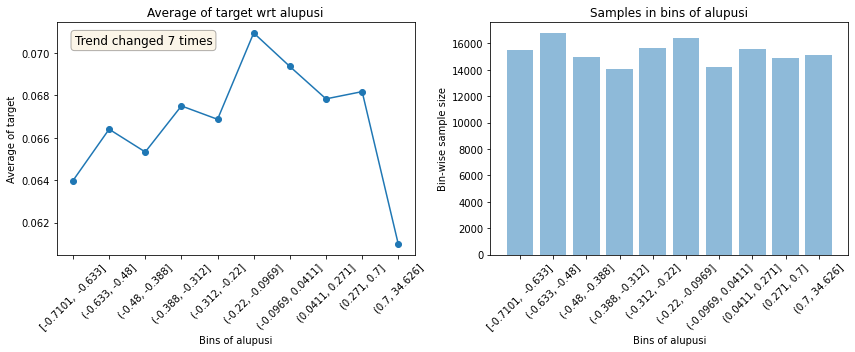

--------------------------------------------------------------------------------------------------------------


                                          Plots for alupuno                                           


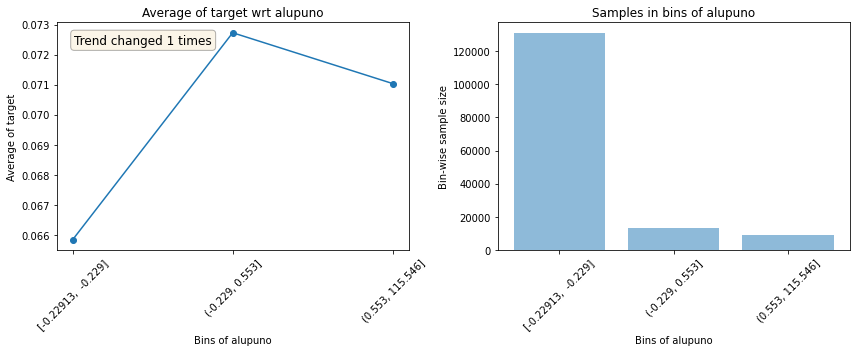

--------------------------------------------------------------------------------------------------------------


                                          Plots for equiten                                           


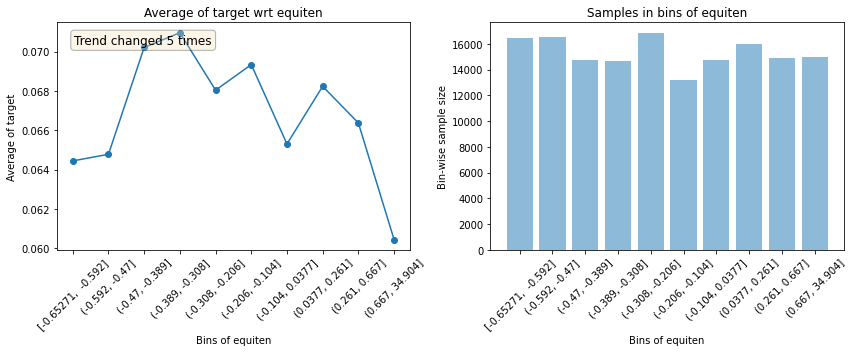

--------------------------------------------------------------------------------------------------------------


                                          Plots for equiteno                                          


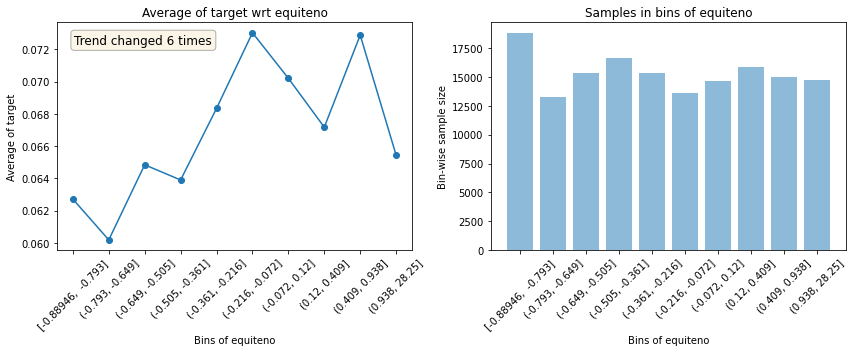

--------------------------------------------------------------------------------------------------------------


                                           Plots for tvten                                            


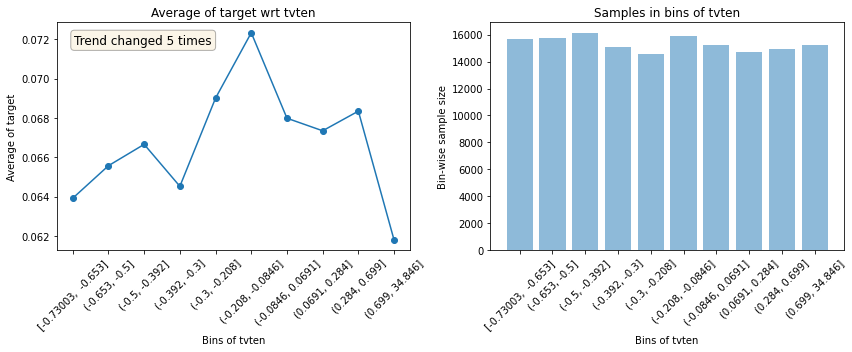

--------------------------------------------------------------------------------------------------------------


                                           Plots for tvteno                                           


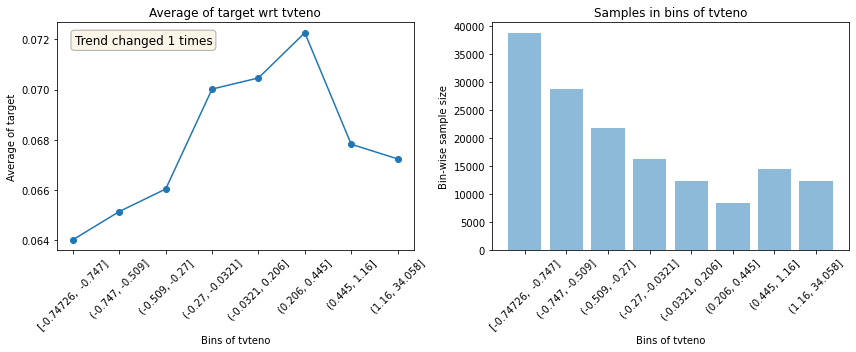

--------------------------------------------------------------------------------------------------------------


                                           Plots for cocten                                           


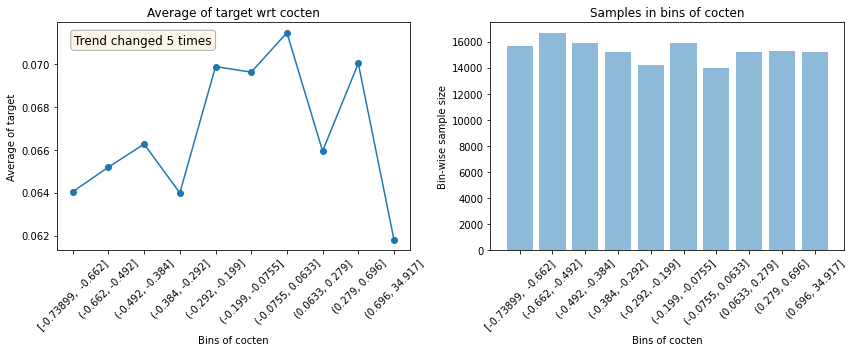

--------------------------------------------------------------------------------------------------------------


                                          Plots for cocteno                                           


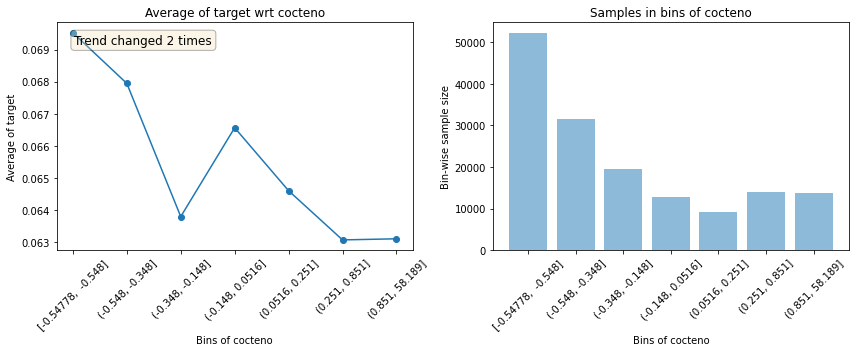

--------------------------------------------------------------------------------------------------------------


                                           Plots for reften                                           


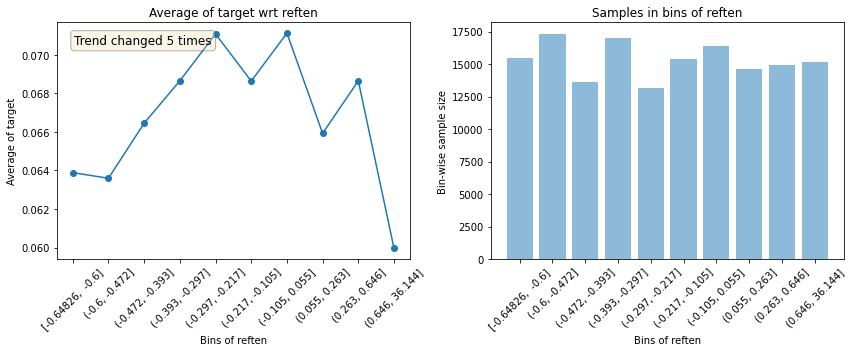

--------------------------------------------------------------------------------------------------------------


                                          Plots for refteno                                           


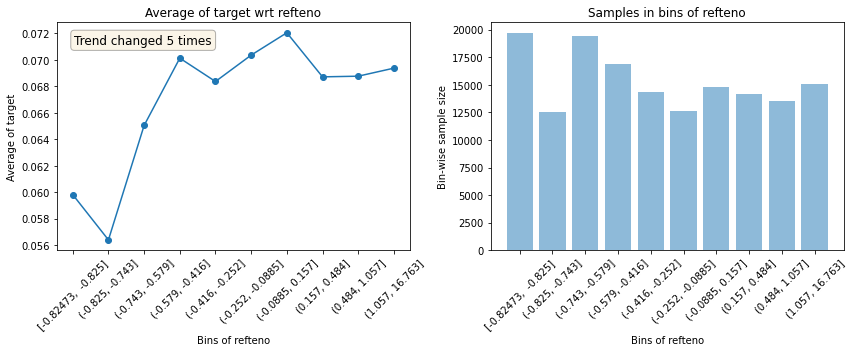

--------------------------------------------------------------------------------------------------------------


                                           Plots for lavten                                           


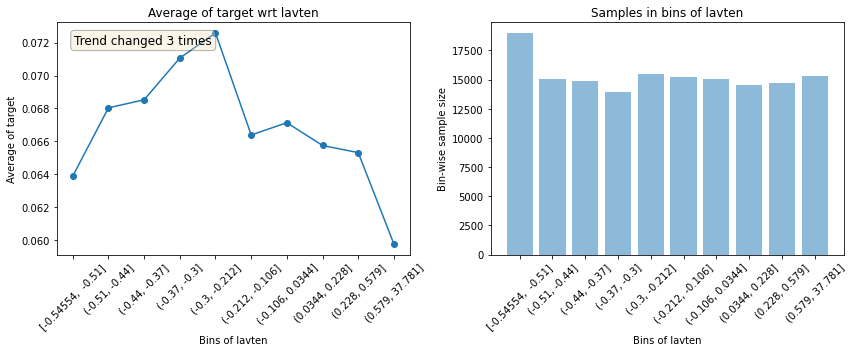

--------------------------------------------------------------------------------------------------------------


                                          Plots for lavteno                                           


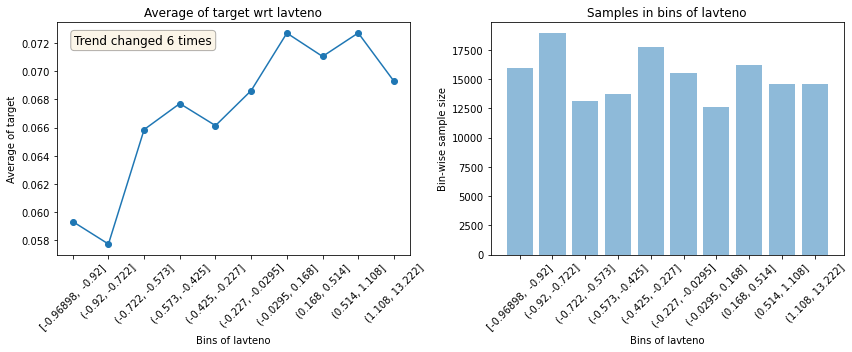

--------------------------------------------------------------------------------------------------------------


                                           Plots for horten                                           


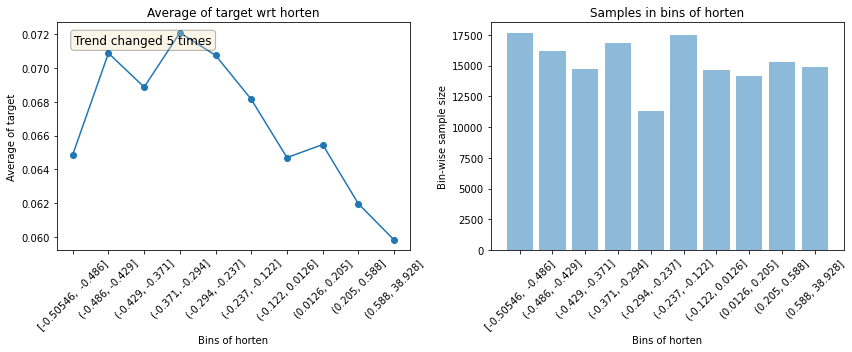

--------------------------------------------------------------------------------------------------------------


                                          Plots for horteno                                           


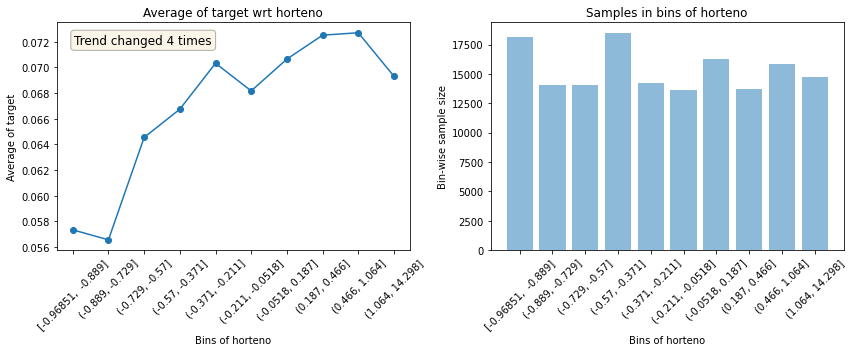

--------------------------------------------------------------------------------------------------------------


                                           Plots for licten                                           


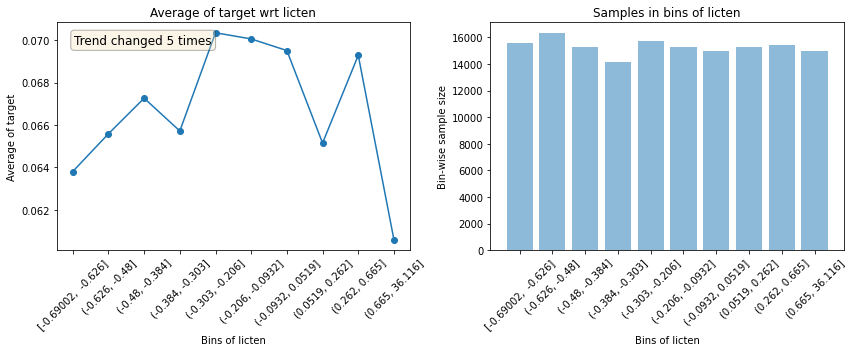

--------------------------------------------------------------------------------------------------------------


                                          Plots for licteno                                           


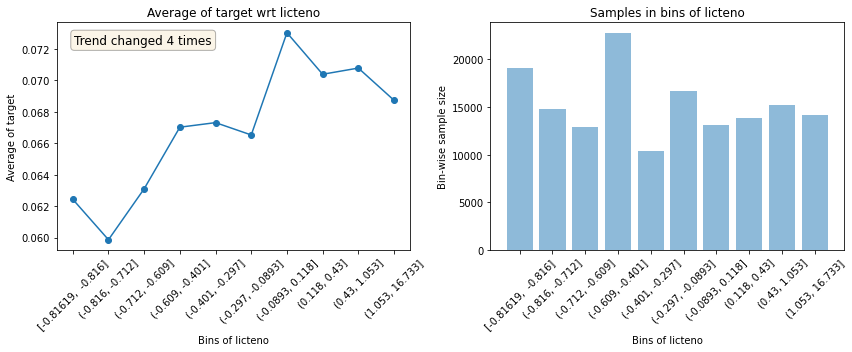

--------------------------------------------------------------------------------------------------------------


                                           Plots for platen                                           


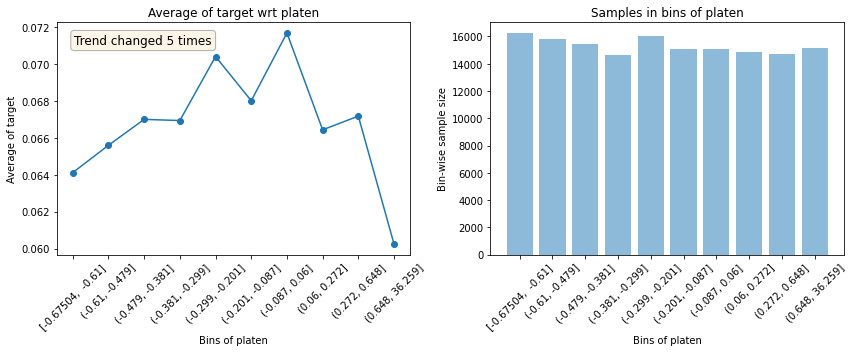

--------------------------------------------------------------------------------------------------------------


                                          Plots for plateno                                           


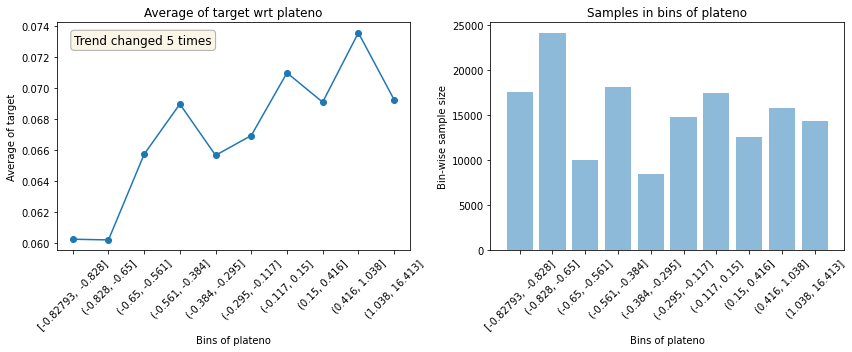

--------------------------------------------------------------------------------------------------------------


                                          Plots for compten                                           


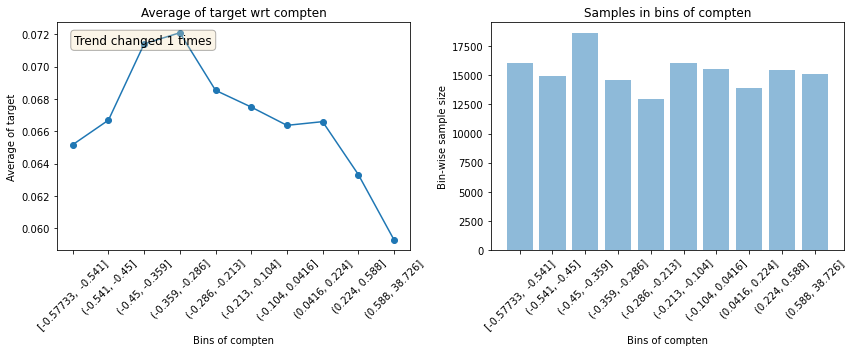

--------------------------------------------------------------------------------------------------------------


                                          Plots for compteno                                          


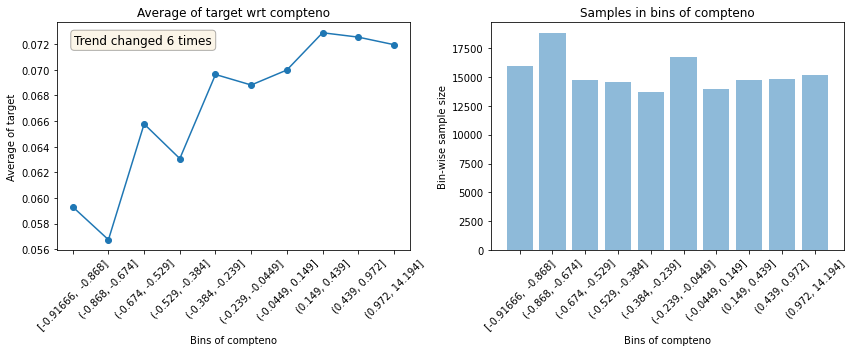

--------------------------------------------------------------------------------------------------------------


                                           Plots for celten                                           


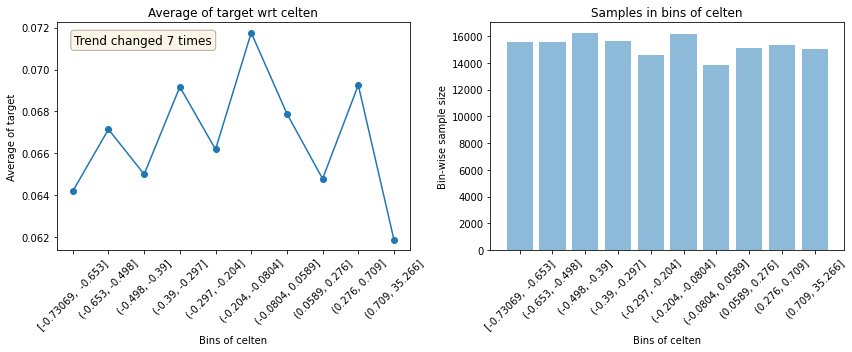

--------------------------------------------------------------------------------------------------------------


                                          Plots for celteno                                           


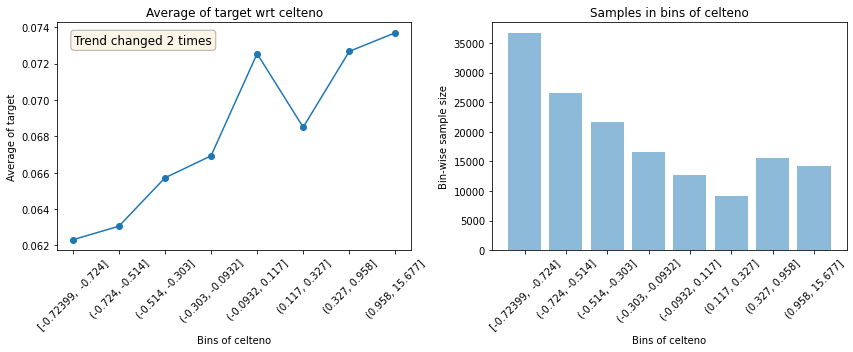

--------------------------------------------------------------------------------------------------------------


                                          Plots for tefijten                                          


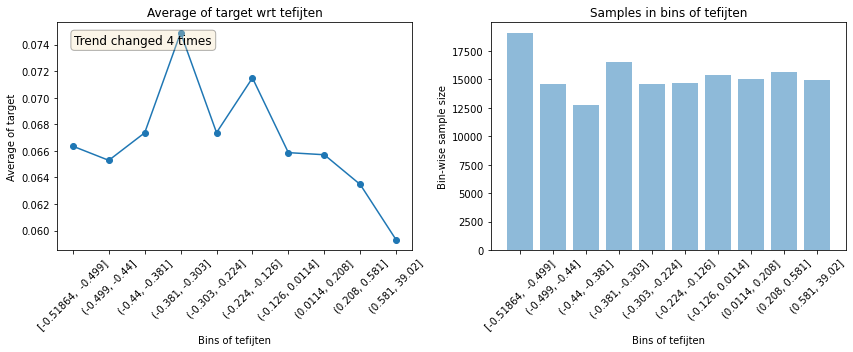

--------------------------------------------------------------------------------------------------------------


                                         Plots for tefijteno                                          


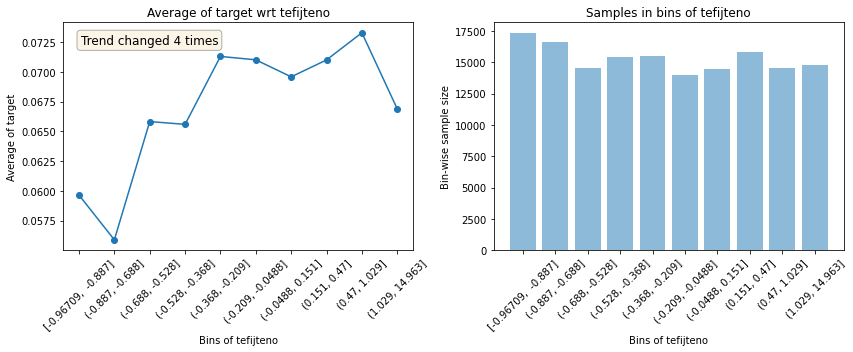

--------------------------------------------------------------------------------------------------------------


                                           Plots for cabten                                           


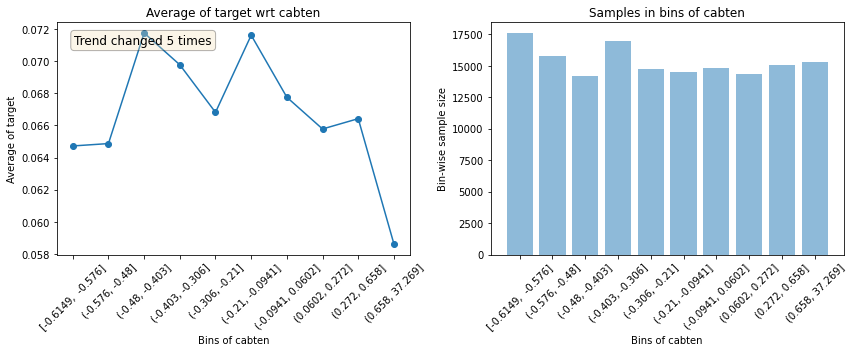

--------------------------------------------------------------------------------------------------------------


                                          Plots for cabteno                                           


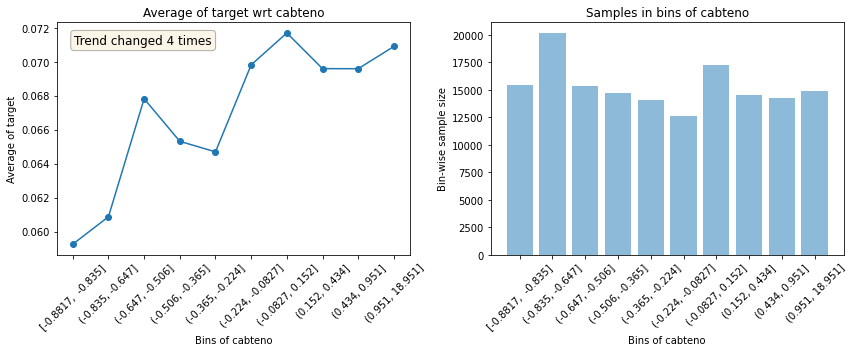

--------------------------------------------------------------------------------------------------------------


                                           Plots for intten                                           


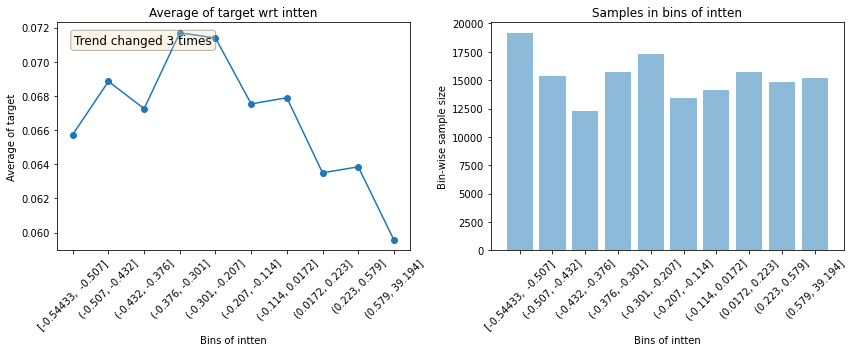

--------------------------------------------------------------------------------------------------------------


                                          Plots for intteno                                           


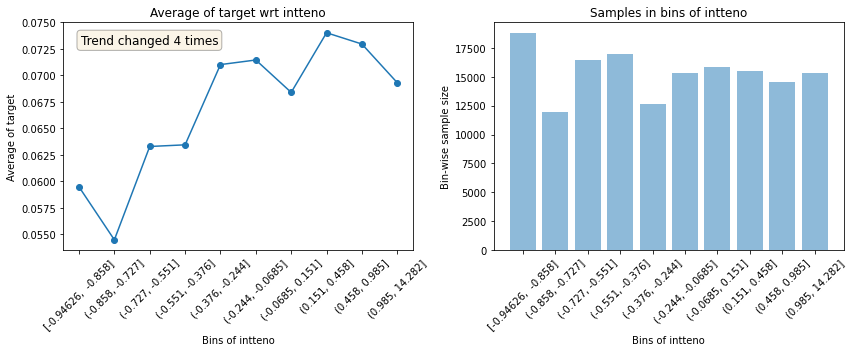

--------------------------------------------------------------------------------------------------------------


                                           Plots for autten                                           


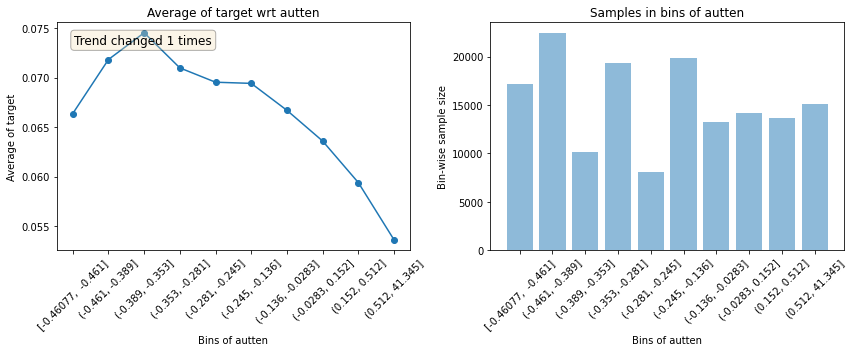

--------------------------------------------------------------------------------------------------------------


                                          Plots for autteno                                           


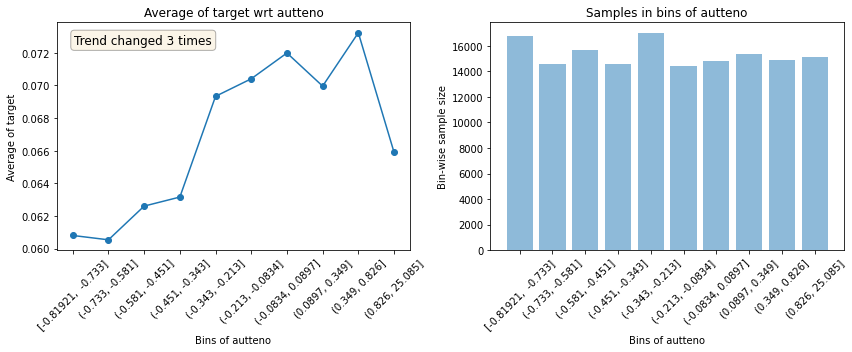

--------------------------------------------------------------------------------------------------------------


                                           Plots for motten                                           


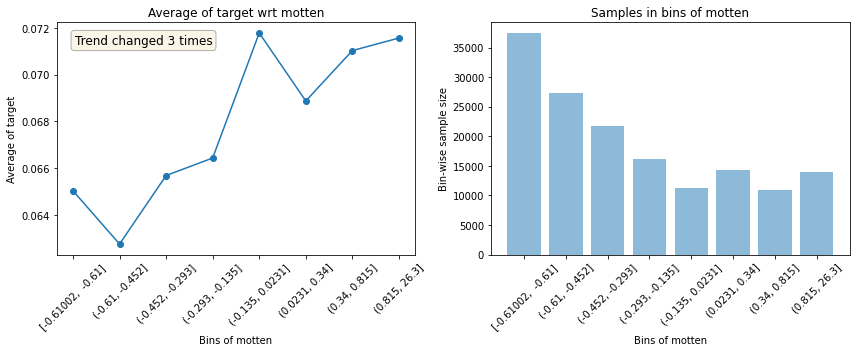

--------------------------------------------------------------------------------------------------------------


                                          Plots for motteno                                           


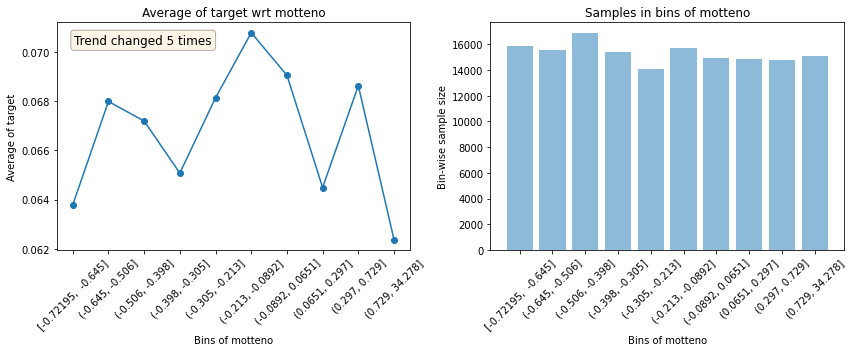

--------------------------------------------------------------------------------------------------------------


                                           Plots for lanten                                           


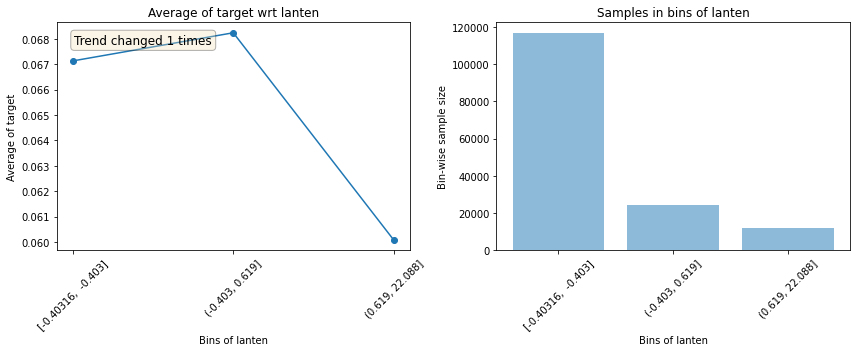

--------------------------------------------------------------------------------------------------------------


                                          Plots for lanteno                                           


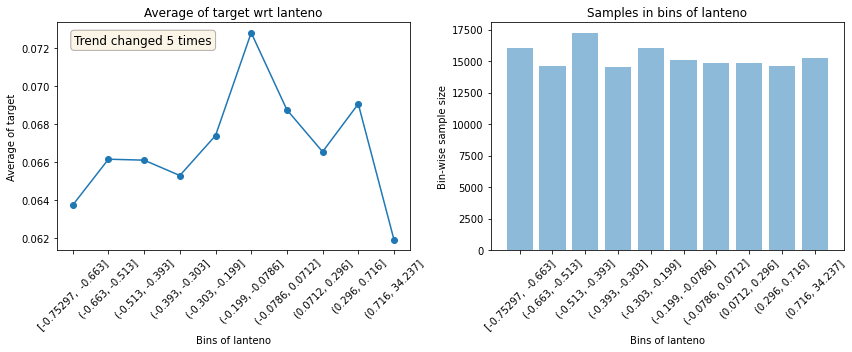

--------------------------------------------------------------------------------------------------------------


                                            Plots for inf                                             


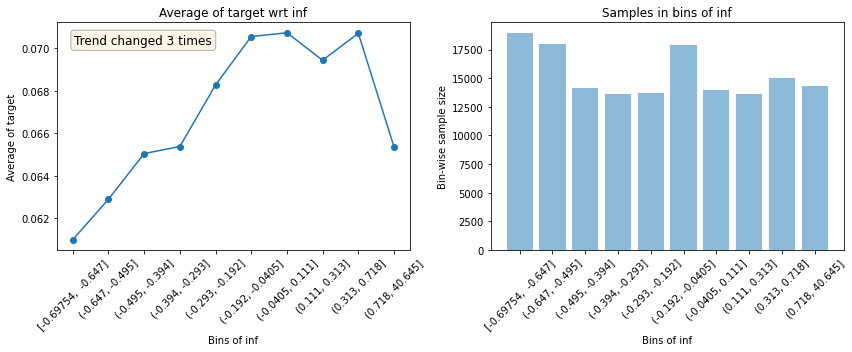

--------------------------------------------------------------------------------------------------------------


                                            Plots for nin                                             


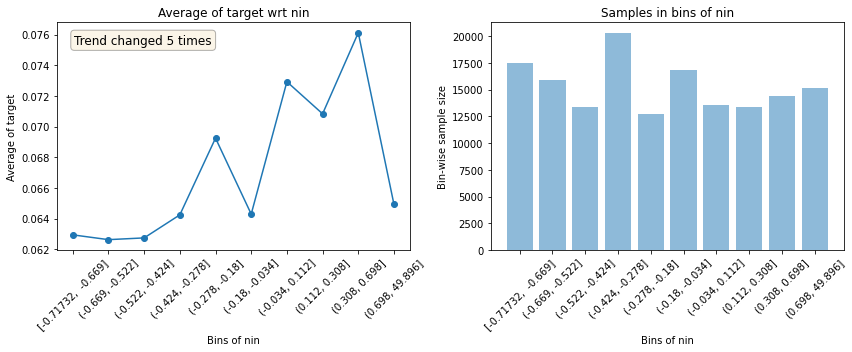

--------------------------------------------------------------------------------------------------------------


                                            Plots for ado                                             


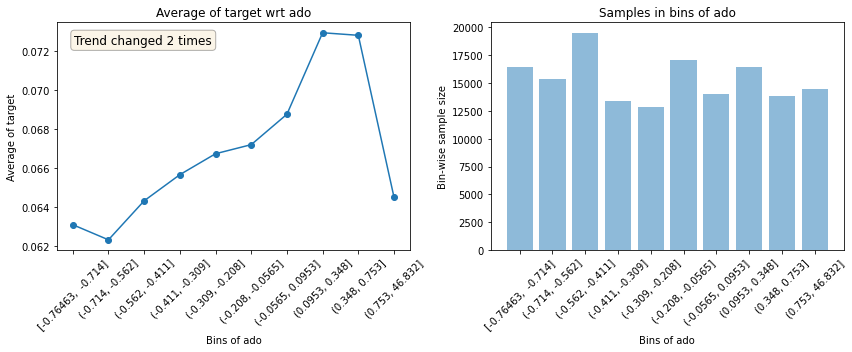

--------------------------------------------------------------------------------------------------------------


                                            Plots for jov                                             


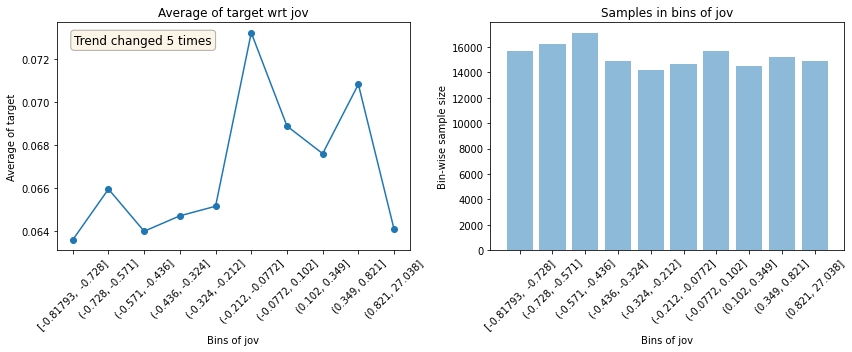

--------------------------------------------------------------------------------------------------------------


                                           Plots for adujov                                           


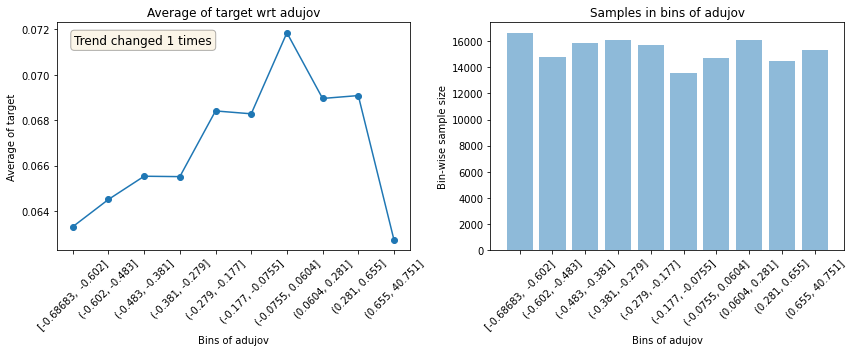

--------------------------------------------------------------------------------------------------------------


                                            Plots for adu                                             


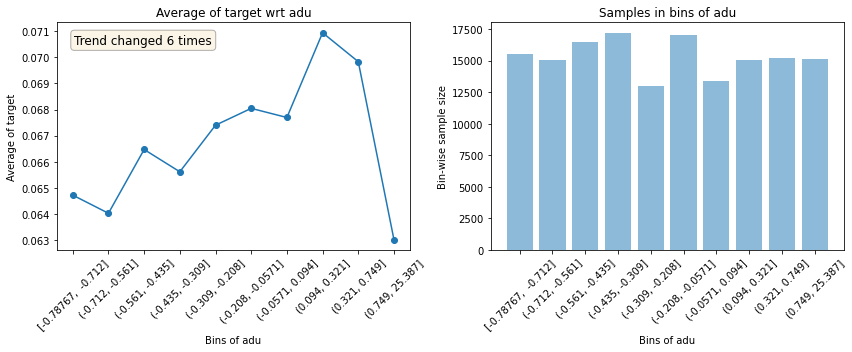

--------------------------------------------------------------------------------------------------------------


                                           Plots for adumay                                           


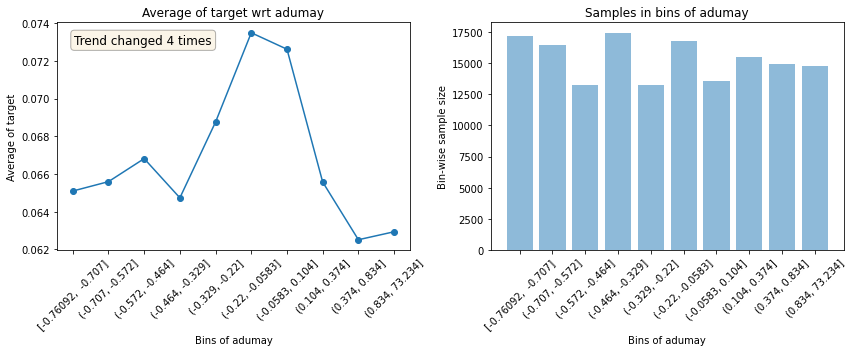

--------------------------------------------------------------------------------------------------------------


                                         Plots for pafisis_no                                         


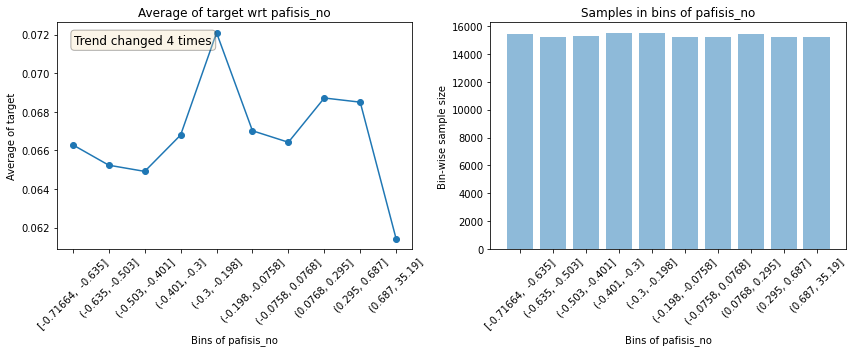

--------------------------------------------------------------------------------------------------------------


                                          Plots for pafisis                                           


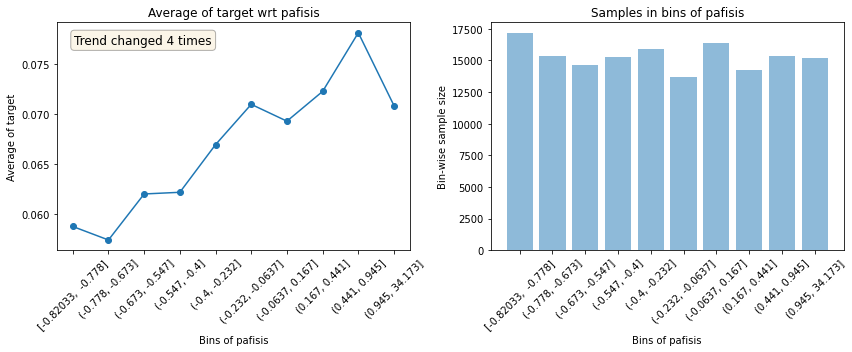

--------------------------------------------------------------------------------------------------------------


                                          Plots for paess_no                                          


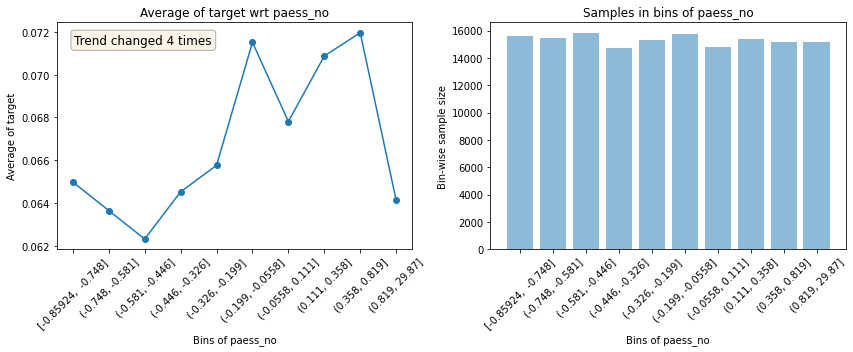

--------------------------------------------------------------------------------------------------------------


                                           Plots for paess                                            


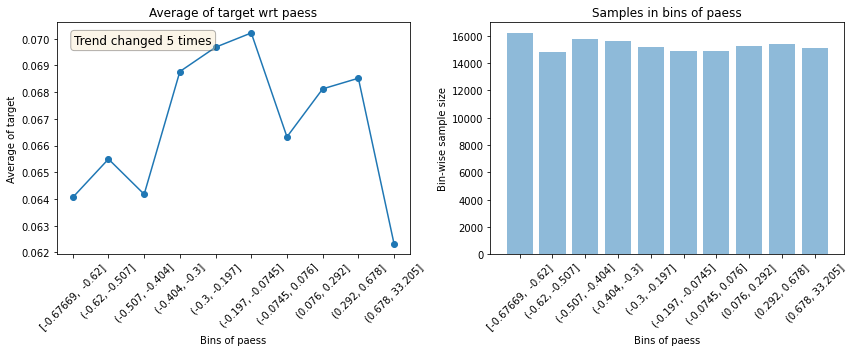

--------------------------------------------------------------------------------------------------------------


                                          Plots for pafue_no                                          


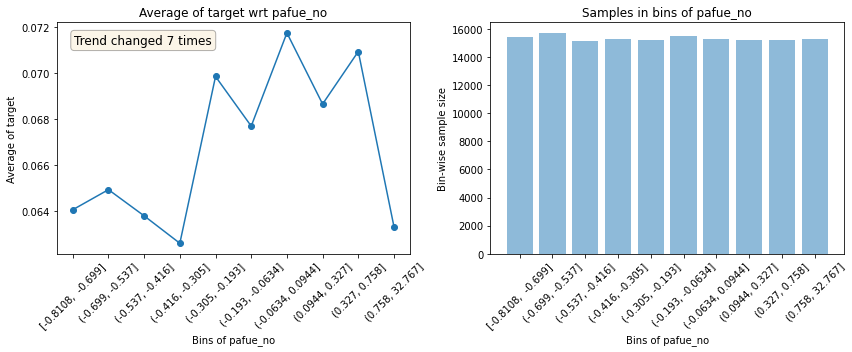

--------------------------------------------------------------------------------------------------------------


                                           Plots for pafue                                            


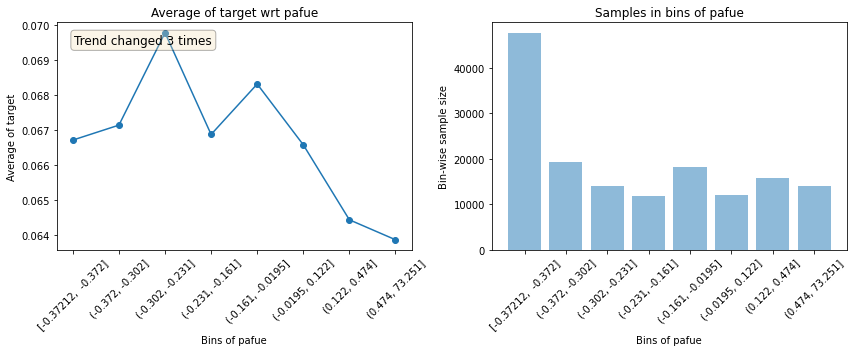

--------------------------------------------------------------------------------------------------------------


                                          Plots for papri_no                                          


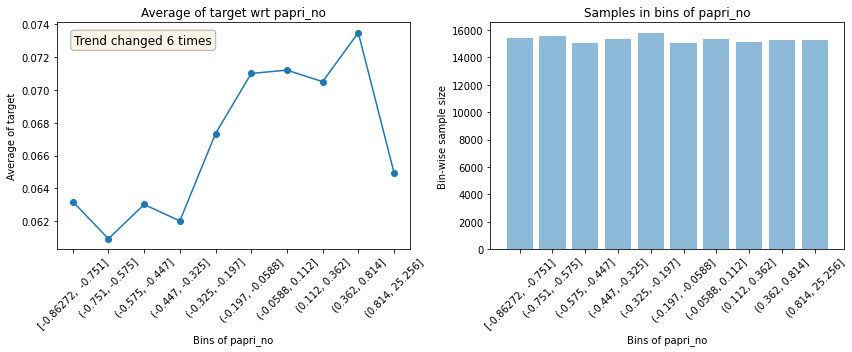

--------------------------------------------------------------------------------------------------------------


                                           Plots for papri                                            


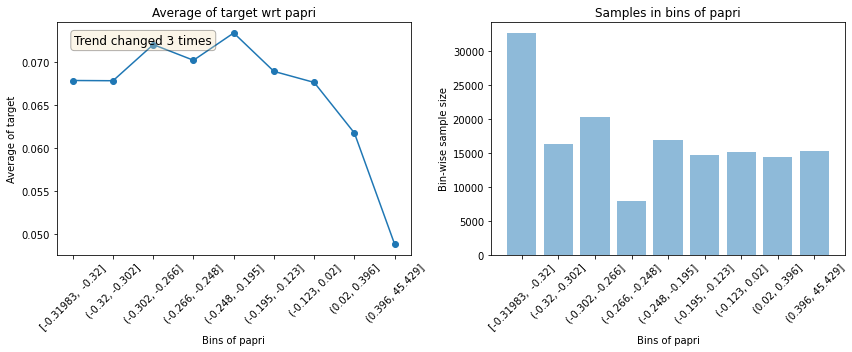

--------------------------------------------------------------------------------------------------------------


                                          Plots for paotr_no                                          


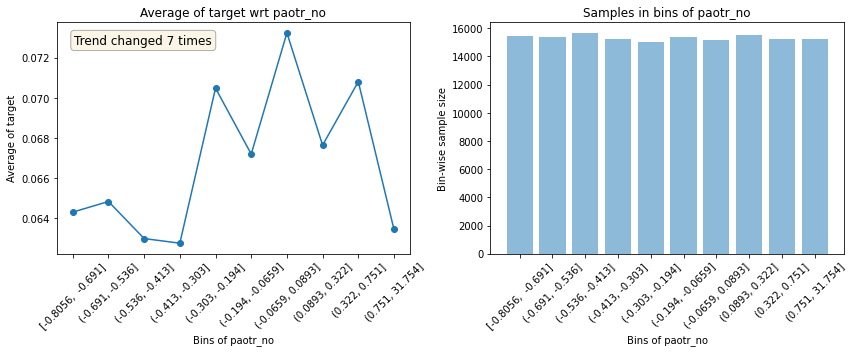

--------------------------------------------------------------------------------------------------------------


                                           Plots for paotr                                            


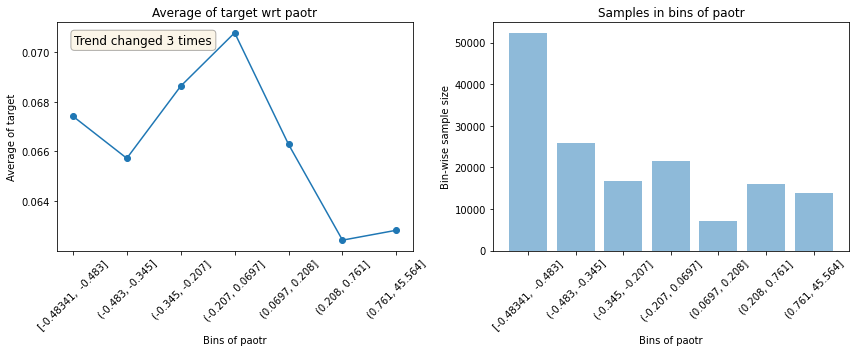

--------------------------------------------------------------------------------------------------------------


                                          Plots for panin_no                                          


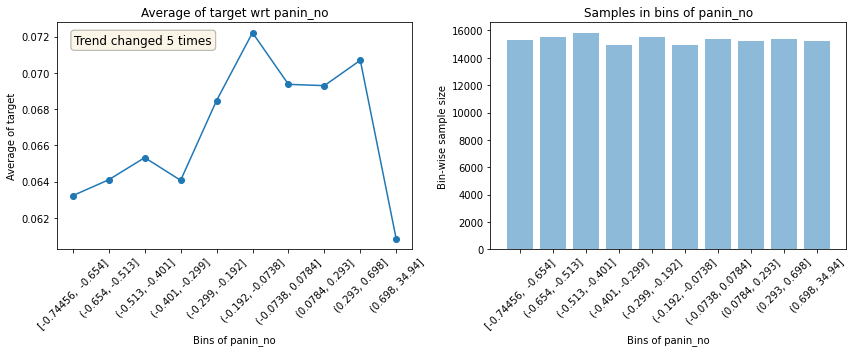

--------------------------------------------------------------------------------------------------------------


                                           Plots for panin                                            


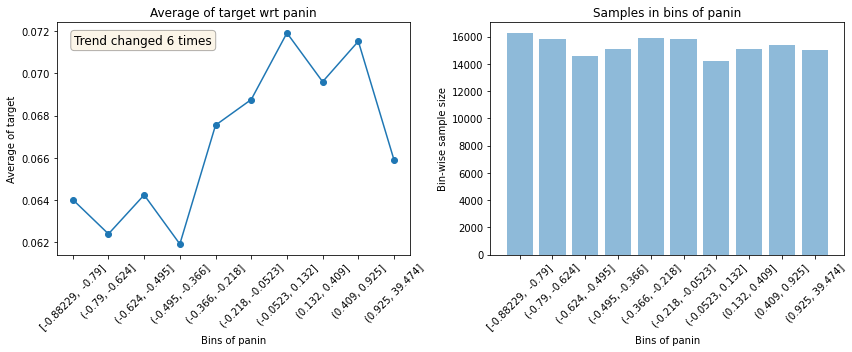

--------------------------------------------------------------------------------------------------------------


                                           Plots for lee_si                                           


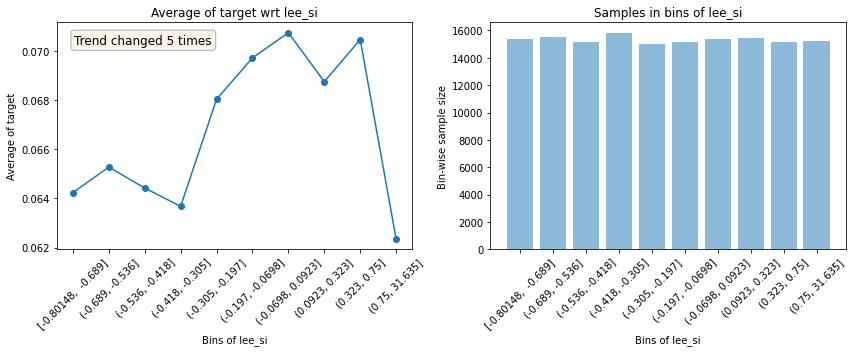

--------------------------------------------------------------------------------------------------------------


                                           Plots for lee_no                                           


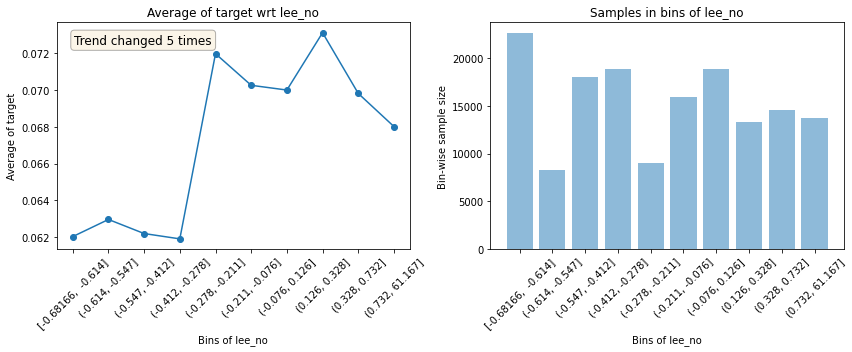

--------------------------------------------------------------------------------------------------------------


                                          Plots for estud_1                                           


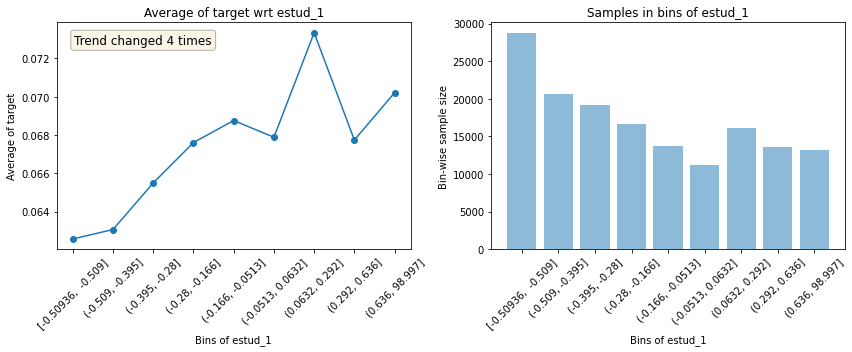

--------------------------------------------------------------------------------------------------------------


                                          Plots for estud_2                                           


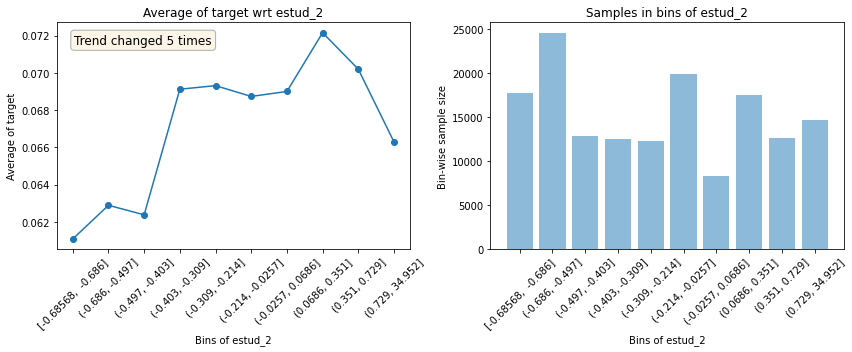

--------------------------------------------------------------------------------------------------------------


                                          Plots for estud_3                                           


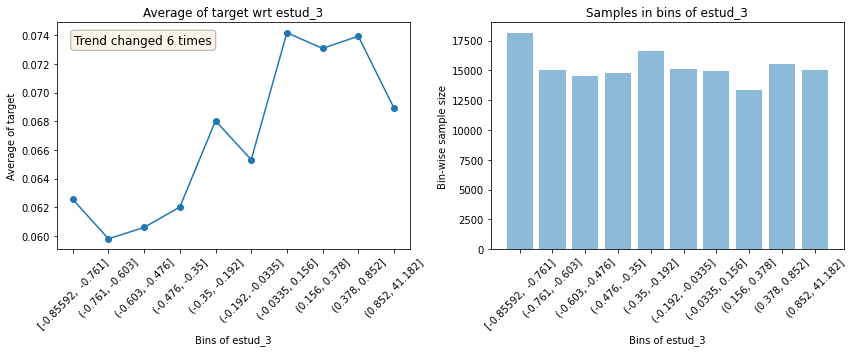

--------------------------------------------------------------------------------------------------------------


                                          Plots for estud_4                                           


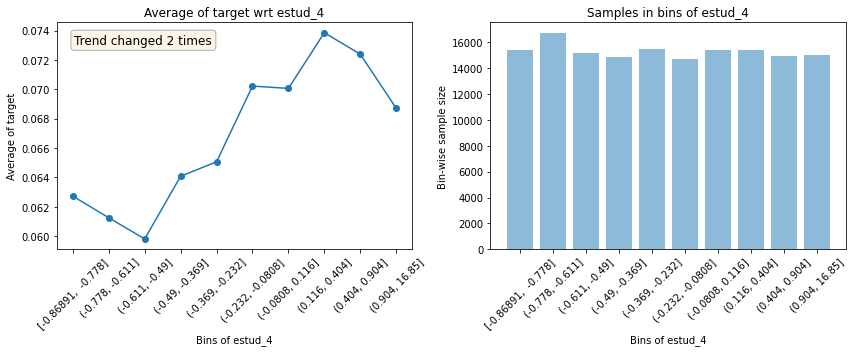

--------------------------------------------------------------------------------------------------------------


                                          Plots for estud_5                                           


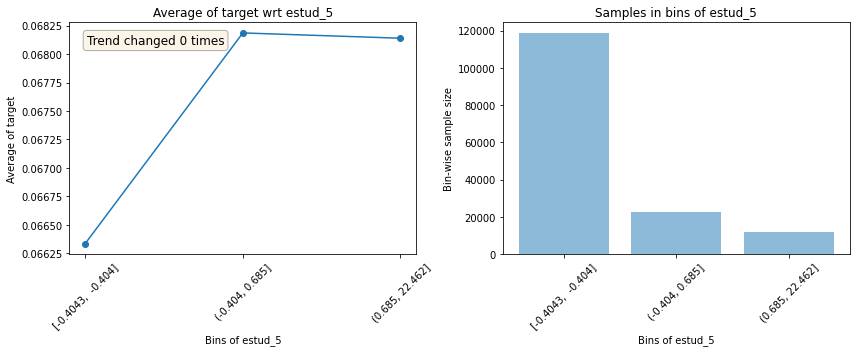

--------------------------------------------------------------------------------------------------------------


                                          Plots for estud_6                                           


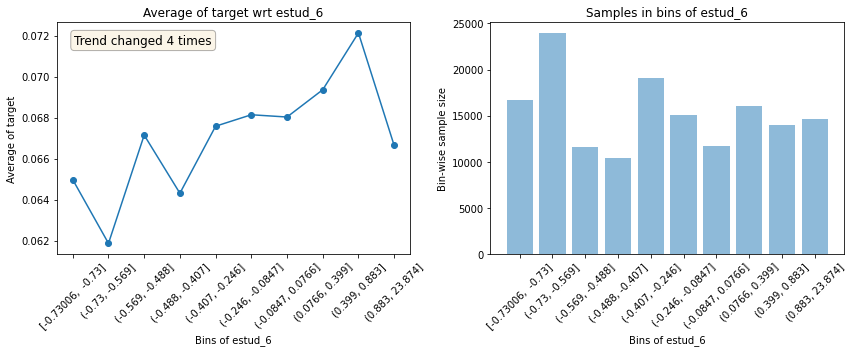

--------------------------------------------------------------------------------------------------------------


                                          Plots for estud_7                                           


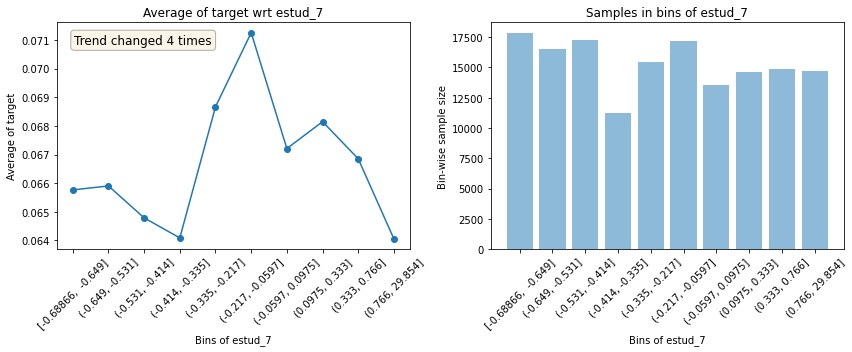

--------------------------------------------------------------------------------------------------------------


                                          Plots for estud_8                                           


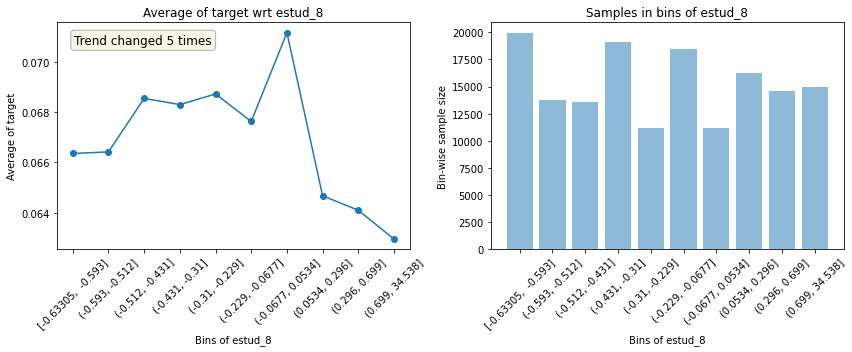

--------------------------------------------------------------------------------------------------------------


                                          Plots for estud_9                                           


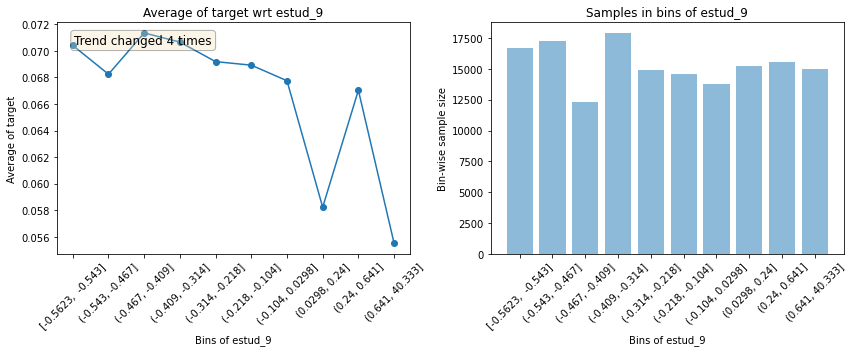

--------------------------------------------------------------------------------------------------------------


                                          Plots for estud_10                                          


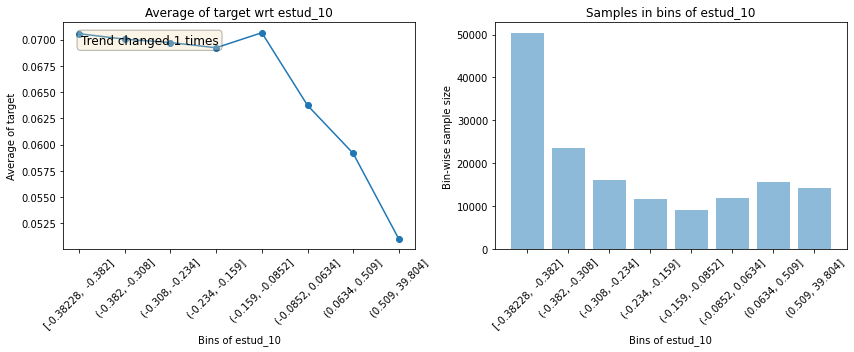

--------------------------------------------------------------------------------------------------------------


                                          Plots for profe_1                                           


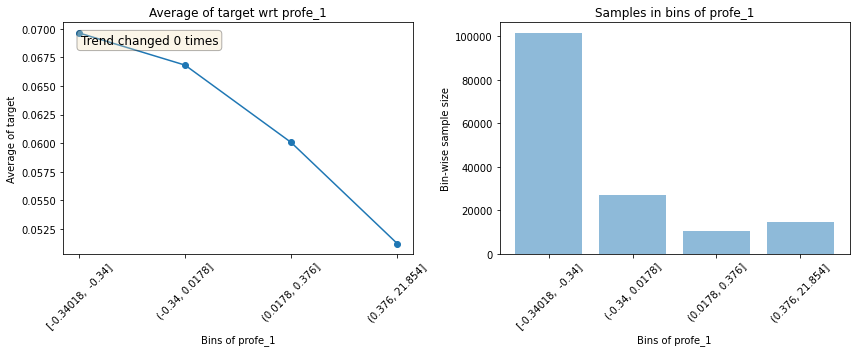

--------------------------------------------------------------------------------------------------------------


                                          Plots for profe_2                                           


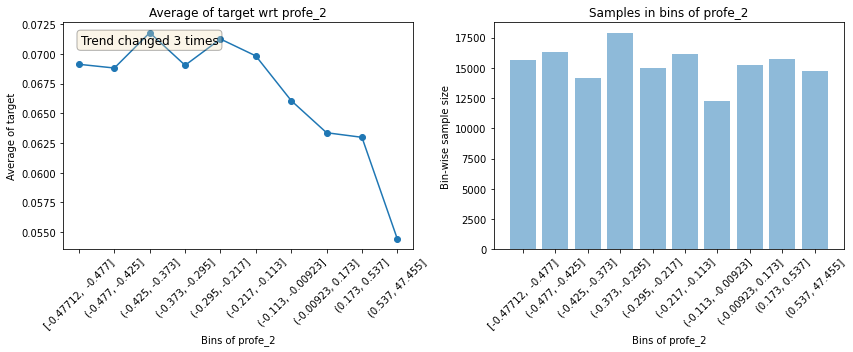

--------------------------------------------------------------------------------------------------------------


                                          Plots for profe_3                                           


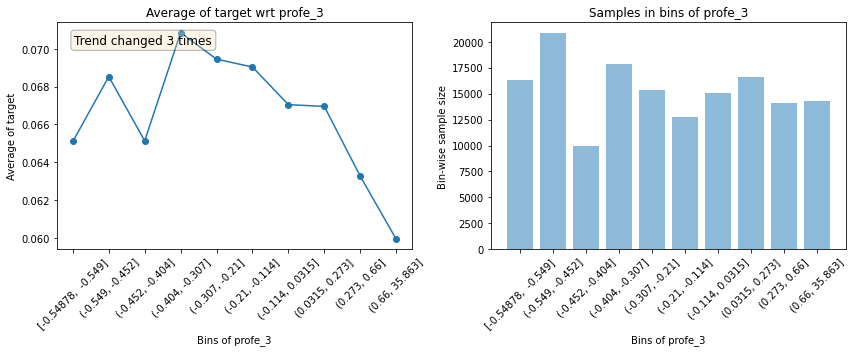

--------------------------------------------------------------------------------------------------------------


                                          Plots for profe_4                                           


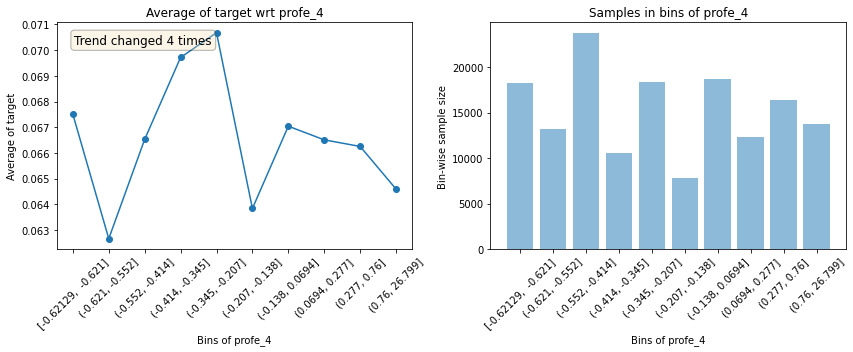

--------------------------------------------------------------------------------------------------------------


                                          Plots for profe_5                                           


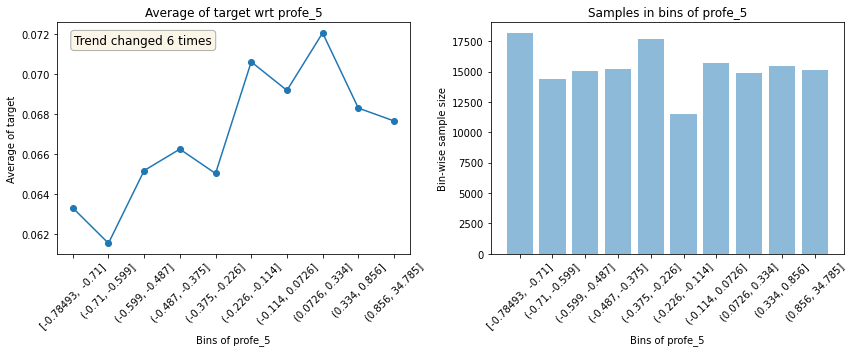

--------------------------------------------------------------------------------------------------------------


                                          Plots for profe_6                                           


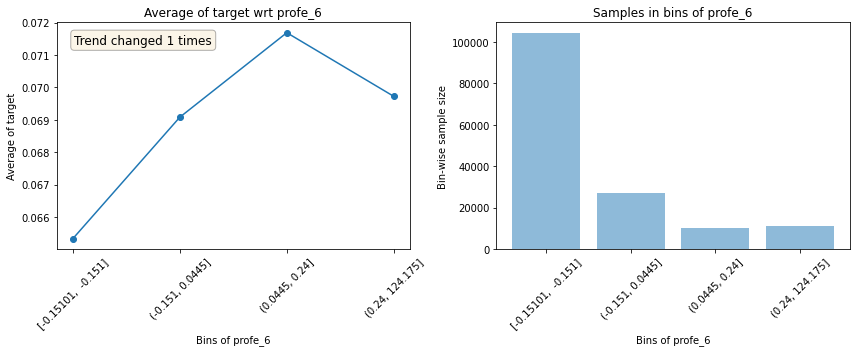

--------------------------------------------------------------------------------------------------------------


                                          Plots for profe_7                                           


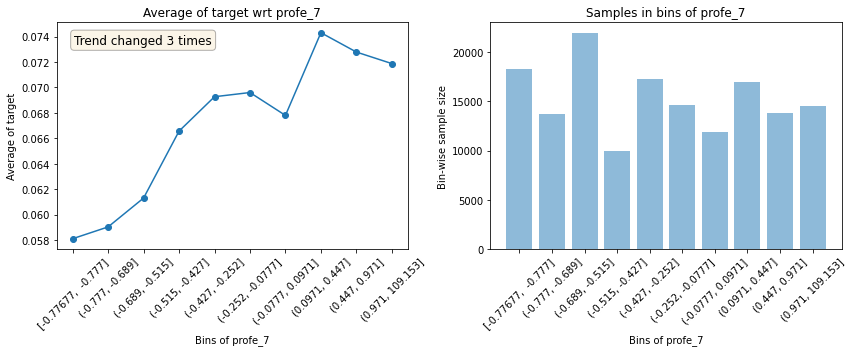

--------------------------------------------------------------------------------------------------------------


                                          Plots for profe_8                                           


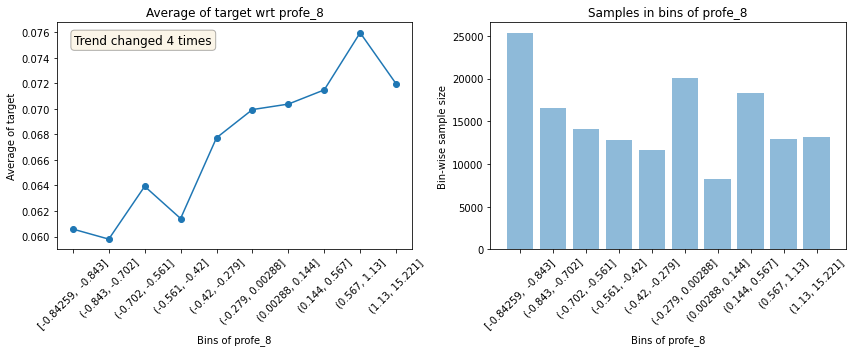

--------------------------------------------------------------------------------------------------------------


                                          Plots for profe_9                                           


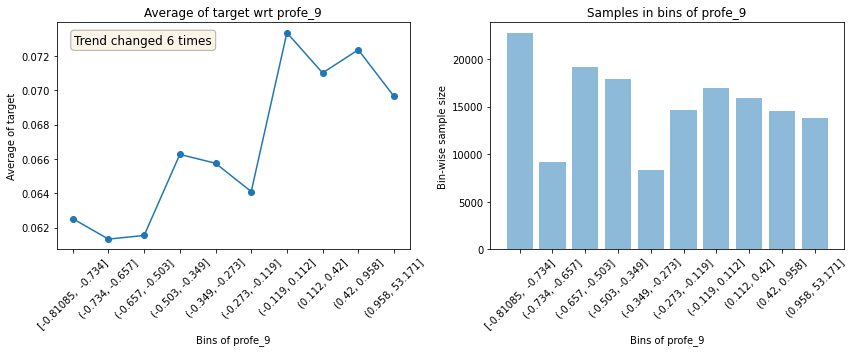

--------------------------------------------------------------------------------------------------------------


                                          Plots for profe_10                                          


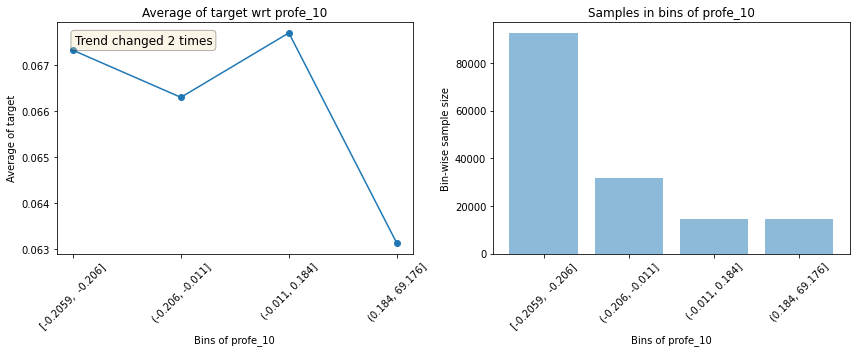

--------------------------------------------------------------------------------------------------------------


                                          Plots for acteco1                                           


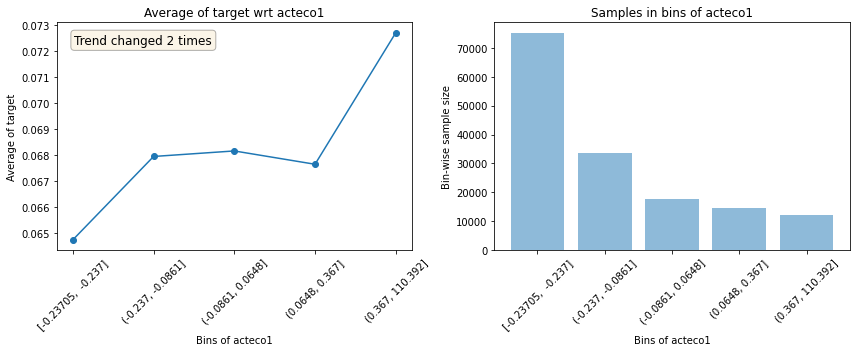

--------------------------------------------------------------------------------------------------------------


                                          Plots for acteco2                                           


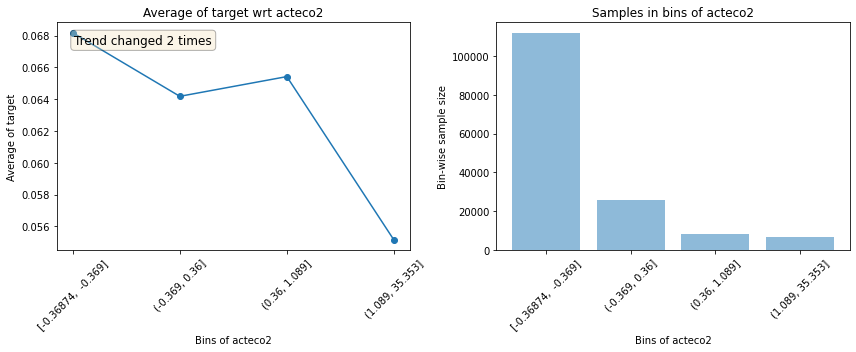

--------------------------------------------------------------------------------------------------------------


                                          Plots for acteco3                                           


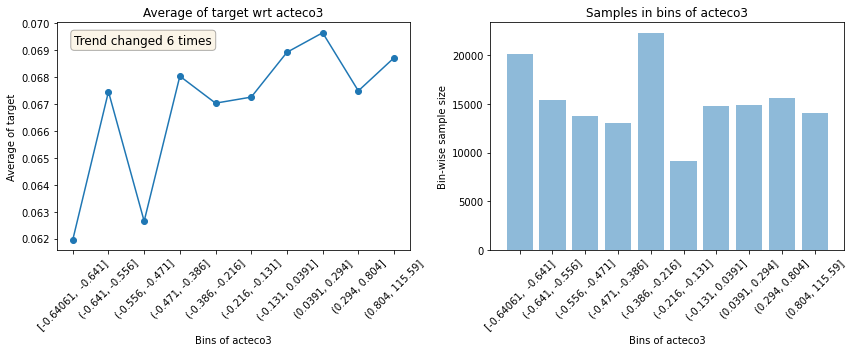

--------------------------------------------------------------------------------------------------------------


                                          Plots for acteco4                                           


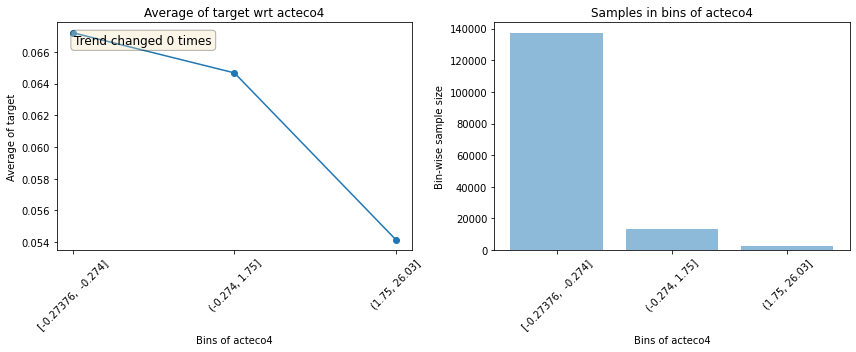

--------------------------------------------------------------------------------------------------------------


                                          Plots for acteco5                                           


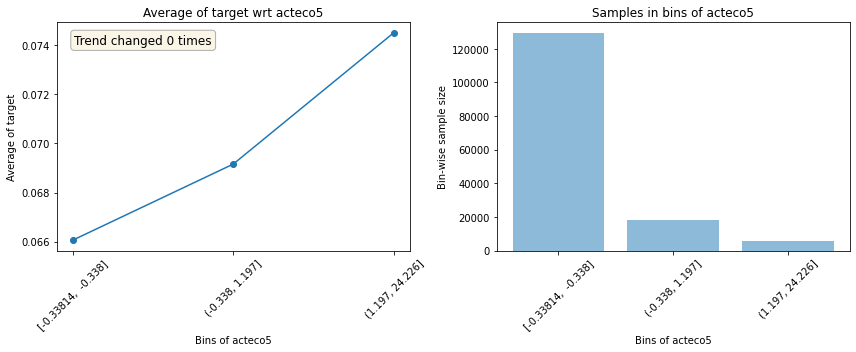

--------------------------------------------------------------------------------------------------------------


                                          Plots for acteco6                                           


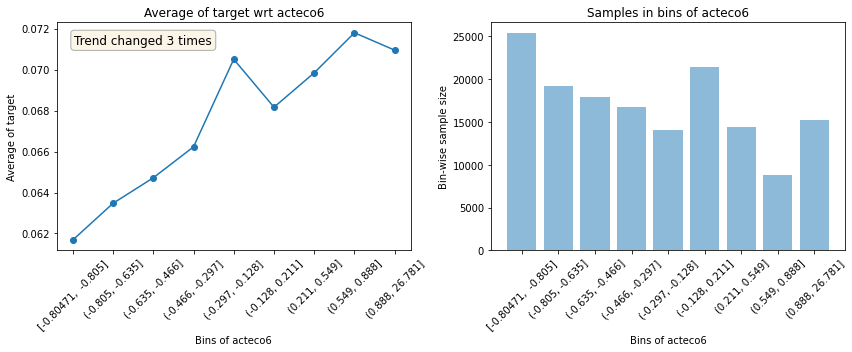

--------------------------------------------------------------------------------------------------------------


                                          Plots for acteco7                                           


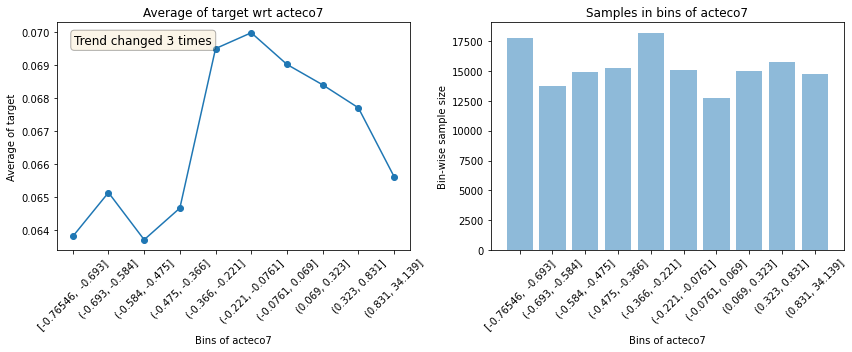

--------------------------------------------------------------------------------------------------------------


                                          Plots for acteco8                                           


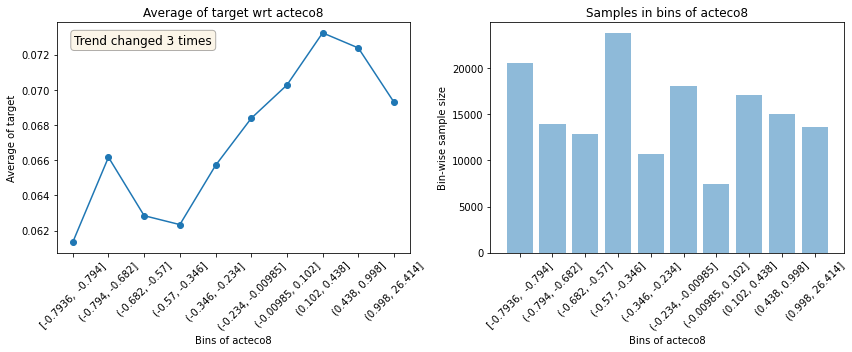

--------------------------------------------------------------------------------------------------------------


                                          Plots for acteco9                                           


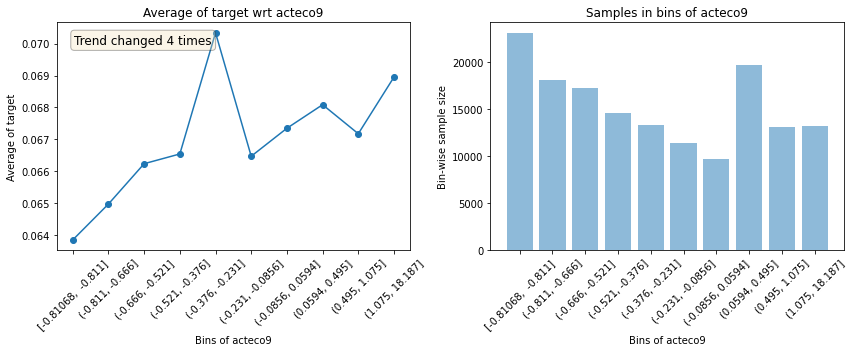

--------------------------------------------------------------------------------------------------------------


                                          Plots for acteco10                                          


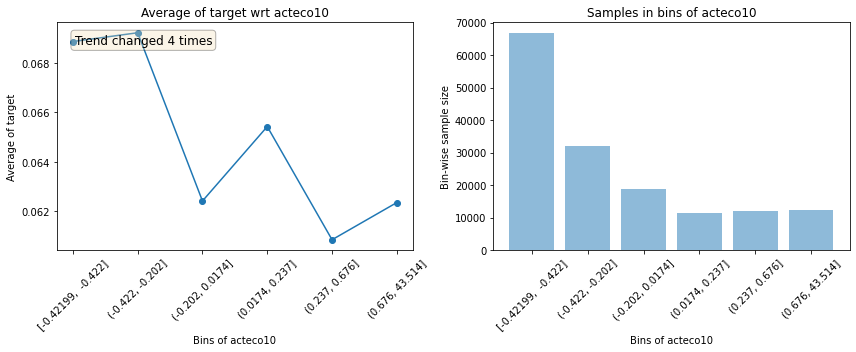

--------------------------------------------------------------------------------------------------------------


                                          Plots for acteco11                                          


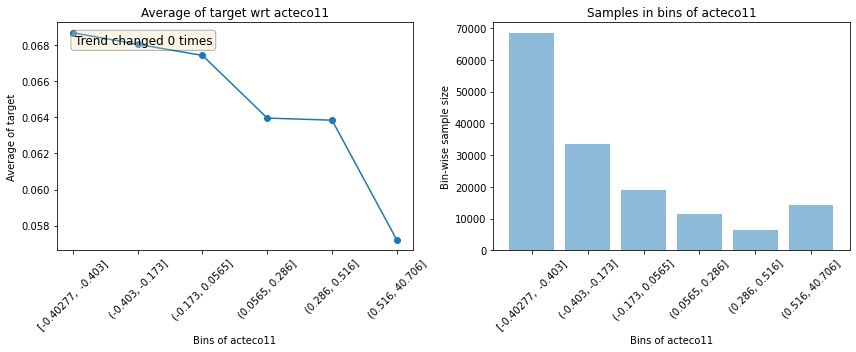

--------------------------------------------------------------------------------------------------------------


                                          Plots for acteco12                                          


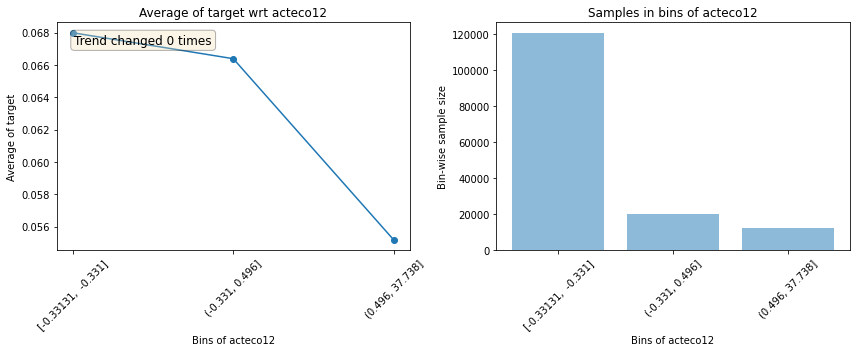

--------------------------------------------------------------------------------------------------------------


                                          Plots for acteco13                                          


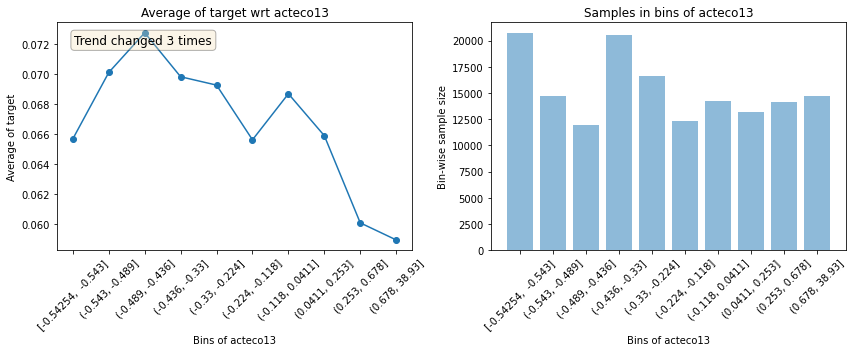

--------------------------------------------------------------------------------------------------------------


                                          Plots for acteco14                                          


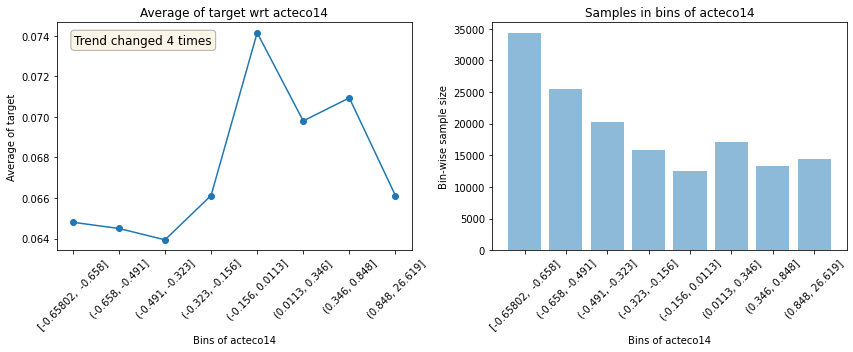

--------------------------------------------------------------------------------------------------------------


                                          Plots for acteco15                                          


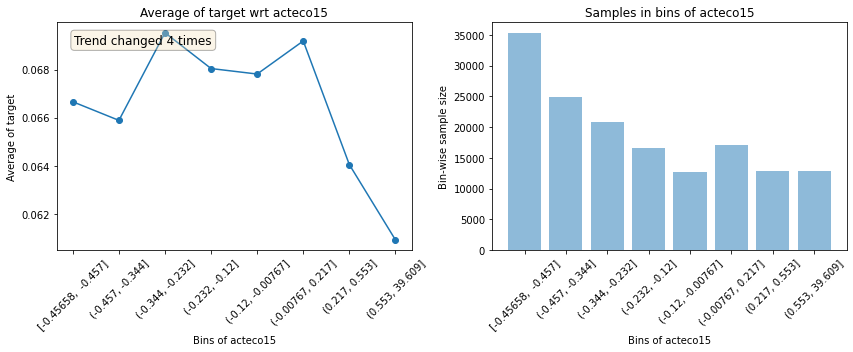

--------------------------------------------------------------------------------------------------------------


                                          Plots for acteco16                                          


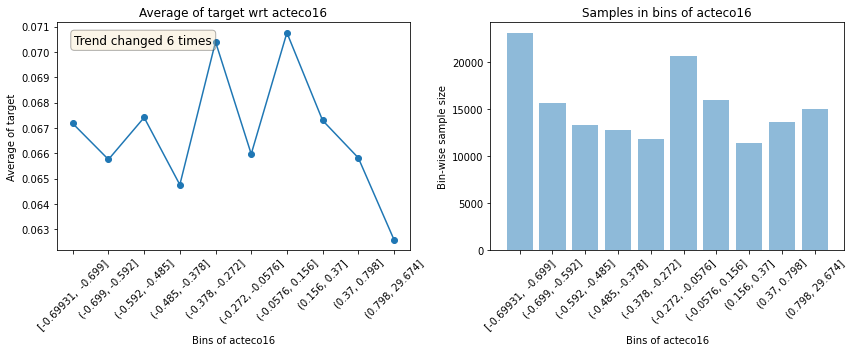

--------------------------------------------------------------------------------------------------------------


                                          Plots for acteco17                                          


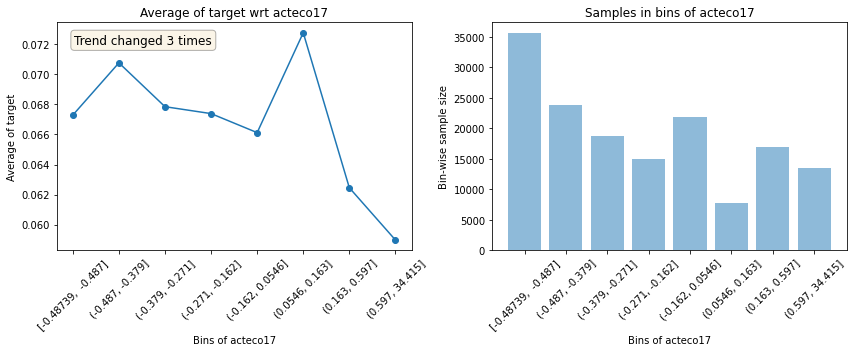

--------------------------------------------------------------------------------------------------------------


                                          Plots for acteco18                                          


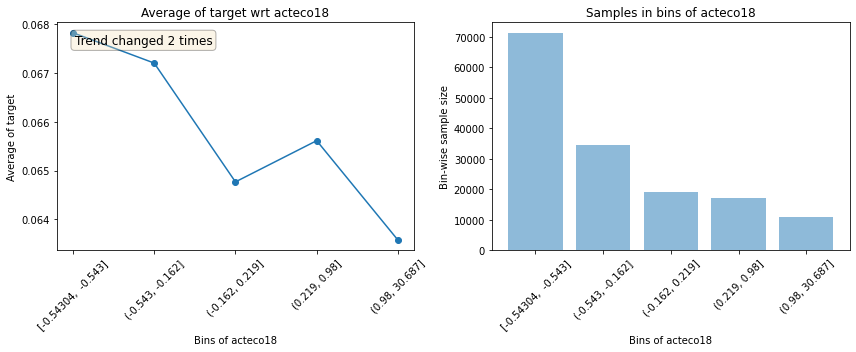

--------------------------------------------------------------------------------------------------------------


                                          Plots for acteco19                                          


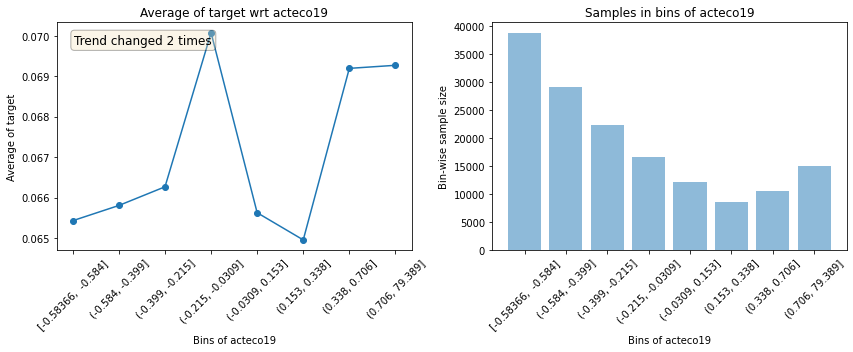

--------------------------------------------------------------------------------------------------------------


                                          Plots for acteco20                                          


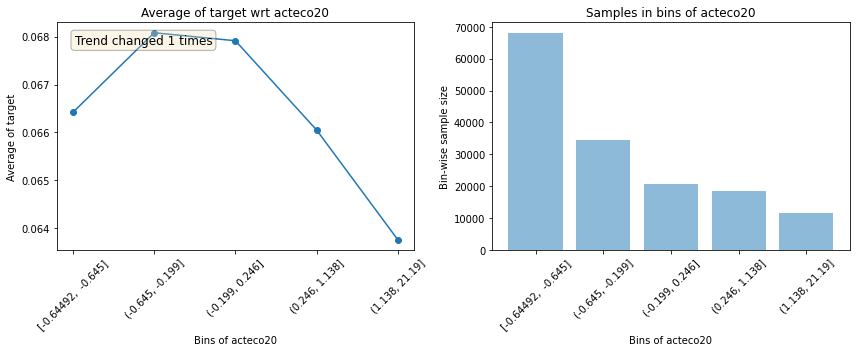

--------------------------------------------------------------------------------------------------------------


                                          Plots for acteco21                                          


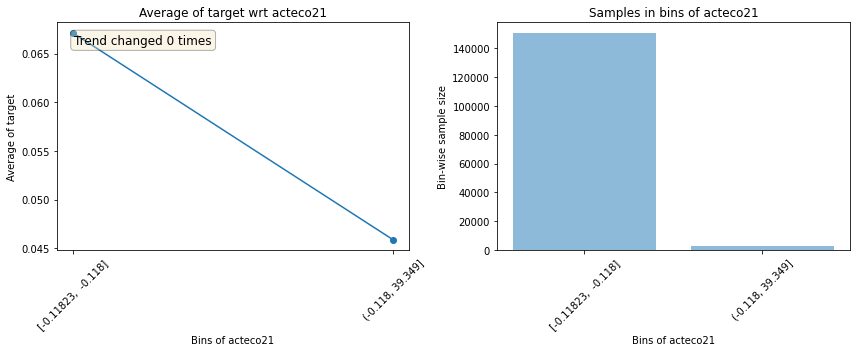

--------------------------------------------------------------------------------------------------------------


                                           Plots for ocup_1                                           


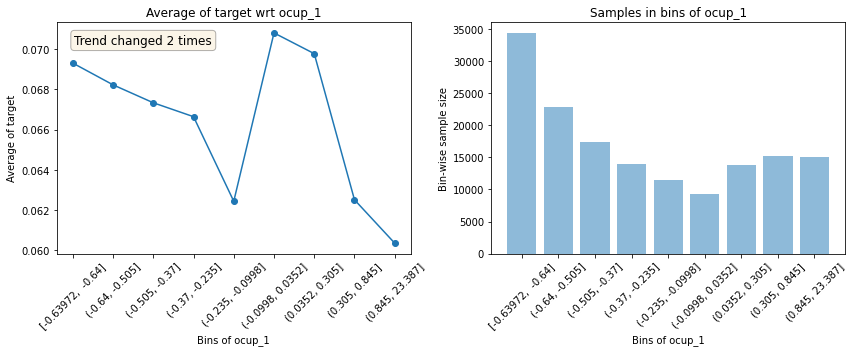

--------------------------------------------------------------------------------------------------------------


                                           Plots for ocup_2                                           


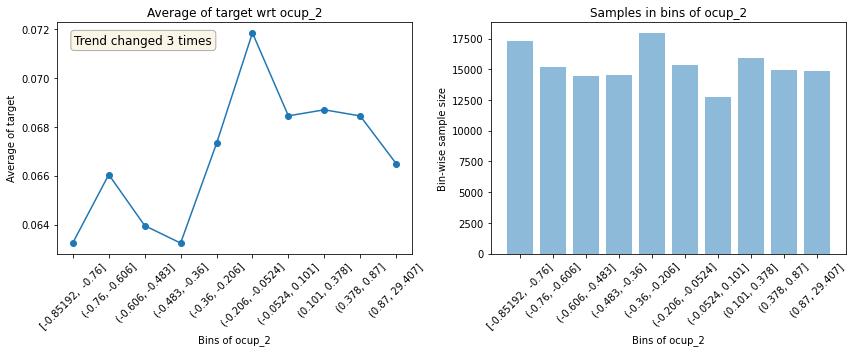

--------------------------------------------------------------------------------------------------------------


                                           Plots for ocup_3                                           


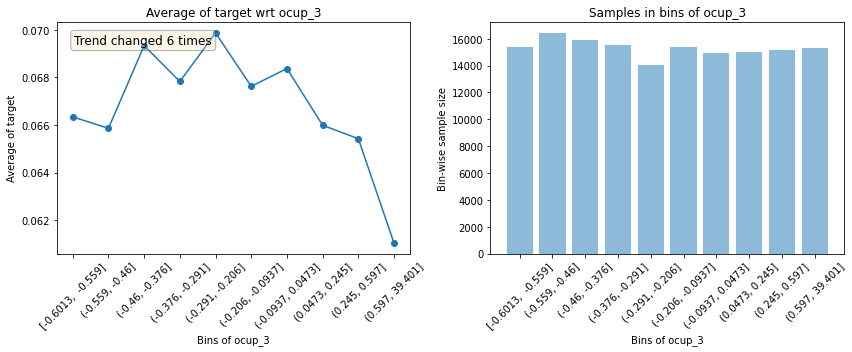

--------------------------------------------------------------------------------------------------------------


                                           Plots for ocup_4                                           


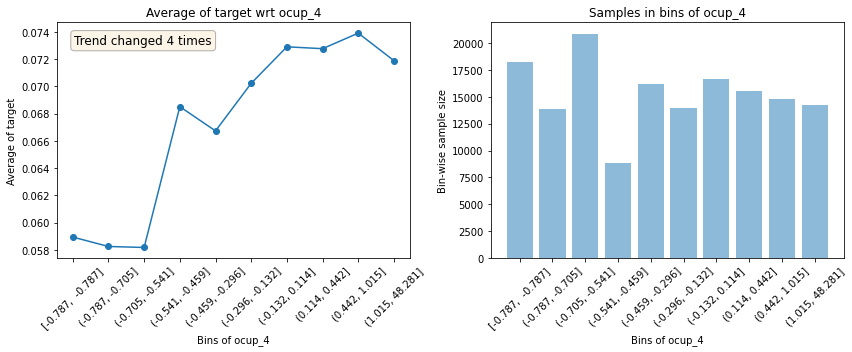

--------------------------------------------------------------------------------------------------------------


                                           Plots for ocup_5                                           


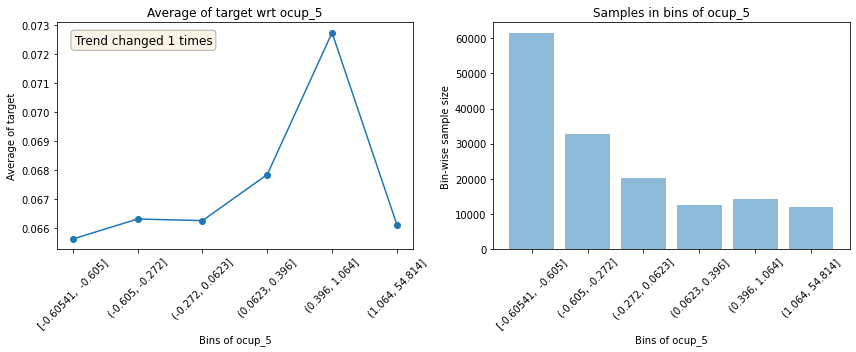

--------------------------------------------------------------------------------------------------------------


                                           Plots for ocup_6                                           


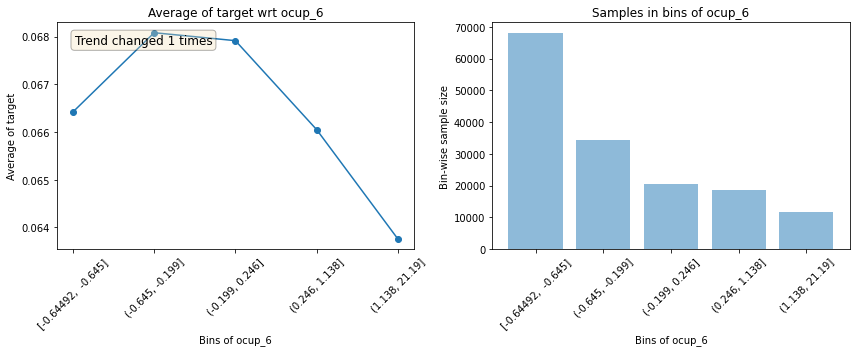

--------------------------------------------------------------------------------------------------------------


                                         Plots for flag_censo                                         


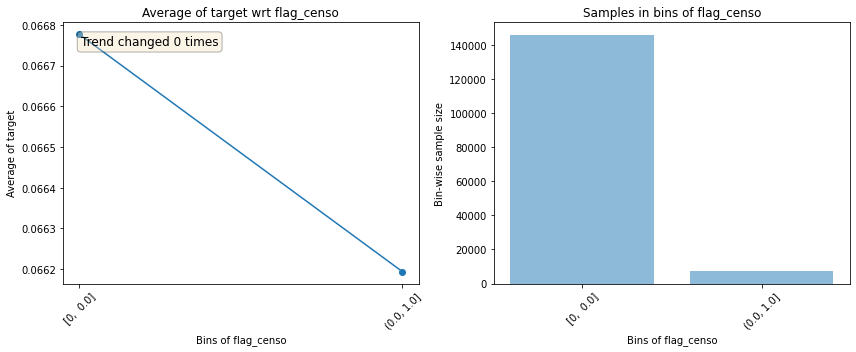

--------------------------------------------------------------------------------------------------------------




In [34]:

get_univariate_plots(data=df_censo_train, target_col='target', features_list=num_cols, bins=10)


In [22]:
#df_censo_train.groupby(pd.qcut(df_censo_train["lon_x"], q=10), as_index=False).agg({"key_value": "count"})

In [18]:
#df_censo_train[[c for c in df_censo_train.columns if c not in total_cols]]
print(df_censo_train[[c for c in df_censo_train.columns if c not in total_cols]].columns.tolist())

['key_value']


In [13]:
num_cols = ["lon_x", "lat_y", 
            "pob", "pob_a", "pob_b", "pob_c", "pob_d", "pob_e", 
            "hog", "a", "b", "c", "d", "e",
            "ing_a_18",
            "gas_ali_a_18", "gas_ves_a_18", "gas_alq_a_18", "gas_mue_a_18", "gas_sal_a_18", "gas_trans_a_18", "gas_esp_a_18", "gas_otrs_a_18",
            "ing_b_18", 
            "gas_ali_b_18", "gas_ves_b_18", "gas_alq_b_18", "gas_mue_b_18", "gas_sal_b_18", "gas_trans_b_18", "gas_esp_b_18", "gas_otrs_b_18", 
            "ing_c_18", 
            "gas_ali_c_18", "gas_ves_c_18", "gas_alq_c_18", "gas_mue_c_18", "gas_sal_c_18", "gas_trans_c_18", "gas_esp_c_18", "gas_otrs_c_18", 
            "ing_d_18", 
            "gas_ali_d_18", "gas_ves_d_18", "gas_alq_d_18", "gas_mue_d_18", "gas_sal_d_18", "gas_trans_d_18", "gas_esp_d_18", "gas_otrs_d_18", 
            "ing_e_18", 
            "gas_ali_e_18", "gas_ves_e_18", "gas_alq_e_18", "gas_mue_e_18", "gas_sal_e_18", "gas_trans_e_18", "gas_esp_e_18", "gas_otrs_e_18", 
            "ing_18", 
            "g1_18", "g2_18", "g3_18", "g4_18", "g5_18", "g6_18", "g7_18", "g8_18",
            "score",
            "viviendas", "nhogares", "dehogar1", "dehogar2", "dehogar3", "dehogar4", "dehogar5", "dehogar6", "dehogar7", "dehogar8",
            'tipviv1', 'tipviv2', 'tipviv3', 'tipviv4', 'tipviv6', 'tipviv7', 'tipviv9',
            'matpar1', 'matpar2', 'matpar3', 'matpar4', 'matpar5', 'matpar6', 'matpar7', 'matpar8',
            'matpis1', 'matpis2', 'matpis3', 'matpis4', 'matpis5', 'matpis6', 'matpis7',
            'abaagu1', 'abaagu2', 'abaagu3', 'abaagu4', 'abaagu5', 'abaagu6', 'abaagu7', 'abaagu8', 'abaagu9',
            'vivten1', 'vivten2', 'vivten3', 'vivten4', 'vivten5',
            'totper',
            'mattec1', 'mattec2', 'mattec3', 'mattec4', 'mattec5', 'mattec6', 'mattec7', 'mattec8',
            'agudia1', 'agudia2', 
            'agundia1', 'agundia2', 'agundia3', 'agundia4', 'agundia5', 'agundia6',
            'pagagusi', 'pagaguno', 
            'pagagu1', 'pagagu2', 'pagagu3', 'pagagu4', 'pagagu5',
            'hig1', 'hig2', 'hig3', 'hig4', 'hig5', 'hig6', 'hig7', 'hig8',
            'alupusi', 'alupuno', 
            'equiten', 'equiteno', 
            'tvten', 'tvteno', 
            'cocten', 'cocteno', 
            'reften', 'refteno', 
            'lavten', 'lavteno', 
            'horten', 'horteno', 
            'licten', 'licteno', 
            'platen', 'plateno', 
            'compten', 'compteno', 
            'celten', 'celteno', 
            'tefijten', 'tefijteno', 
            'cabten', 'cabteno', 
            'intten', 'intteno', 
            'autten', 'autteno', 
            'motten', 'motteno', 
            'lanten', 'lanteno',
            'inf', 'nin', 'ado', 'jov', 'adujov', 'adu', 'adumay', 
            'pafisis_no', 'pafisis', 'paess_no', 'paess', 'pafue_no', 'pafue', 'papri_no', 'papri', 'paotr_no', 'paotr', 'panin_no', 'panin', 
            'lee_si', 'lee_no',
            'estud_1', 'estud_2', 'estud_3', 'estud_4', 'estud_5', 'estud_6', 'estud_7', 'estud_8', 'estud_9', 'estud_10',
            'profe_1', 'profe_2', 'profe_3', 'profe_4', 'profe_5', 'profe_6', 'profe_7', 'profe_8', 'profe_9', 'profe_10',
            'acteco1', 'acteco2', 'acteco3', 'acteco4', 'acteco5', 'acteco6', 'acteco7', 'acteco8', 'acteco9', 'acteco10', 'acteco11', 'acteco12', 'acteco13', 'acteco14', 'acteco15', 'acteco16', 'acteco17', 'acteco18', 'acteco19', 'acteco20', 'acteco21',
            'ocup_1', 'ocup_2', 'ocup_3', 'ocup_4', 'ocup_5', 'ocup_6',
            'flag_censo'
            ]

In [15]:
cat_cols = [
            "pred"
            ]

In [16]:
dum_cols = [
            "zon_sis", "zon_der", "zon_inu", "zon_com"
            ]

In [17]:
total_cols = num_cols + cat_cols + dum_cols

In [ ]:
df_censo_train.shape, df_censo_train["key_value"].nunique()

((153139, 256), 153139)

In [ ]:
df_censo_test.shape, df_censo_test["key_value"].nunique()

((200499, 256), 200499)

## Todos los Datasets

In [ ]:
!ls -lh '[01] Intermediate'

total 2.0G
-rw------- 1 root root 521M Dec 20 17:16 ds_rcc.csv
-rw------- 1 root root 185M Dec 18 16:51 ds_rcc_instit.csv
-rw------- 1 root root 204M Dec 18 16:51 ds_rcc_instit_test.csv
-rw------- 1 root root 576M Dec 20 17:18 ds_rcc_test.csv
-rw------- 1 root root  22M Dec 20 13:20 ds_se.csv
-rw------- 1 root root  24M Dec 20 13:20 ds_se_test.csv
-rw------- 1 root root  18M Dec 31 19:34 ds_sunat.csv
-rw------- 1 root root  20M Dec 31 19:34 ds_sunat_test.csv
-rw------- 1 root root 192M Dec 31 13:48 rcc_product_level.csv
-rw------- 1 root root 212M Dec 31 17:27 rcc_product_level_test.csv


---